# $\textbf{Cost Sensitive Logistic Regression}$

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import torch
from sklearn.model_selection import train_test_split

# $\textbf{Dataset Description}$

Basic statistics:
            NotCount       YesCount           ATPM            PFD  \
count  147636.000000  147636.000000  147636.000000  147636.000000   
mean        7.722107      15.220908       0.253245       0.027062   
std         7.574278       7.596921       0.366280       0.335509   
min         0.000000       0.000000       0.000000       0.000000   
25%         2.000000      10.000000       0.001084       0.000000   
50%         4.000000      19.000000       0.033354       0.000000   
75%        13.000000      21.000000       0.394372       0.000000   
max        23.000000      22.000000       1.000000      79.837480   

                 PFG            SFD            SFG             WP  \
count  147636.000000  147636.000000  147636.000000  147636.000000   
mean        0.050789       0.021648       0.071709       0.271927   
std         0.373370       0.298285       1.135755       2.432425   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.0

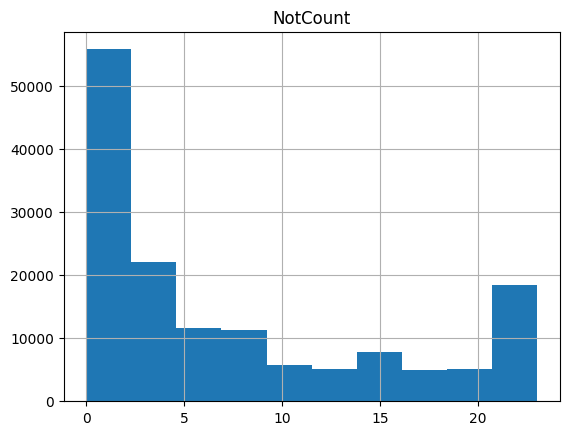

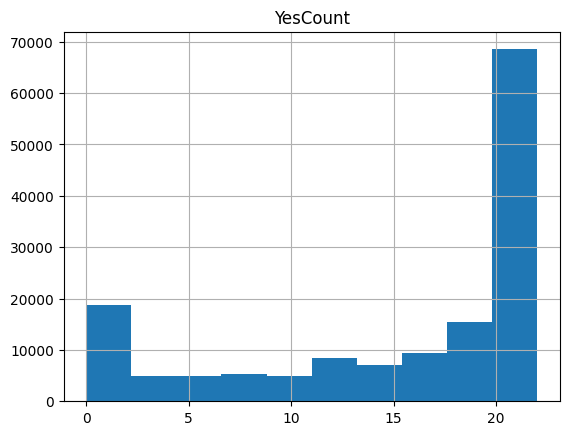

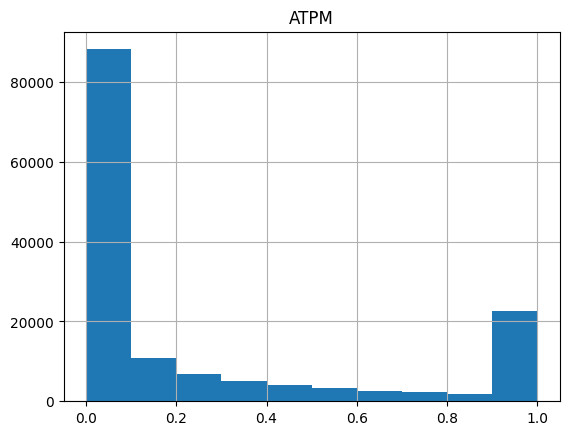

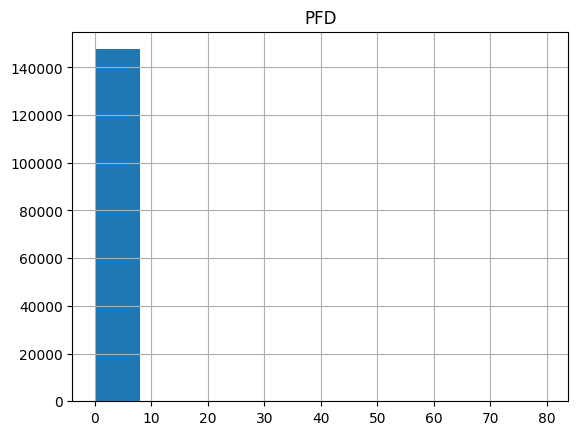

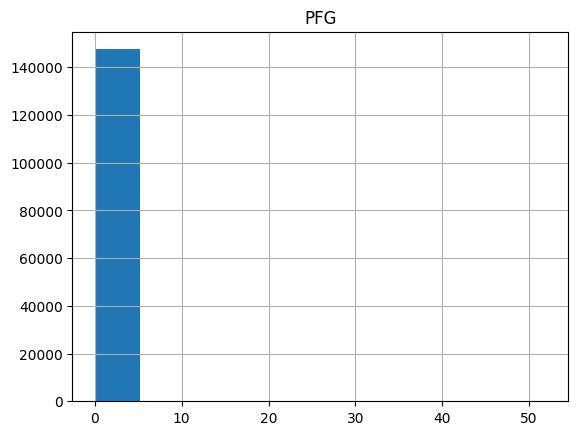

...

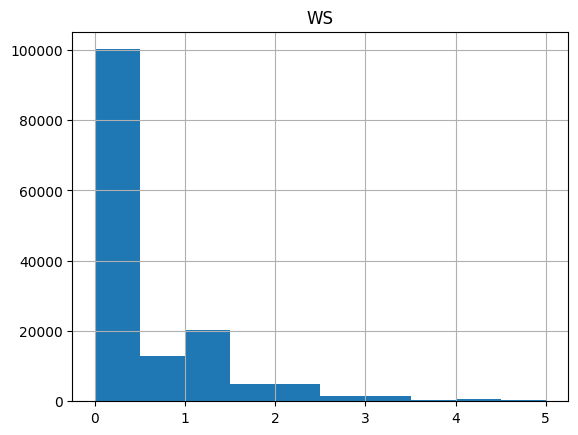

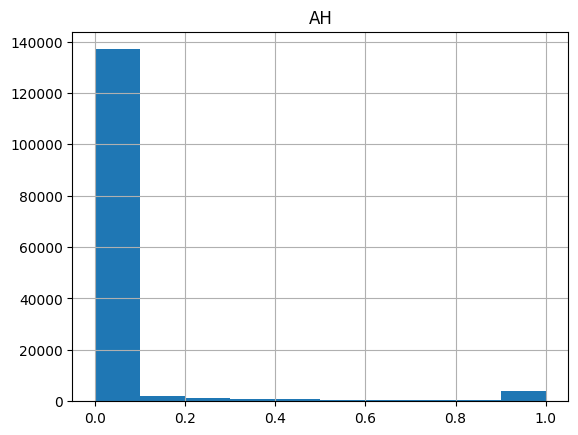

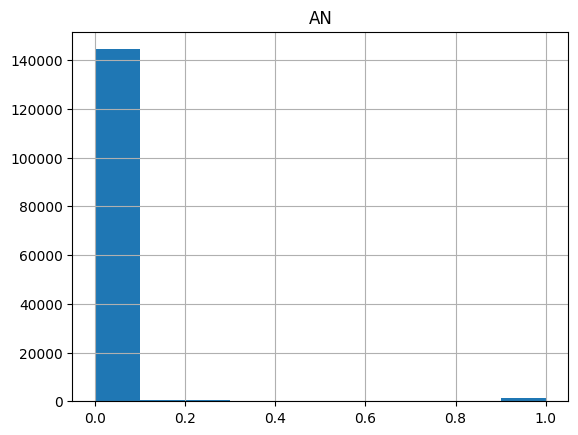

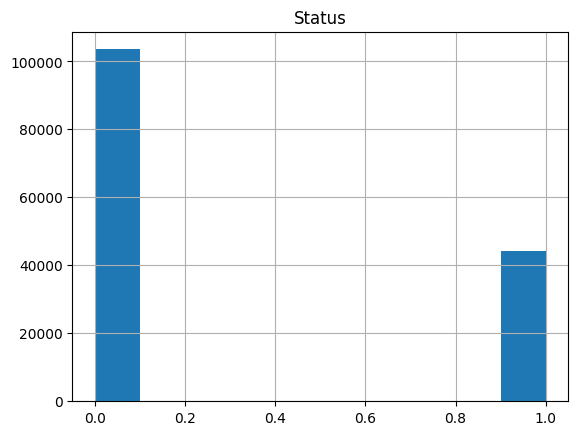

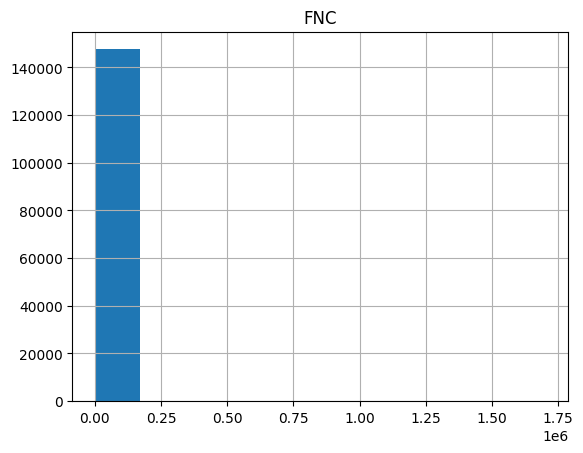


Boxplots:


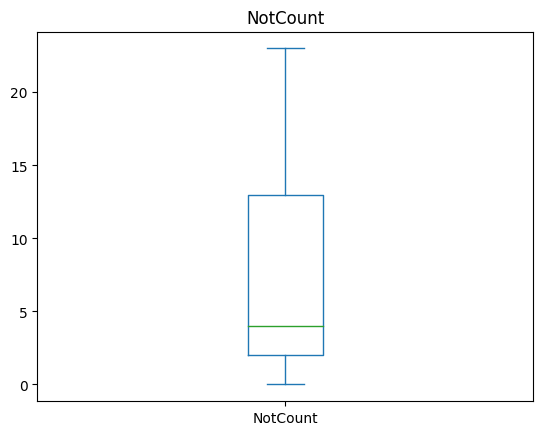

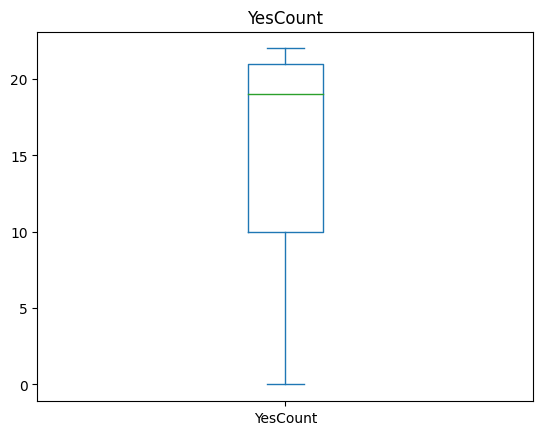

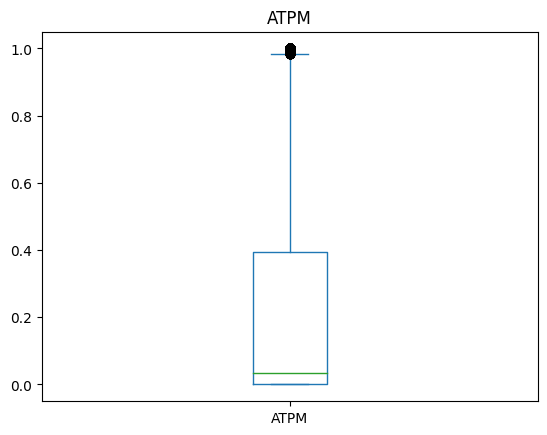

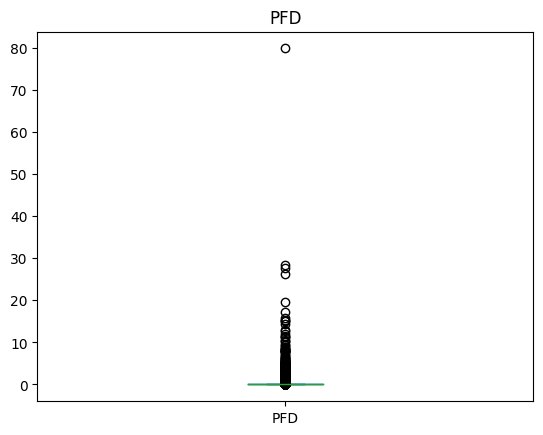

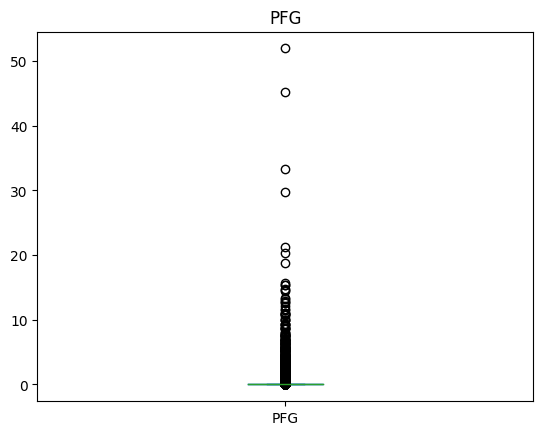

...

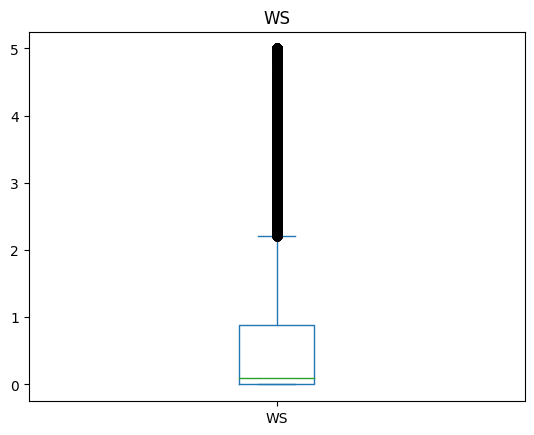

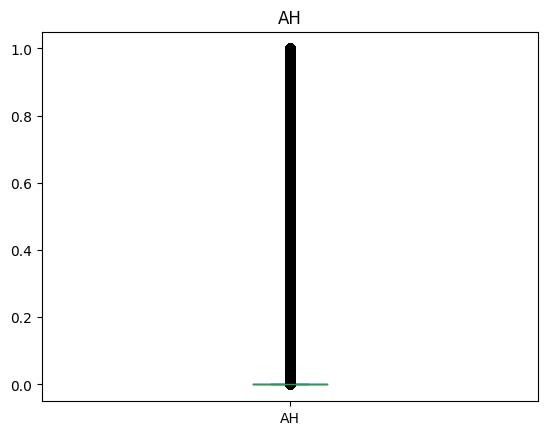

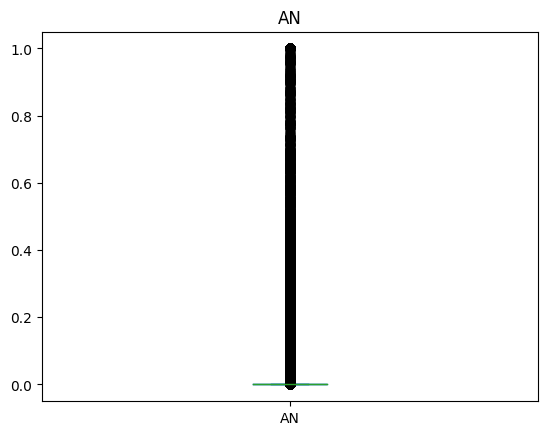

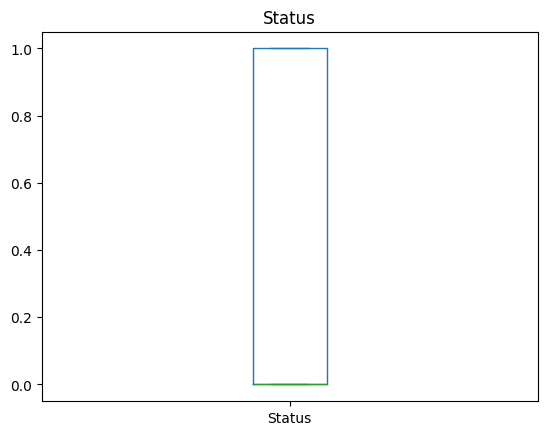

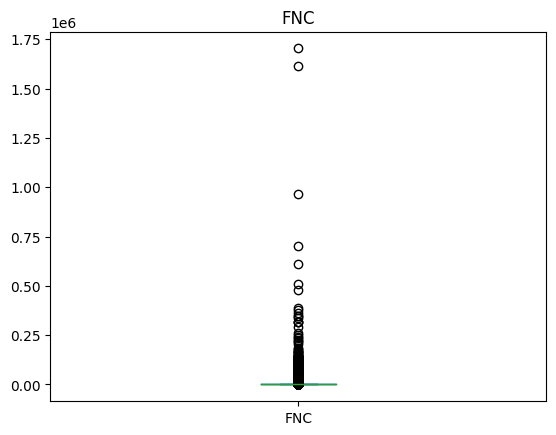

In [ ]:
# Load the data into a pandas DataFrame
dataset = pd.read_csv('costsensitiveregression.csv')

## Basic statistics
print("Basic statistics:")
print(dataset.describe(include='all'))

## Missing values
print("\nMissing values:")
print(dataset.isnull().sum())

## Unique values
print("\nUnique values:")
print(dataset.nunique())

## Correlations
print("\nCorrelations:")
print(dataset.corr())

## Value frequency
print("\nValue frequency:")
for col in dataset.columns:
    print(dataset[col].value_counts())

## Histograms
print("\nHistograms:")
for col in dataset.columns:
    dataset[col].hist()
    plt.title(col)
    plt.show()

## Boxplots
print("\nBoxplots:")
for col in dataset.columns:
    dataset[col].plot(kind='box')
    plt.title(col)
    plt.show()

In [ ]:
# Dataset statistics
print("Dataset statistics:")
print(f"Number of variables:\t\t{len(dataset.columns)}")
print(f"Number of observations:\t\t{len(dataset)}")
print(f"Missing cells:\t\t\t{dataset.isnull().sum().sum()}")
print(f"Missing cells (%):\t\t{dataset.isnull().sum().sum() / (len(dataset) * len(dataset.columns)):.1%}")
duplicated_rows = dataset[dataset.duplicated()]
print(f"Duplicate rows:\t\t\t{len(duplicated_rows)}")
print(f"Duplicate rows (%):\t\t{len(duplicated_rows) / len(dataset):.1%}")
print(f"Total size in memory:\t\t{dataset.memory_usage(deep=True).sum() / (1024*1024):.1f} MiB")
print(f"Average record size in memory:\t{dataset.memory_usage(deep=True).sum() / len(dataset):.1f} B")

Dataset statistics:
Number of variables:		13
Number of observations:		147636
Missing cells:			0
Missing cells (%):		0.0%
Duplicate rows:			21621
Duplicate rows (%):		14.6%
Total size in memory:		14.6 MiB
Average record size in memory:	104.0 B


In [ ]:
# Variables statistics
for col in dataset.columns:
    print(f"\nVariable: {col}")
    print(f"Distinct:\t{dataset[col].nunique()}")
    print(f"Distinct (%):\t{dataset[col].nunique() / len(dataset):.1%}")
    print(f"Missing:\t{dataset[col].isnull().sum()}")
    print(f"Missing (%):\t{dataset[col].isnull().sum() / len(dataset):.1%}")
    print(f"Infinite:\t{np.isinf(dataset[col]).sum()}")
    print(f"Infinite (%):\t{np.isinf(dataset[col]).sum() / len(dataset):.1%}")
    print(f"Mean:\t\t{dataset[col].mean()}")
    print(f"Minimum:\t{dataset[col].min()}")
    print(f"Maximum:\t{dataset[col].max()}")
    print(f"Zeros:\t\t{len(dataset[dataset[col] == 0])}")
    print(f"Zeros (%):\t{len(dataset[dataset[col] == 0]) / len(dataset):.1%}")
    print(f"Negative:\t{len(dataset[dataset[col] < 0])}")
    print(f"Negative (%):\t{len(dataset[dataset[col] < 0]) / len(dataset):.1%}")
    print(f"Memory size:\t{dataset[col].memory_usage(deep=True) / (1024):.1f} KiB")


Variable: NotCount
Distinct:	24
Distinct (%):	0.0%
Missing:	0
Missing (%):	0.0%
Infinite:	0
Infinite (%):	0.0%
Mean:		7.722107074155355
Minimum:	0
Maximum:	23
Zeros:		1121
Zeros (%):	0.8%
Negative:	0
Negative (%):	0.0%
Memory size:	1153.5 KiB

Variable: YesCount
Distinct:	23
Distinct (%):	0.0%
Missing:	0
Missing (%):	0.0%
Infinite:	0
Infinite (%):	0.0%
Mean:		15.220908179576798
Minimum:	0
Maximum:	22
Zeros:		11519
Zeros (%):	7.8%
Negative:	0
Negative (%):	0.0%
Memory size:	1153.5 KiB

Variable: ATPM
Distinct:	22145
Distinct (%):	15.0%
Missing:	0
Missing (%):	0.0%
Infinite:	0
Infinite (%):	0.0%
Mean:		0.2532453311726137
Minimum:	0.0
Maximum:	1.0
Zeros:		24628
Zeros (%):	16.7%
Negative:	0
Negative (%):	0.0%
Memory size:	1153.5 KiB

Variable: PFD
Distinct:	11948
Distinct (%):	8.1%
Missing:	0
Missing (%):	0.0%
Infinite:	0
Infinite (%):	0.0%
Mean:		0.02706191254165651
Minimum:	0.0
Maximum:	79.83748
Zeros:		126832
Zeros (%):	85.9%
Negative:	0
Negative (%):	0.0%
Memory size:	1153.5 KiB

Vari

Variable: NotCount



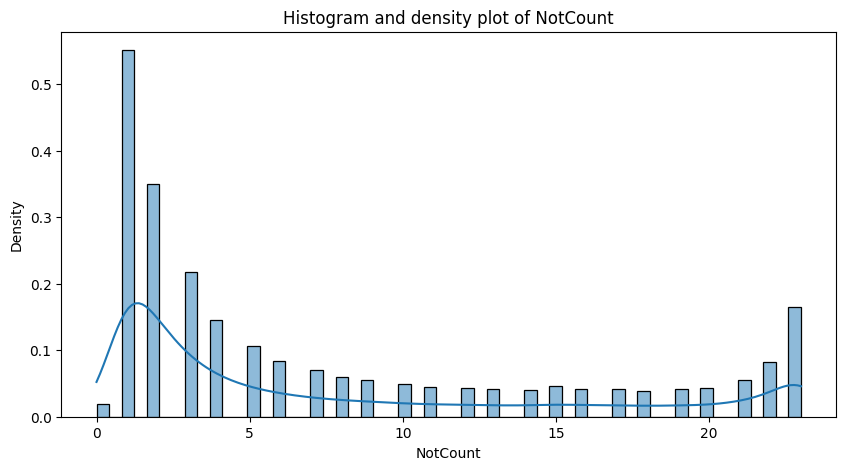

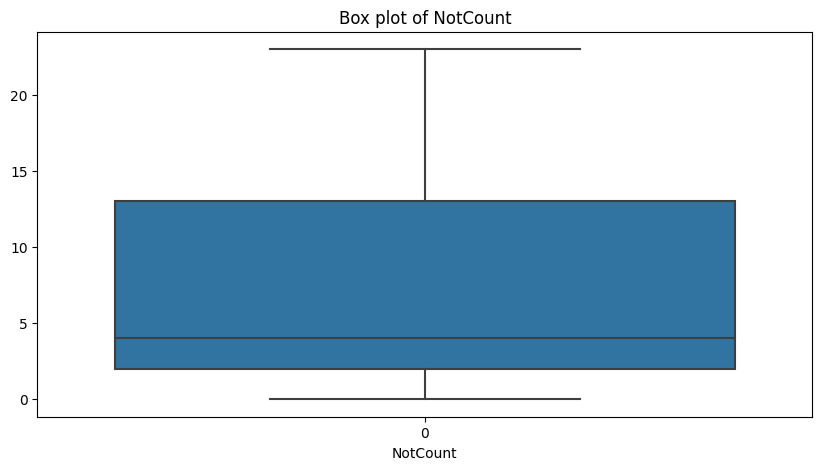

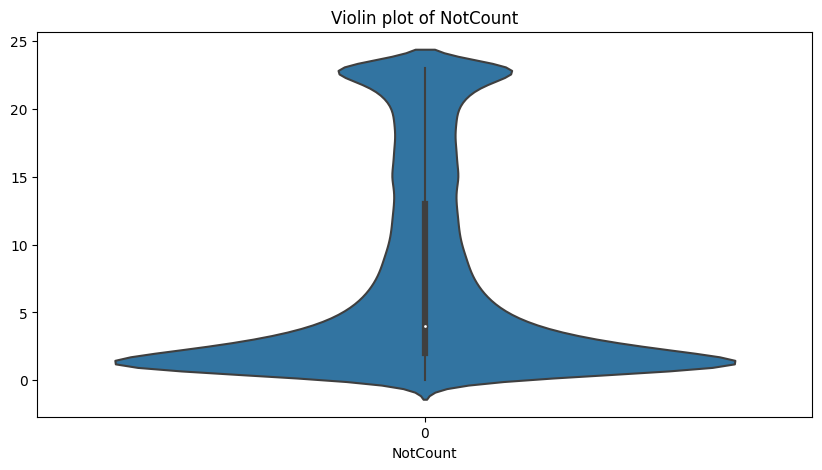

Variable: YesCount



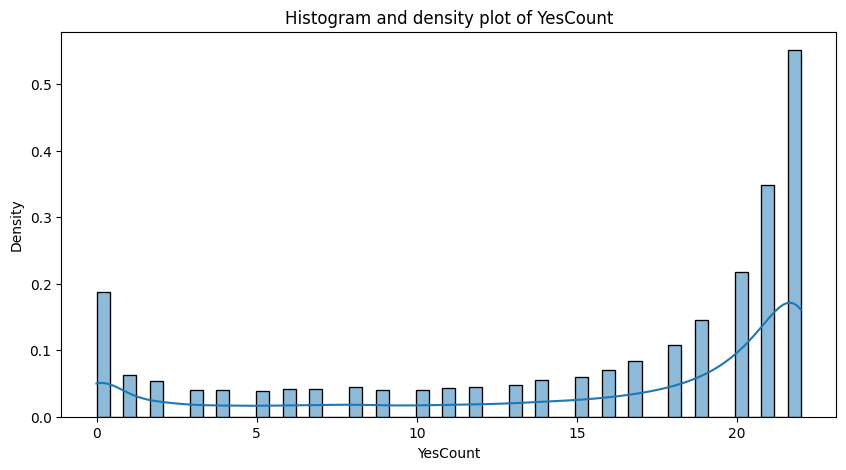

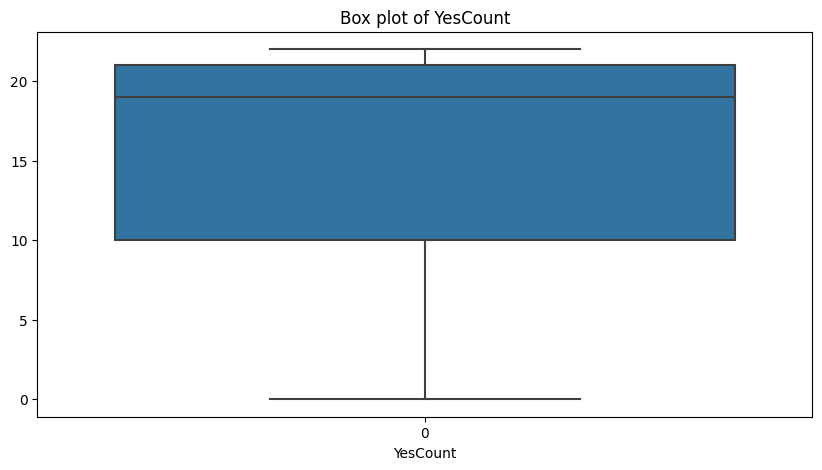

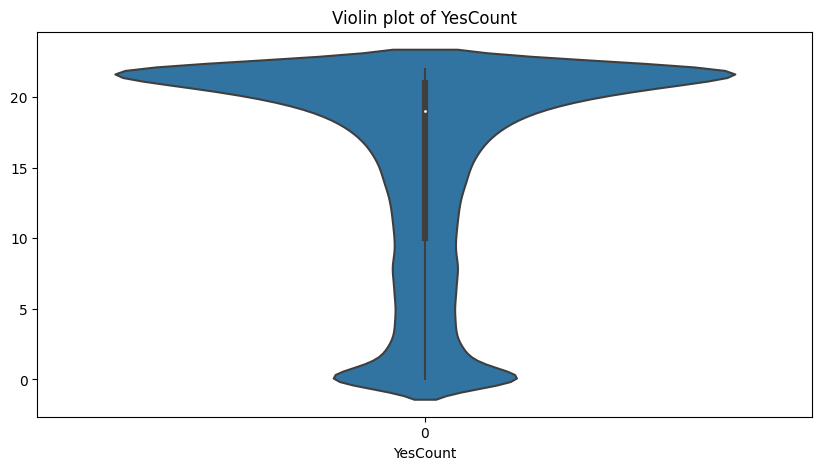

Variable: ATPM



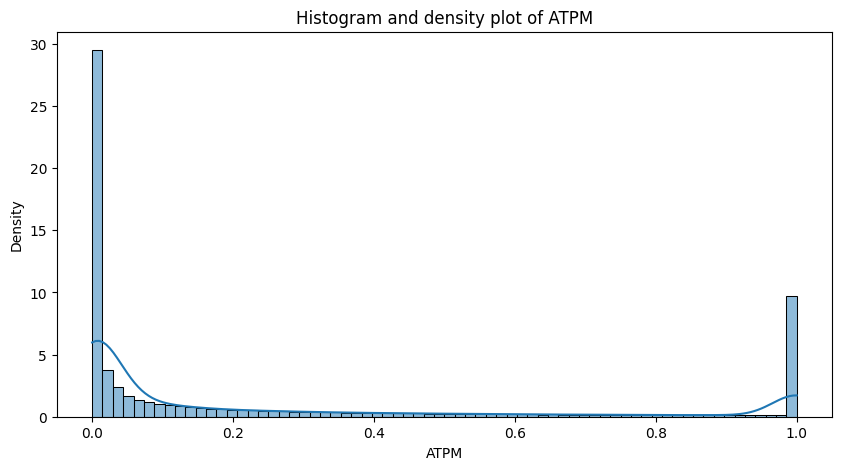

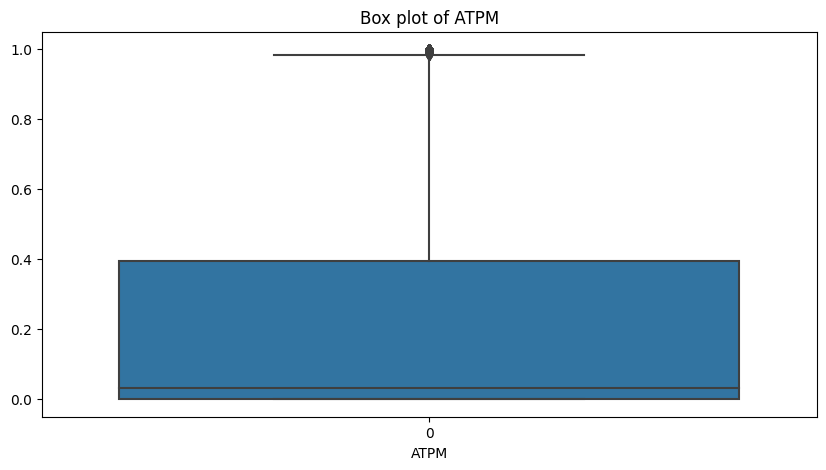

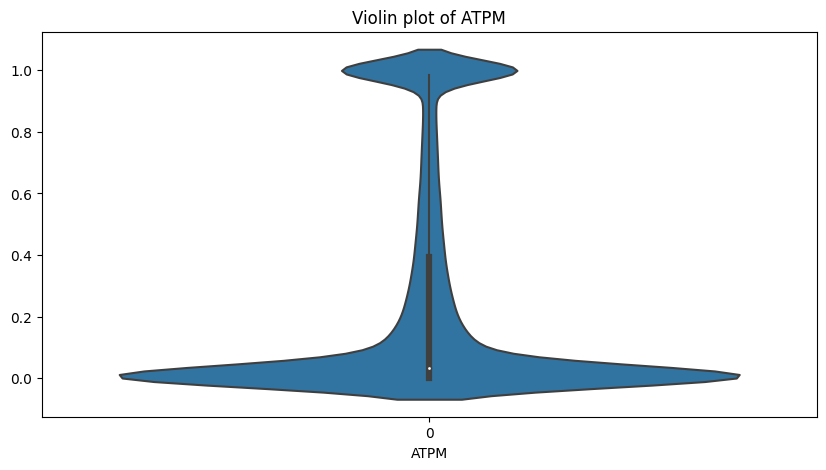

Variable: PFD



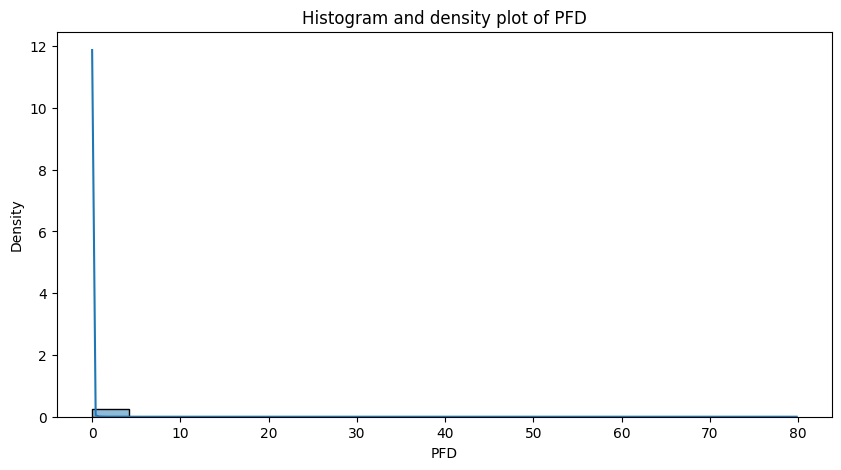

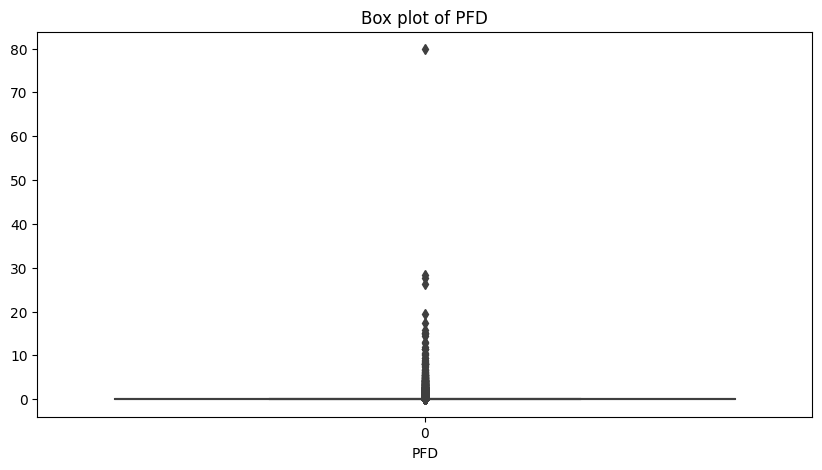

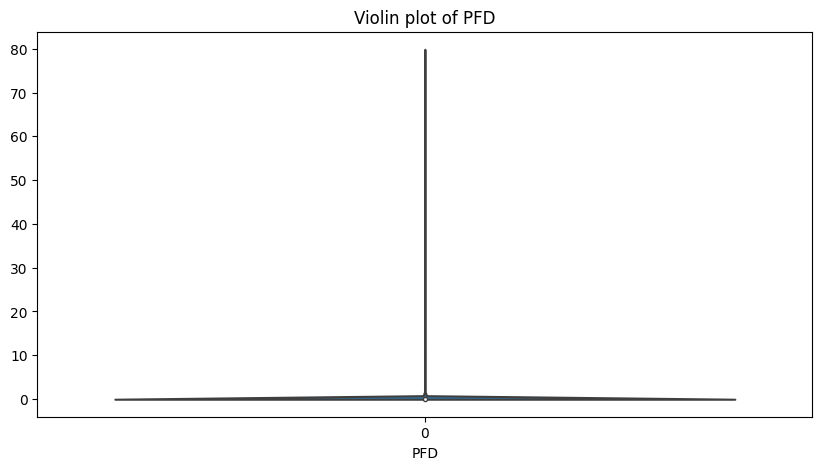

Variable: PFG



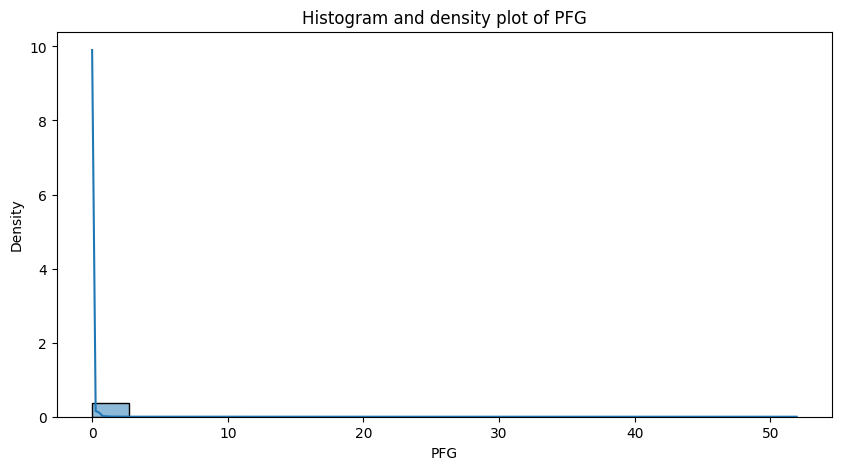

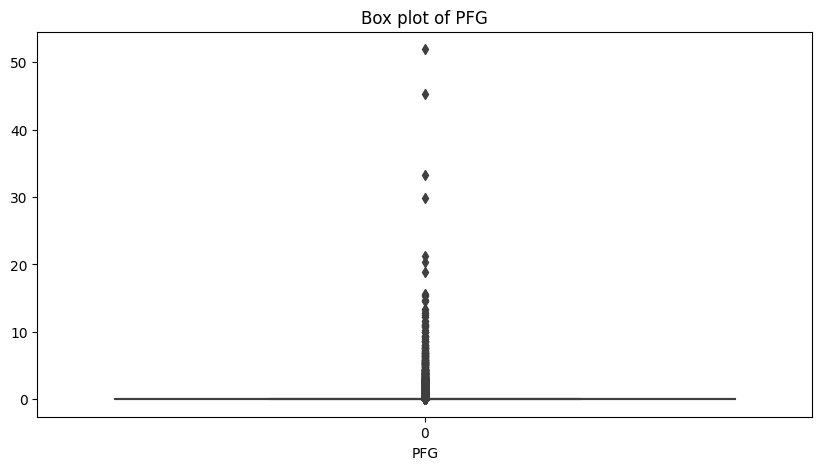

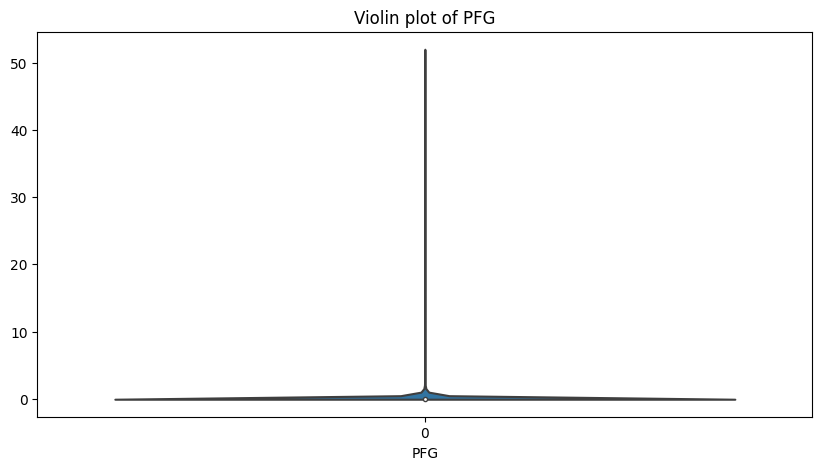

Variable: SFD



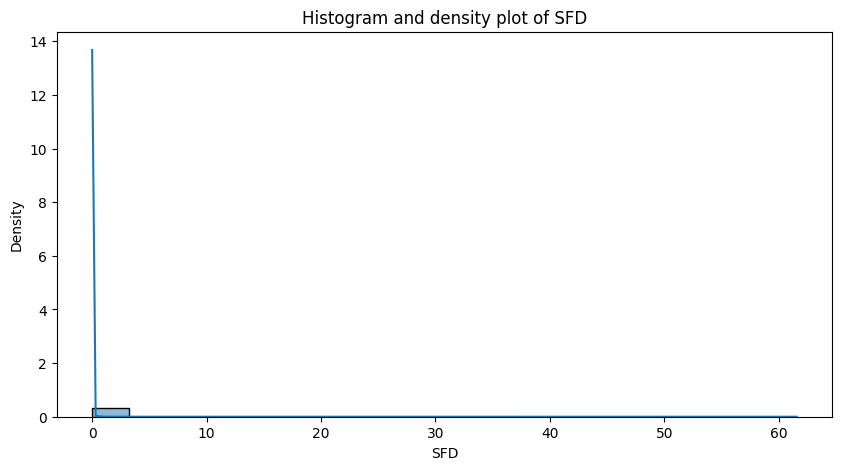

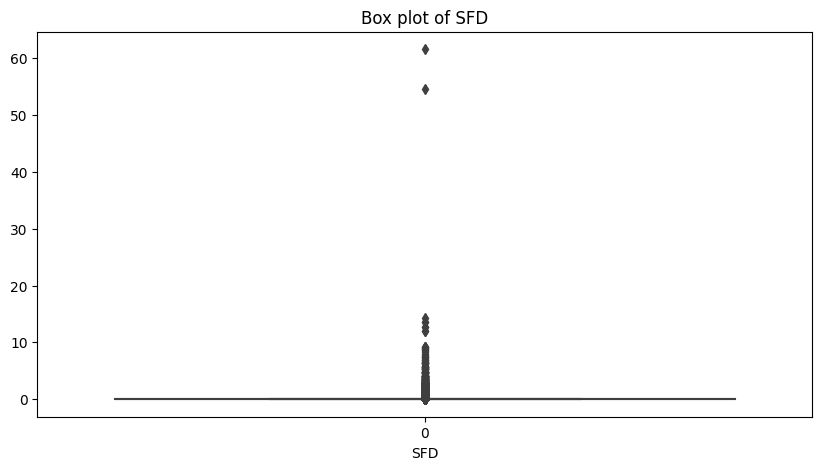

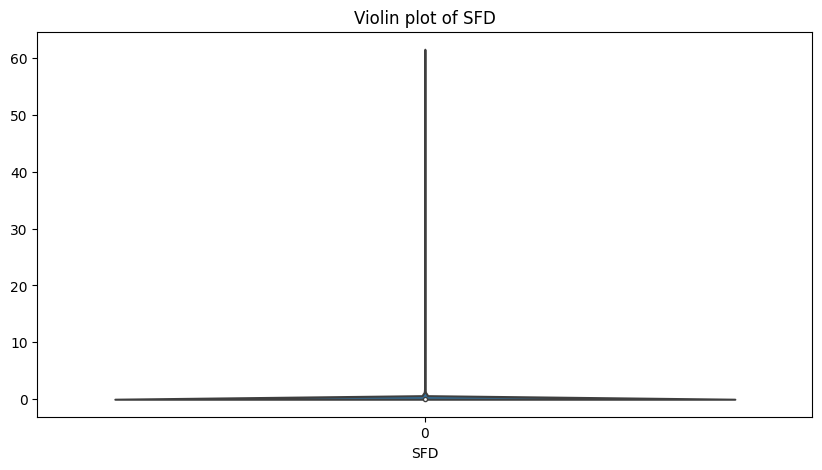

Variable: SFG



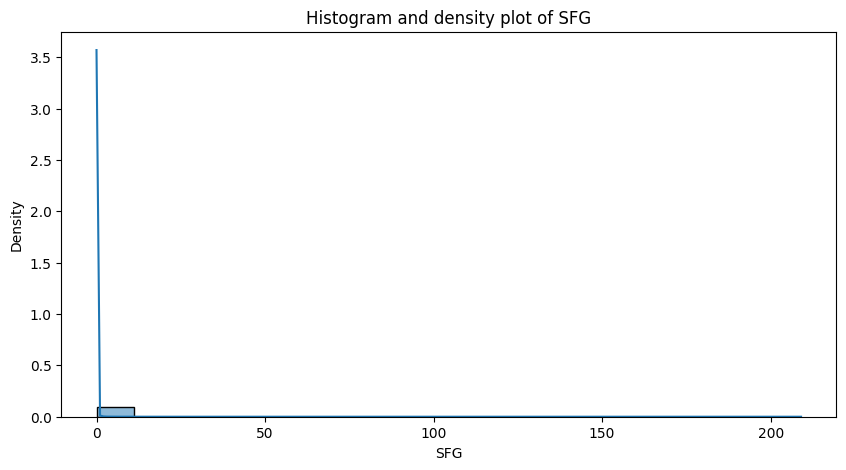

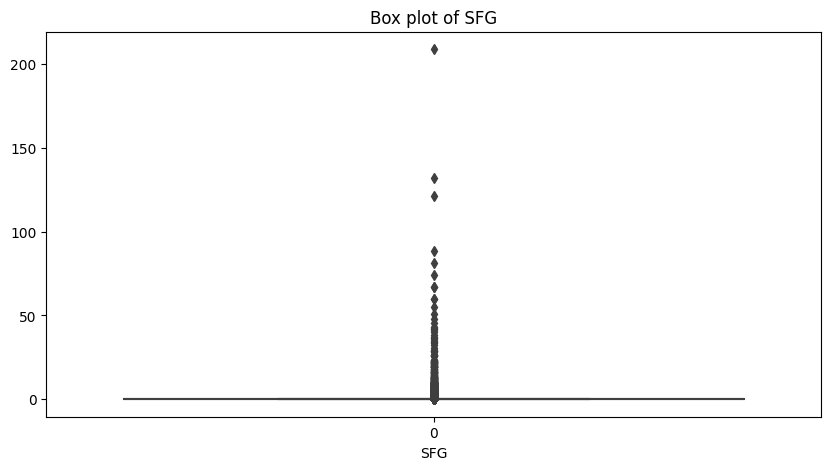

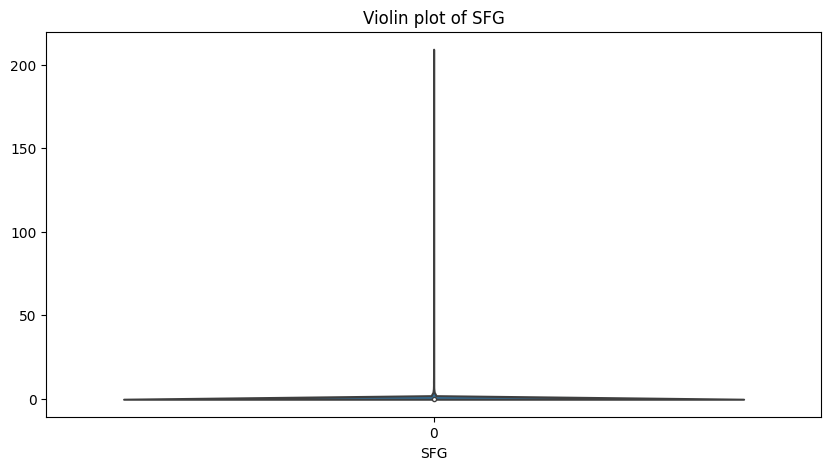

Variable: WP



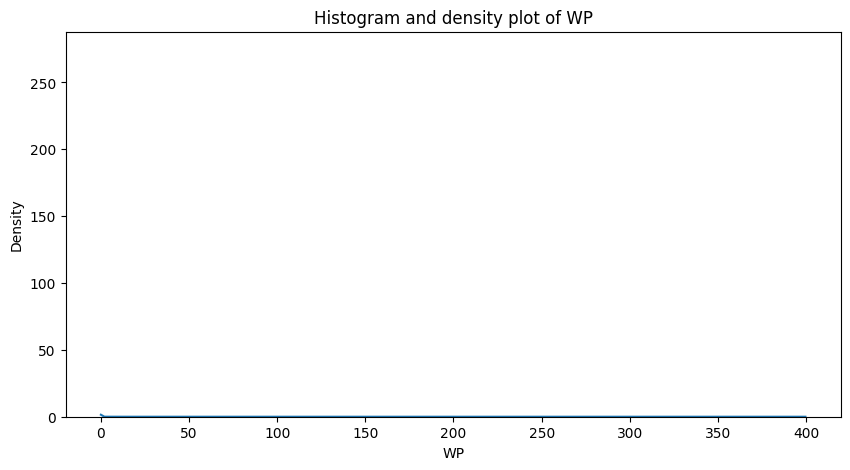

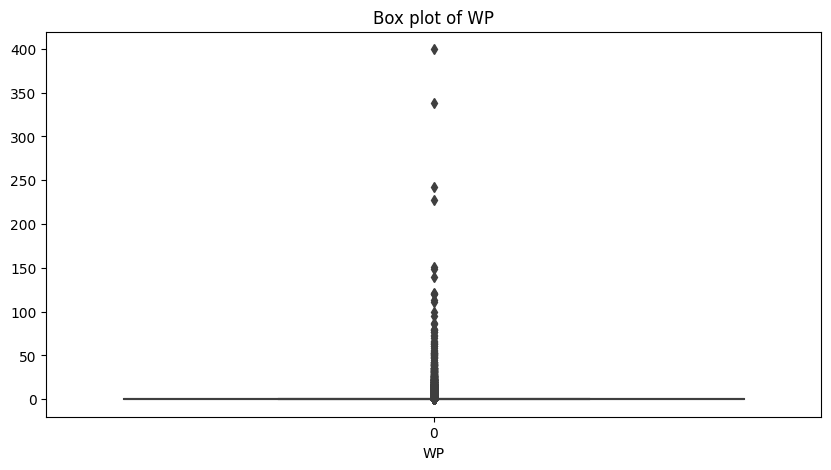

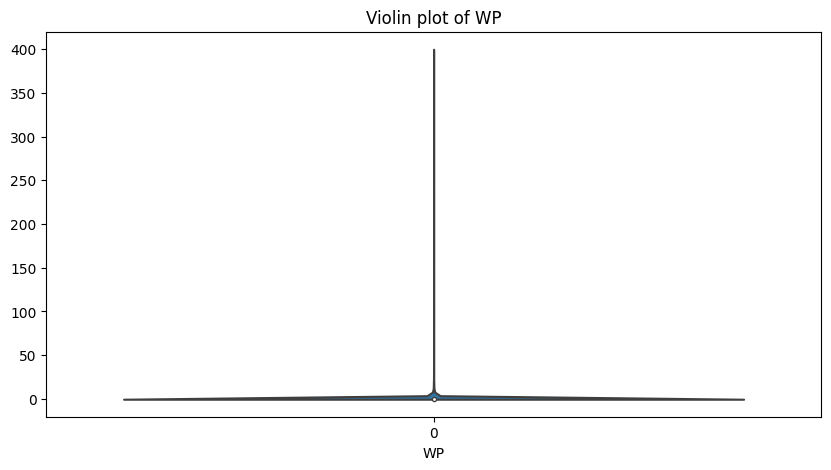

Variable: WS



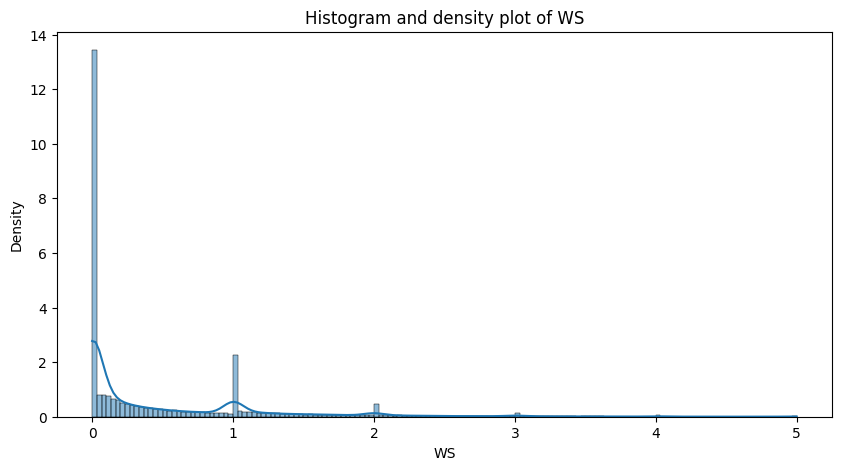

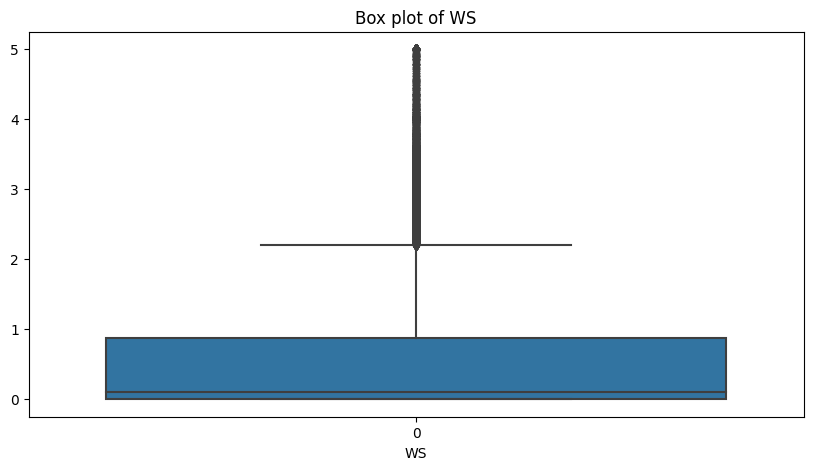

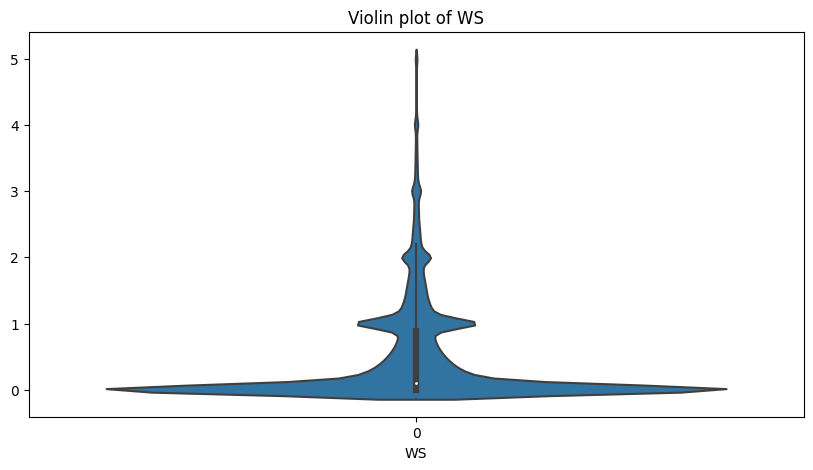

Variable: AH



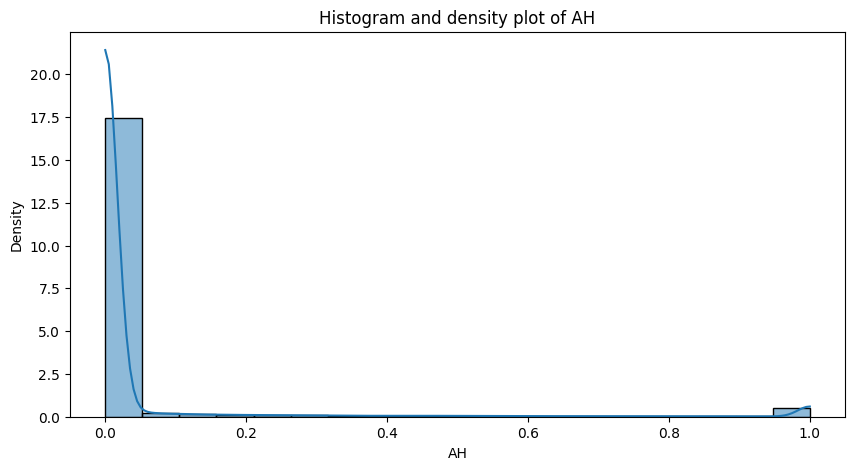

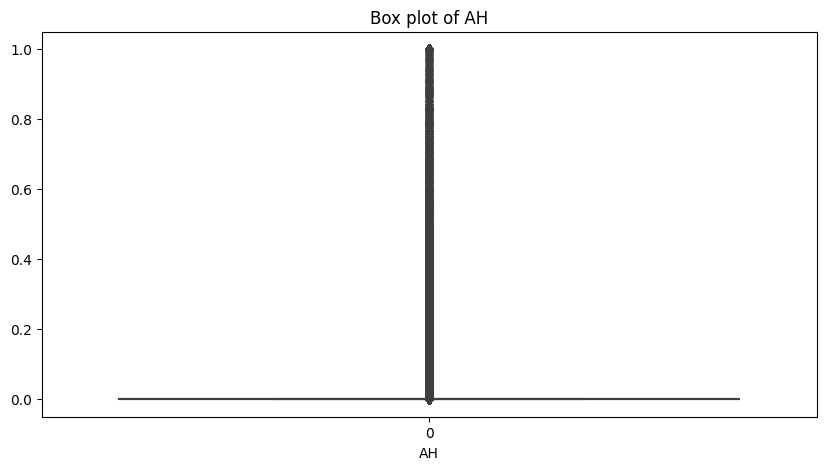

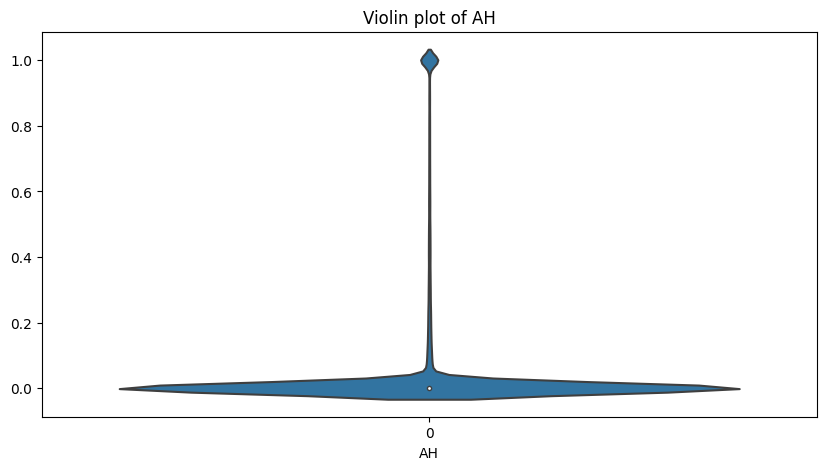

Variable: AN



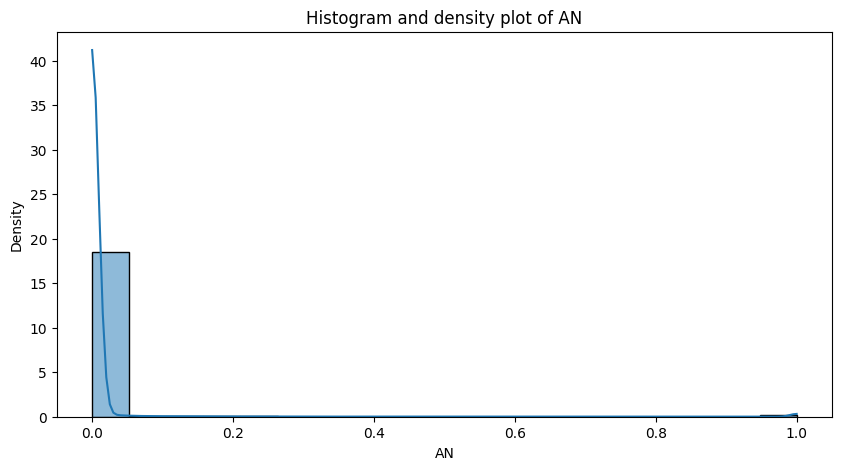

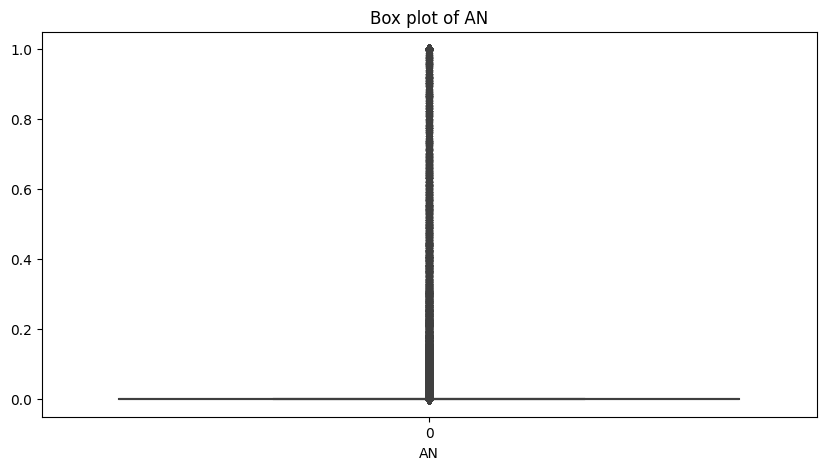

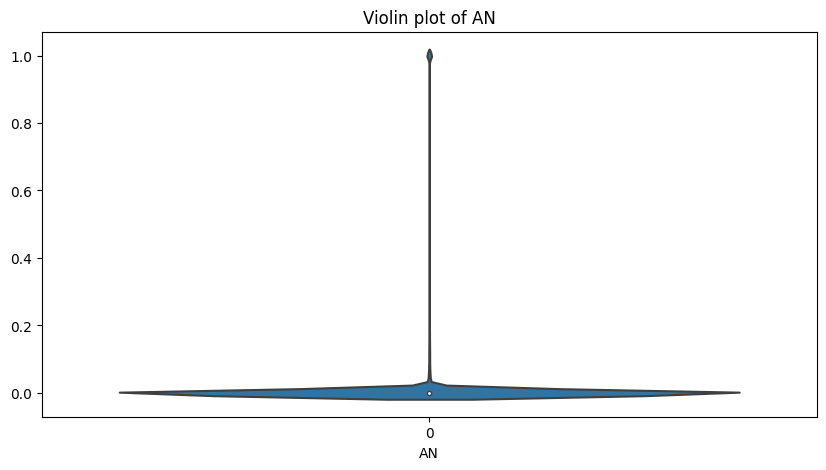

Variable: Status



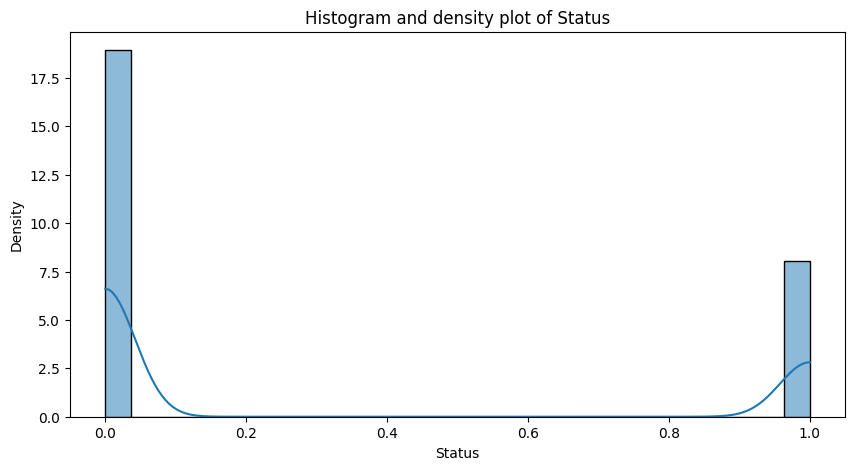

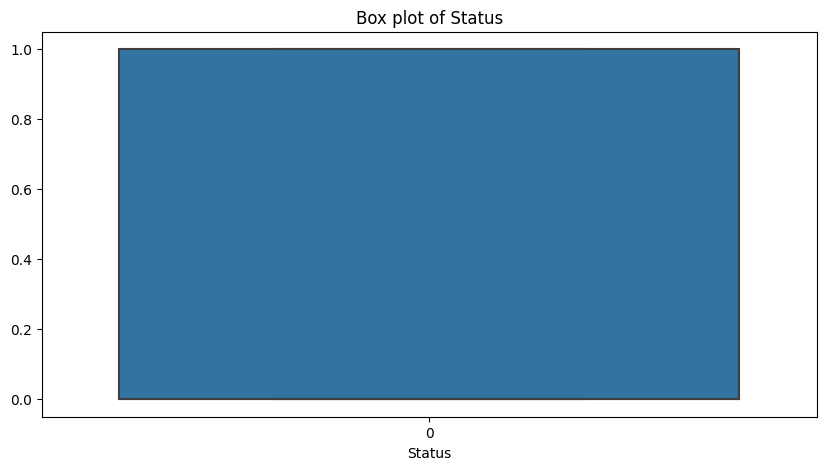

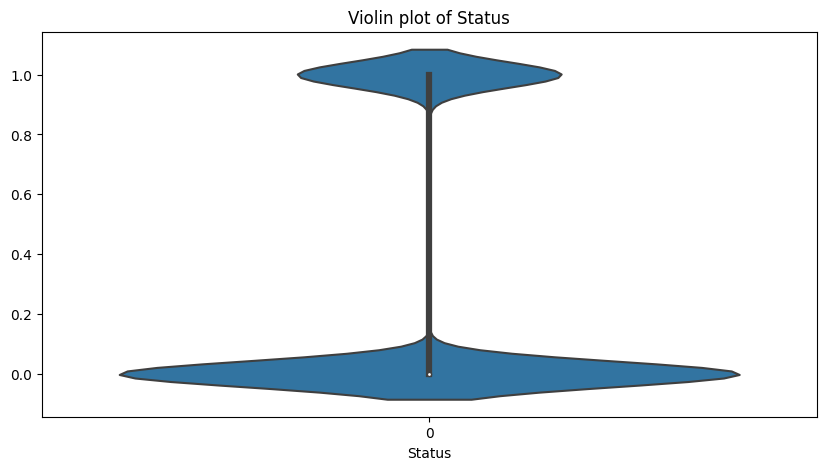

Variable: FNC



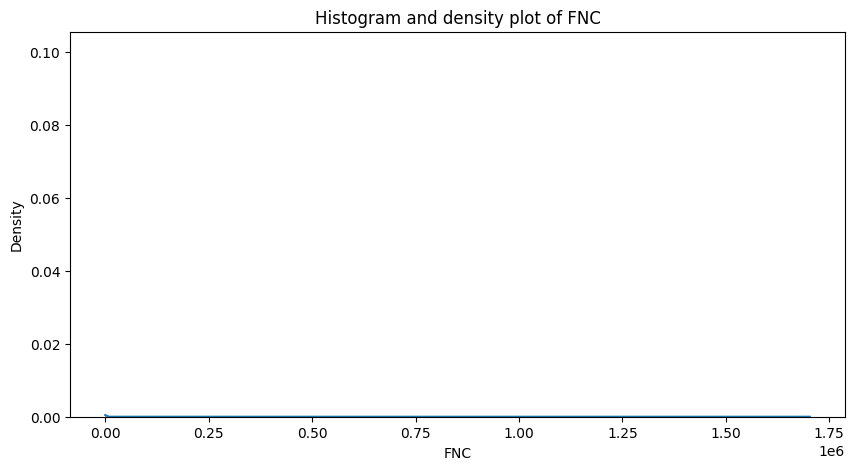

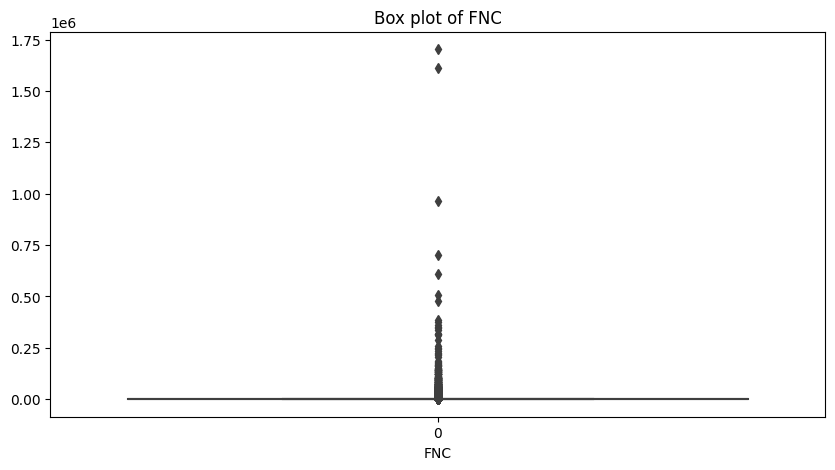

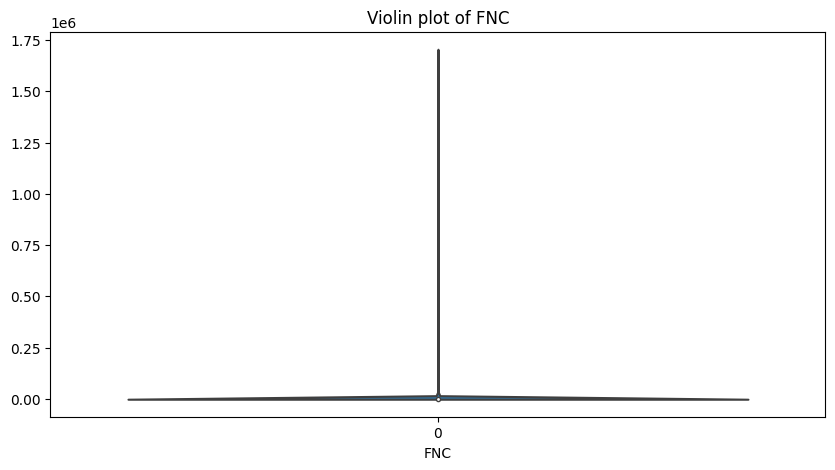

In [ ]:
# Visualizations for each variable
for col in dataset.columns:
    print(f"Variable: {col}\n")
    
    # Histogram and density plot
    plt.figure(figsize=(10, 5))
    sns.histplot(dataset[col], kde=True, stat="density")
    plt.title(f"Histogram and density plot of {col}")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.show()
    
    # Box plot
    plt.figure(figsize=(10, 5))
    sns.boxplot(dataset[col])
    plt.title(f"Box plot of {col}")
    plt.xlabel(col)
    plt.show()
    
    # Violin plot
    plt.figure(figsize=(10, 5))
    sns.violinplot(dataset[col])
    plt.title(f"Violin plot of {col}")
    plt.xlabel(col)
    plt.show()

Interaction between NotCount and YesCount


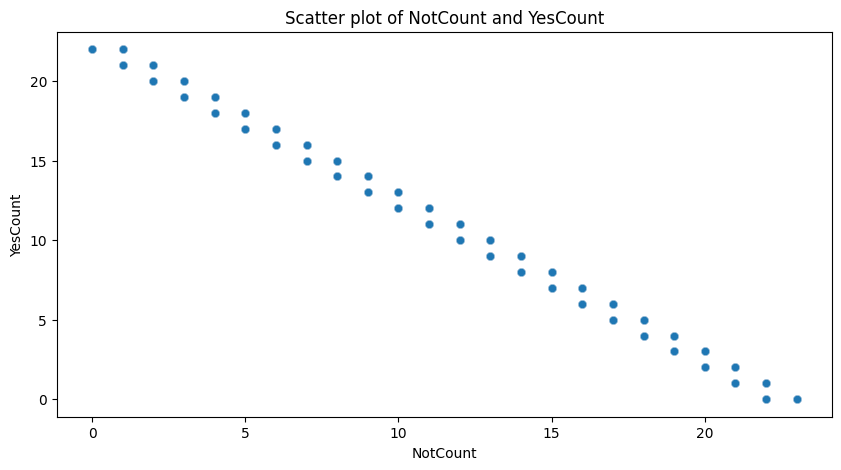

Correlation coefficients:
Spearman's correlation:	-0.998
Pearson's correlation:	-1.000
Kendall's correlation:	-0.992
Missing values:
NotCount    0
YesCount    0
dtype: int64


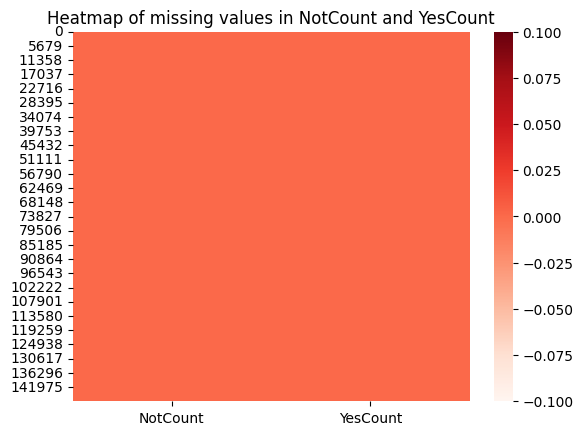

Duplicate rows:		147590

Interaction between NotCount and ATPM


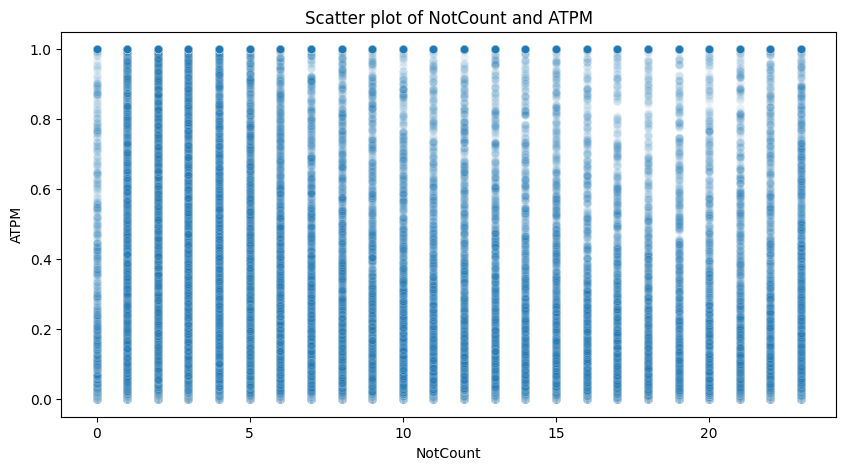

Correlation coefficients:
Spearman's correlation:	-0.268
Pearson's correlation:	-0.202
Kendall's correlation:	-0.195
Missing values:
NotCount    0
ATPM        0
dtype: int64


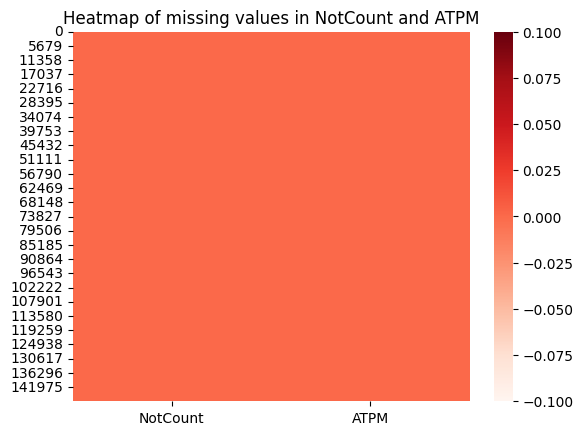

Duplicate rows:		87143

Interaction between NotCount and PFD


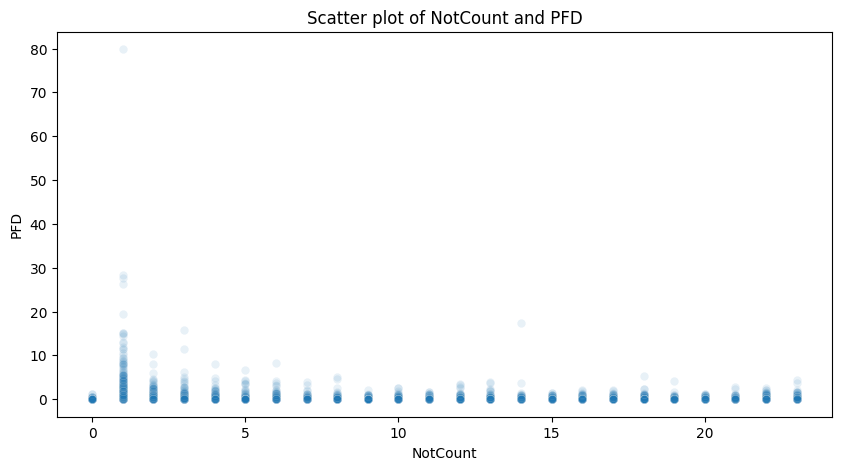

Correlation coefficients:
Spearman's correlation:	-0.078
Pearson's correlation:	-0.028
Kendall's correlation:	-0.065
Missing values:
NotCount    0
PFD         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


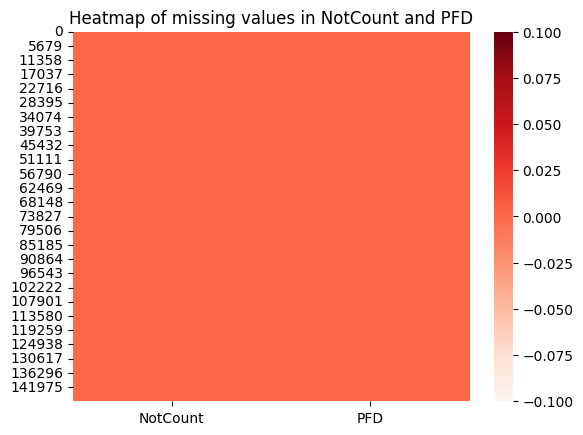

Duplicate rows:		129116

Interaction between NotCount and PFG


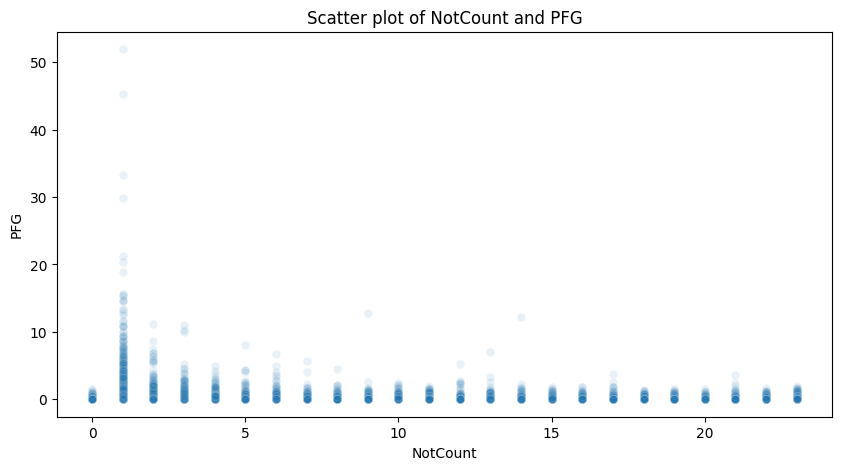

Correlation coefficients:
Spearman's correlation:	-0.169
Pearson's correlation:	-0.062
Kendall's correlation:	-0.136
Missing values:
NotCount    0
PFG         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


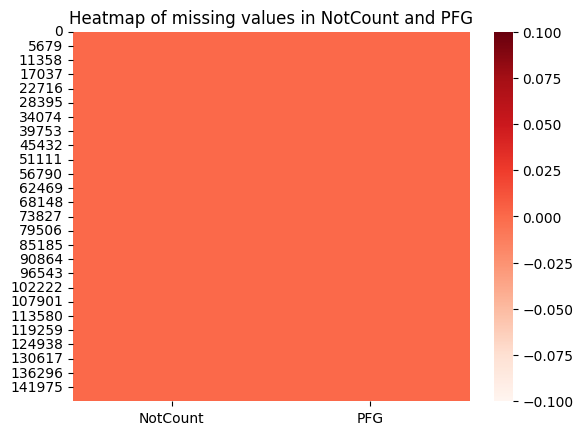

Duplicate rows:		116752

Interaction between NotCount and SFD


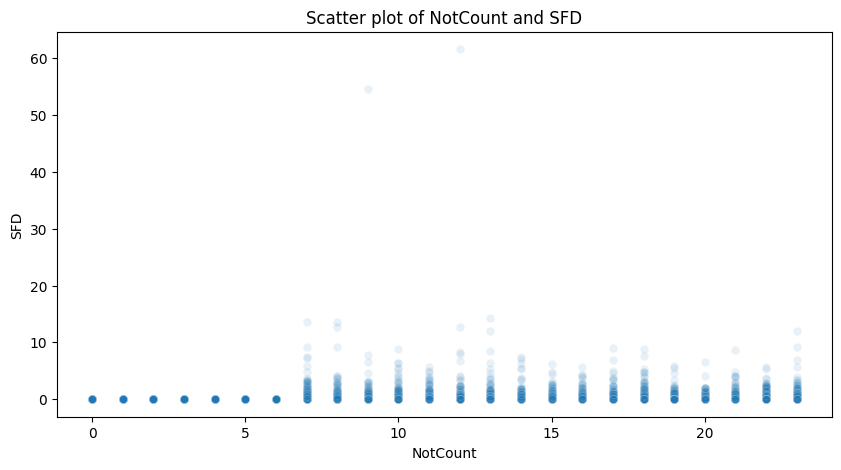

Correlation coefficients:
Spearman's correlation:	0.306
Pearson's correlation:	0.062
Kendall's correlation:	0.255
Missing values:
NotCount    0
SFD         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


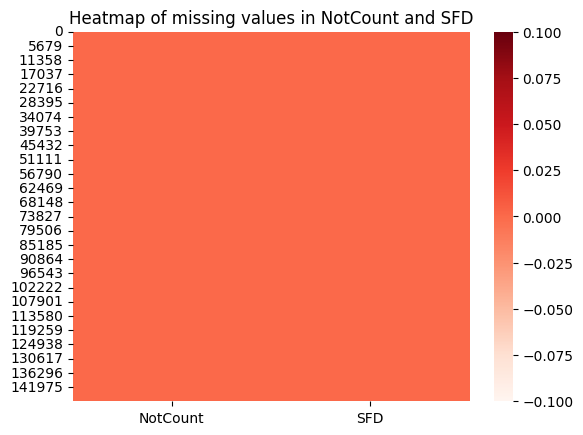

Duplicate rows:		133829

Interaction between NotCount and SFG


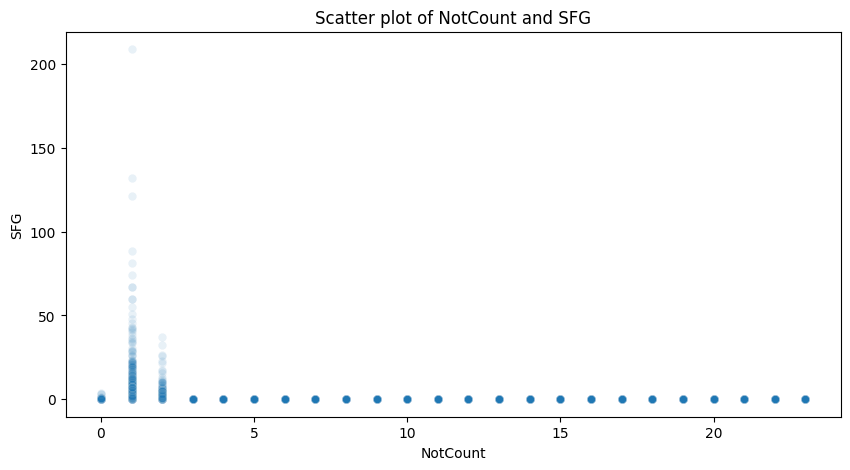

Correlation coefficients:
Spearman's correlation:	-0.472
Pearson's correlation:	-0.054
Kendall's correlation:	-0.388
Missing values:
NotCount    0
SFG         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


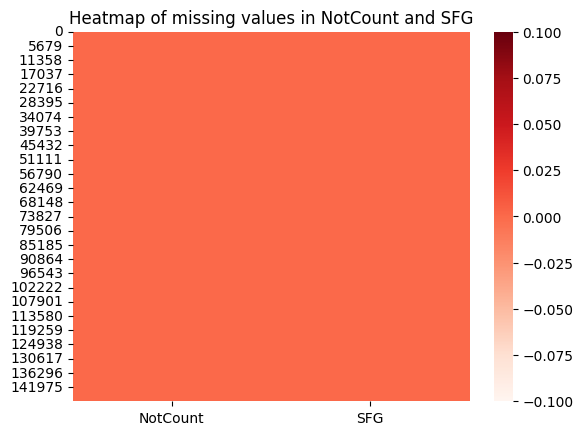

Duplicate rows:		130934

Interaction between NotCount and WP


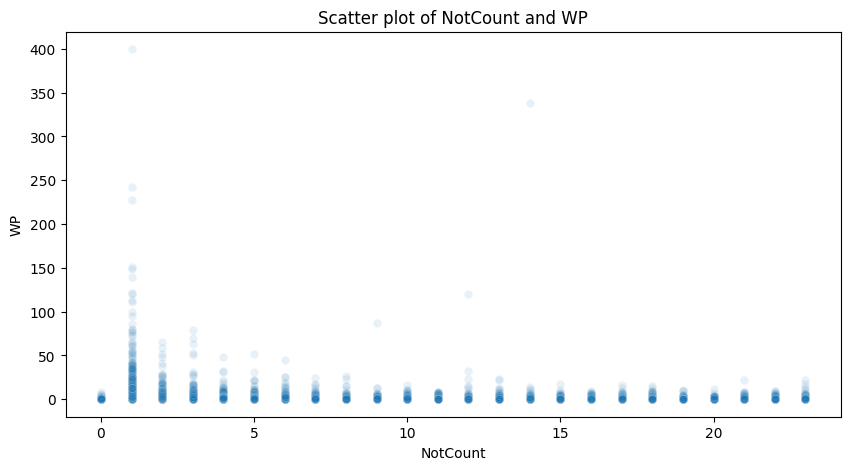

Correlation coefficients:
Spearman's correlation:	-0.165
Pearson's correlation:	-0.044
Kendall's correlation:	-0.128
Missing values:
NotCount    0
WP          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


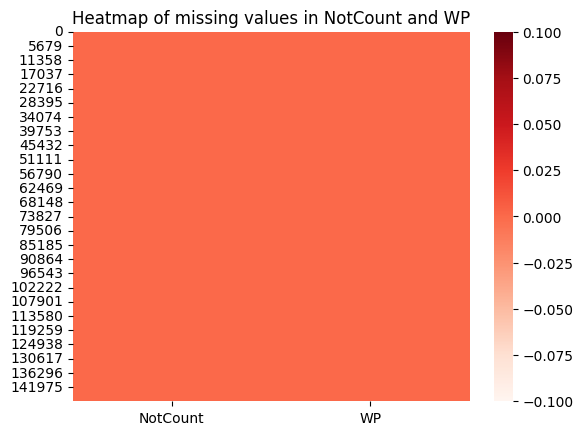

Duplicate rows:		99622

Interaction between NotCount and WS


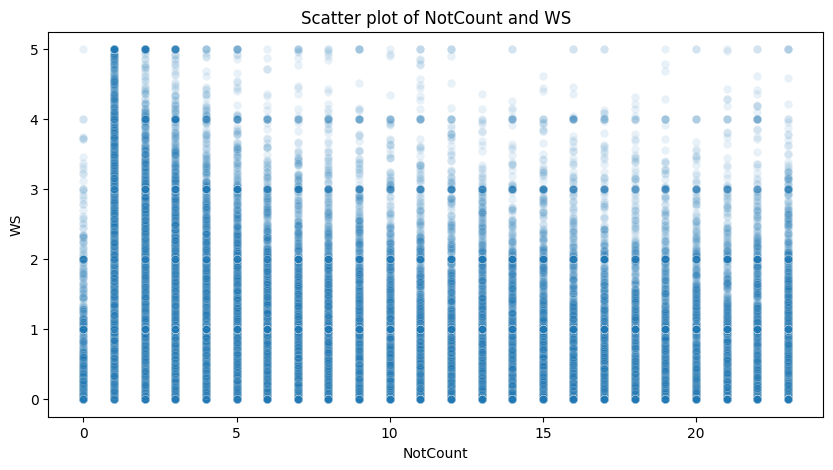

Correlation coefficients:
Spearman's correlation:	-0.260
Pearson's correlation:	-0.158
Kendall's correlation:	-0.193
Missing values:
NotCount    0
WS          0
dtype: int64


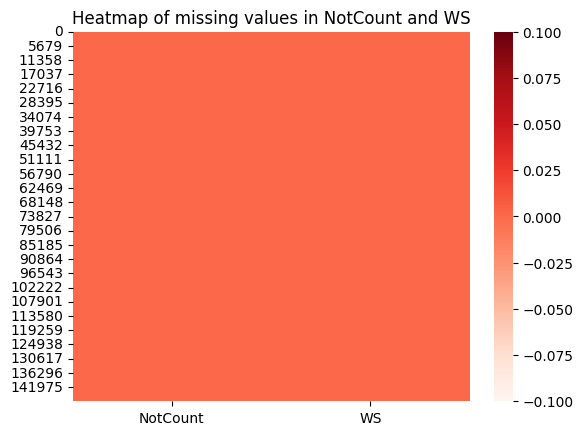

Duplicate rows:		77401

Interaction between NotCount and AH


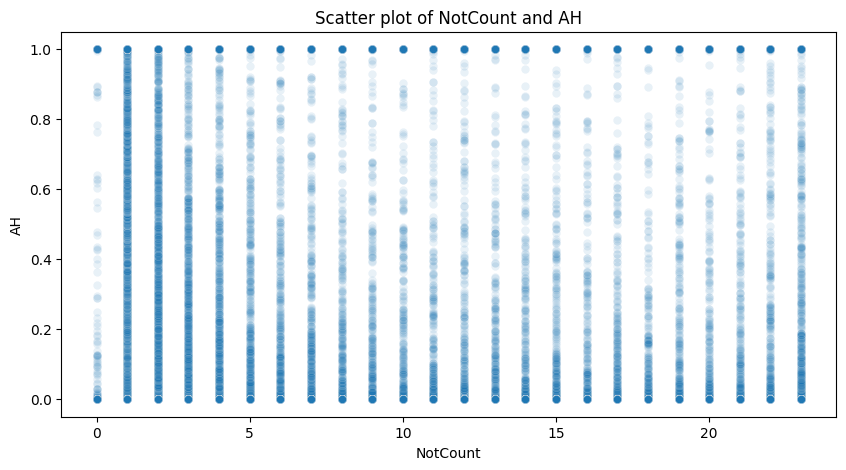

Correlation coefficients:
Spearman's correlation:	-0.032
Pearson's correlation:	-0.041
Kendall's correlation:	-0.027
Missing values:
NotCount    0
AH          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


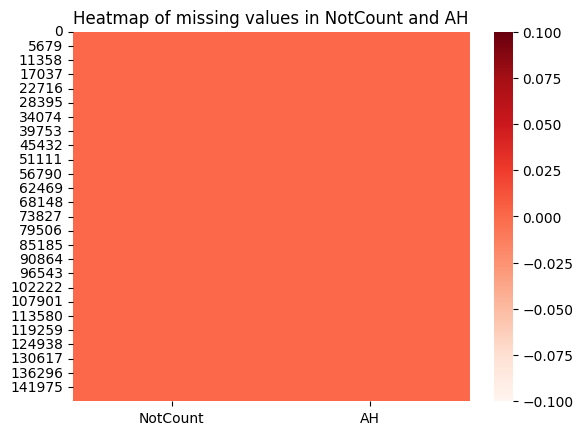

Duplicate rows:		134220

Interaction between NotCount and AN


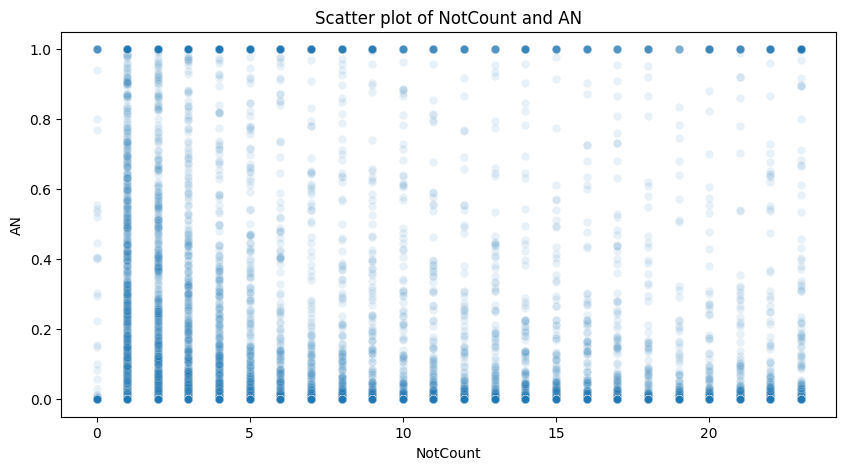

Correlation coefficients:
Spearman's correlation:	-0.013
Pearson's correlation:	-0.029
Kendall's correlation:	-0.011
Missing values:
NotCount    0
AN          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


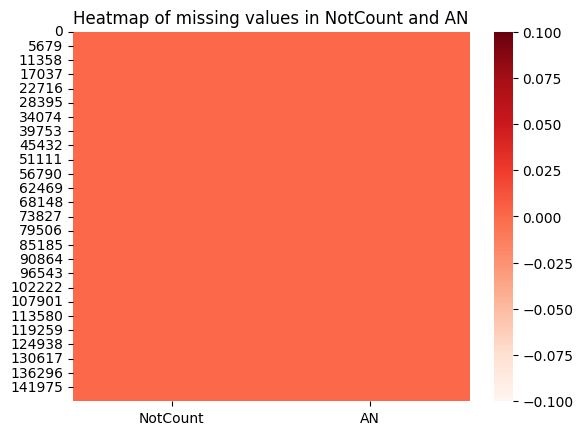

Duplicate rows:		141565

Interaction between NotCount and Status


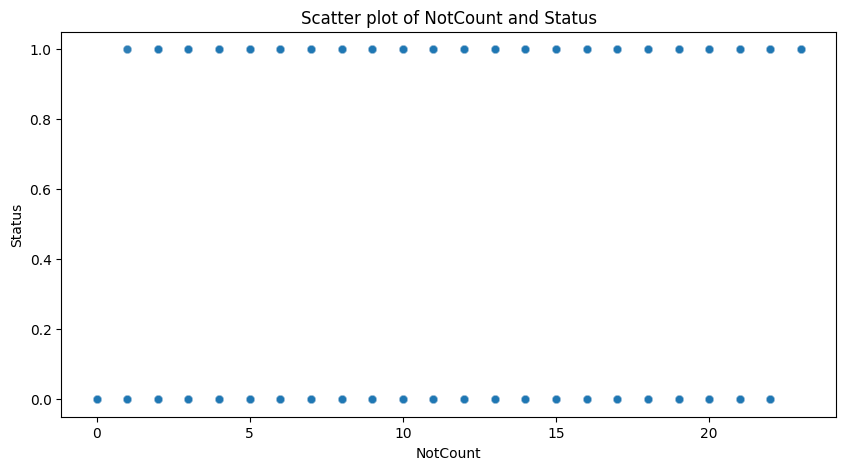

Correlation coefficients:
Spearman's correlation:	0.693
Pearson's correlation:	0.747
Kendall's correlation:	0.591
Missing values:
NotCount    0
Status      0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


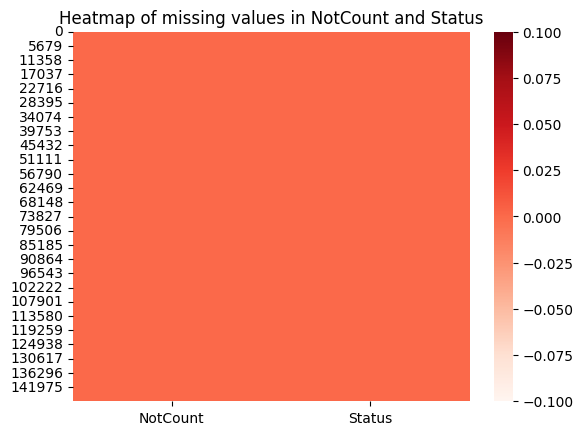

Duplicate rows:		147590

Interaction between NotCount and FNC


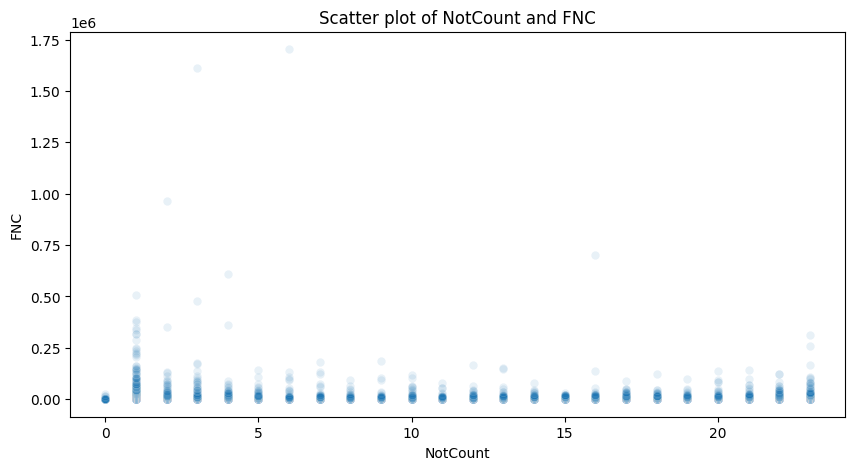

Correlation coefficients:
Spearman's correlation:	-0.077
Pearson's correlation:	0.008
Kendall's correlation:	-0.048
Missing values:
NotCount    0
FNC         0
dtype: int64


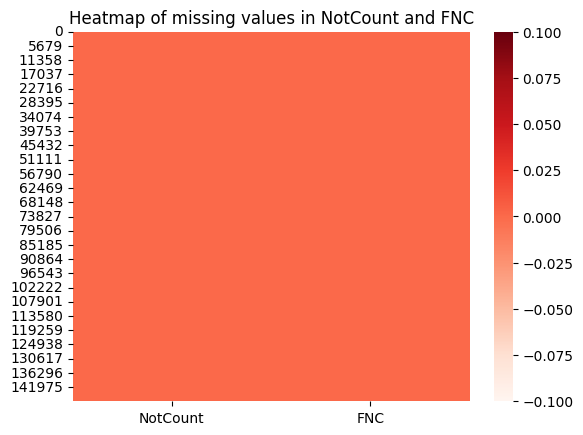

Duplicate rows:		46184

Interaction between YesCount and ATPM


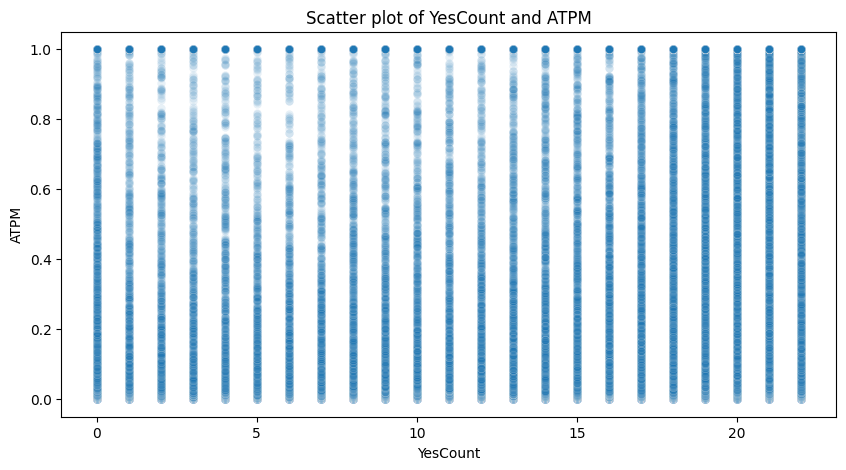

Correlation coefficients:
Spearman's correlation:	0.270
Pearson's correlation:	0.202
Kendall's correlation:	0.196
Missing values:
YesCount    0
ATPM        0
dtype: int64


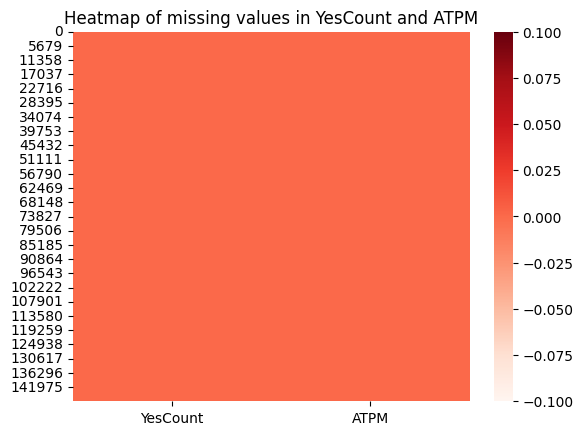

Duplicate rows:		87436

Interaction between YesCount and PFD


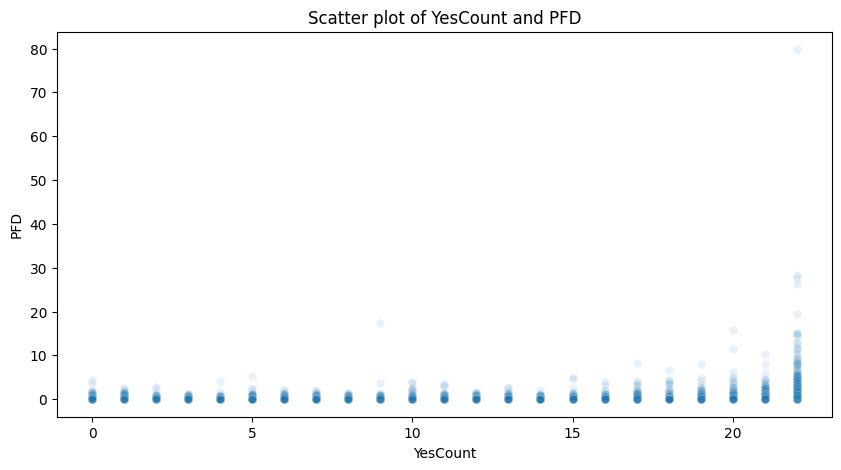

Correlation coefficients:
Spearman's correlation:	0.081
Pearson's correlation:	0.028
Kendall's correlation:	0.067
Missing values:
YesCount    0
PFD         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


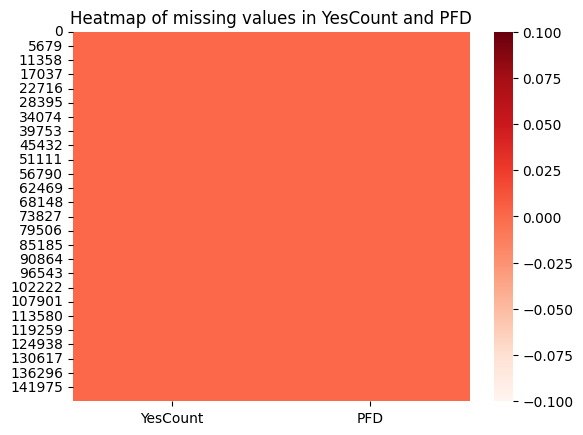

Duplicate rows:		129135

Interaction between YesCount and PFG


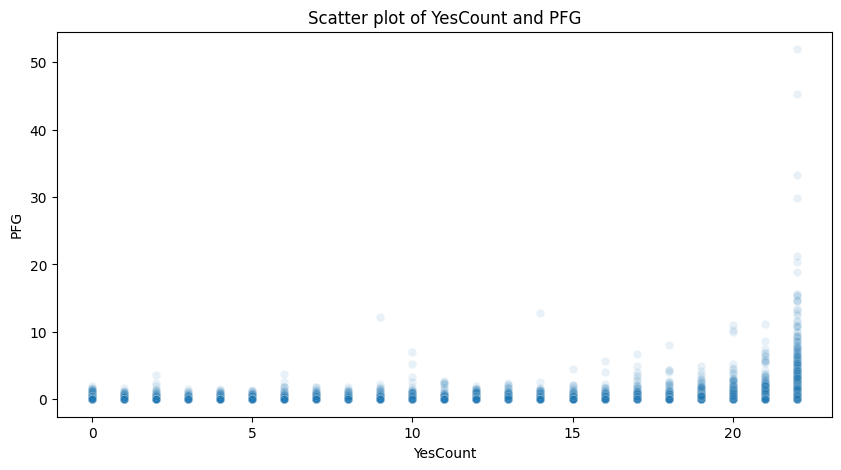

Correlation coefficients:
Spearman's correlation:	0.173
Pearson's correlation:	0.063
Kendall's correlation:	0.139
Missing values:
YesCount    0
PFG         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


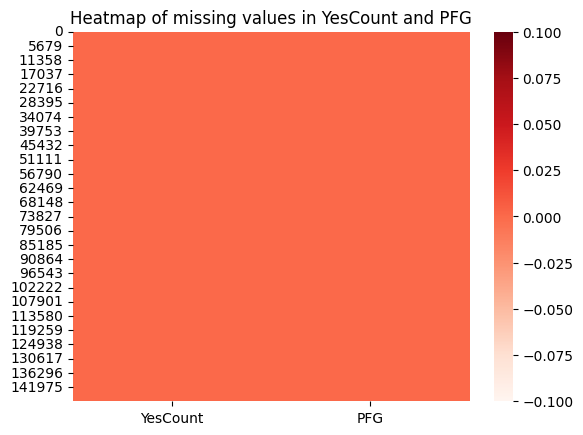

Duplicate rows:		116827

Interaction between YesCount and SFD


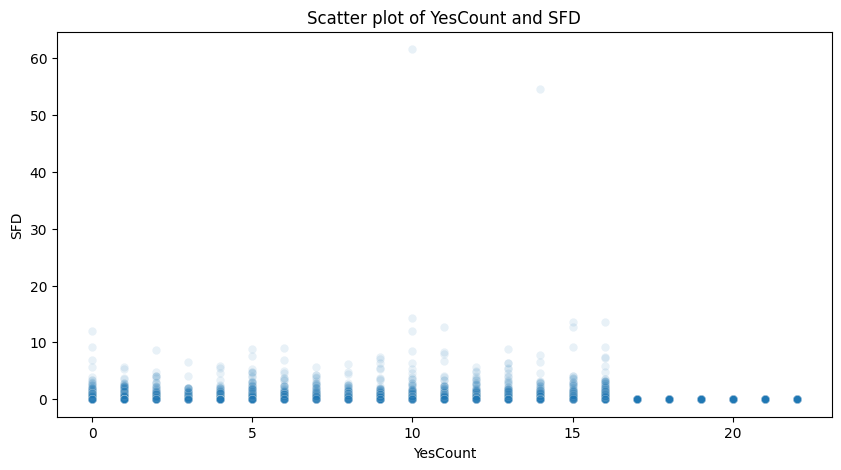

Correlation coefficients:
Spearman's correlation:	-0.305
Pearson's correlation:	-0.061
Kendall's correlation:	-0.254
Missing values:
YesCount    0
SFD         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


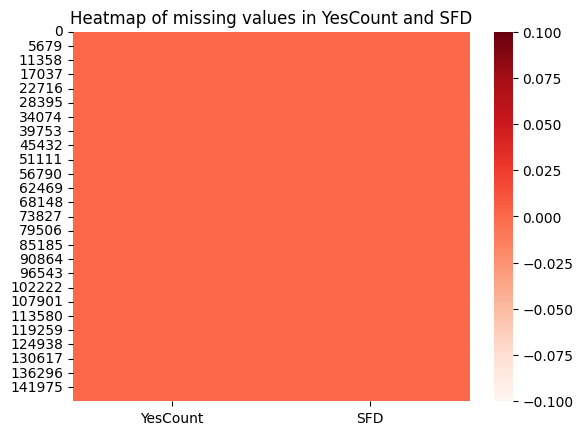

Duplicate rows:		133837

Interaction between YesCount and SFG


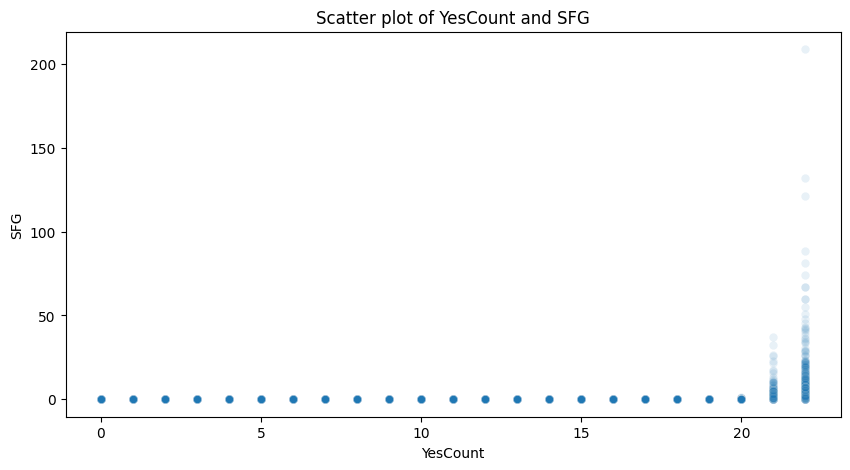

Correlation coefficients:
Spearman's correlation:	0.475
Pearson's correlation:	0.055
Kendall's correlation:	0.392
Missing values:
YesCount    0
SFG         0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


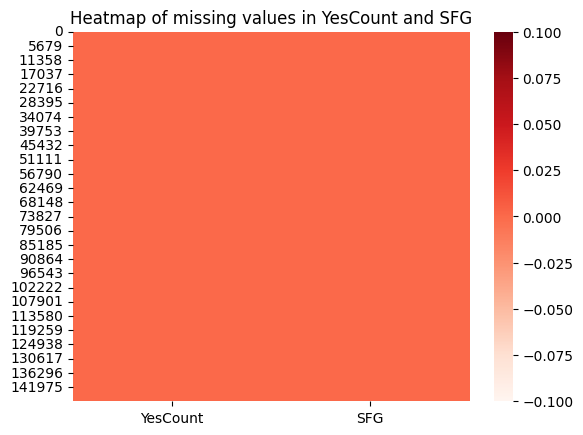

Duplicate rows:		130992

Interaction between YesCount and WP


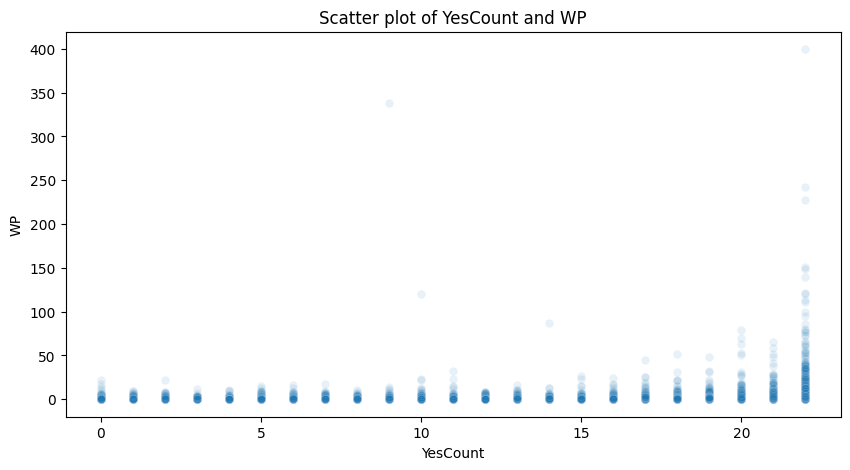

Correlation coefficients:
Spearman's correlation:	0.169
Pearson's correlation:	0.044
Kendall's correlation:	0.132
Missing values:
YesCount    0
WP          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


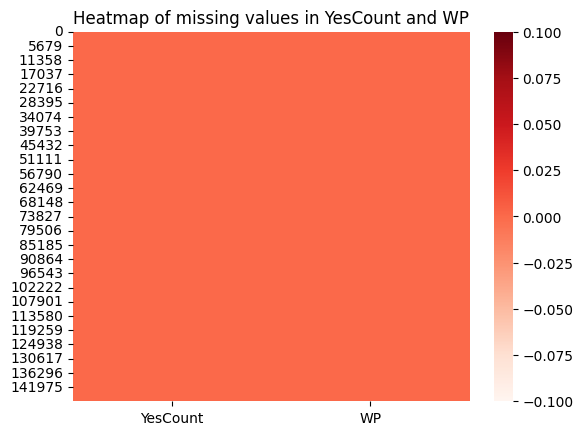

Duplicate rows:		99674

Interaction between YesCount and WS


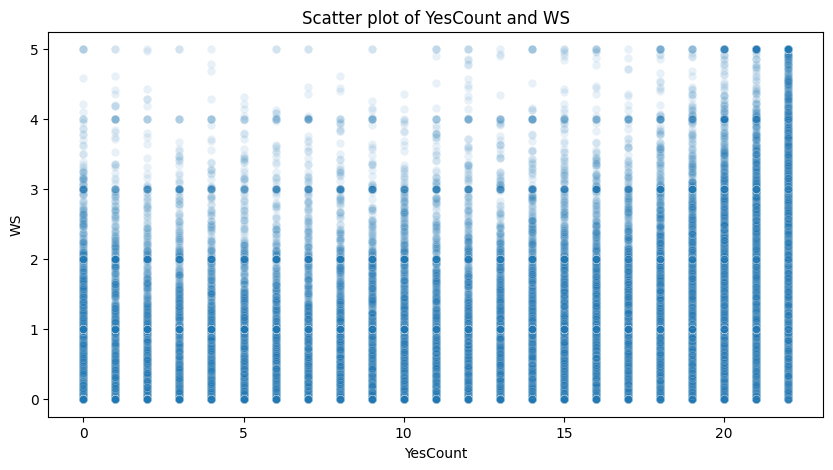

Correlation coefficients:
Spearman's correlation:	0.263
Pearson's correlation:	0.159
Kendall's correlation:	0.195
Missing values:
YesCount    0
WS          0
dtype: int64


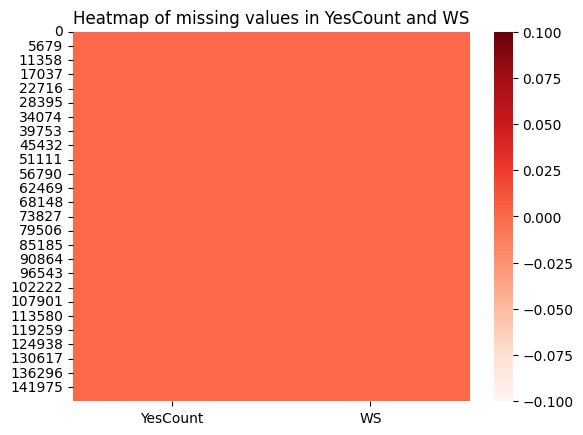

Duplicate rows:		77438

Interaction between YesCount and AH


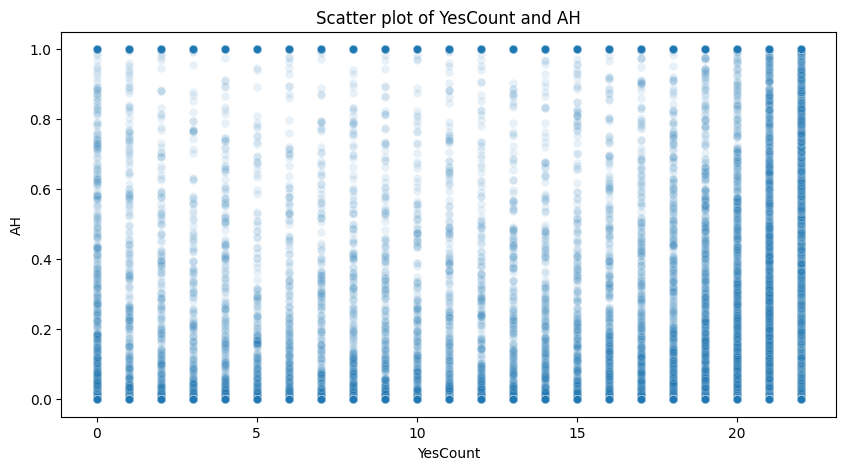

Correlation coefficients:
Spearman's correlation:	0.034
Pearson's correlation:	0.042
Kendall's correlation:	0.028
Missing values:
YesCount    0
AH          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


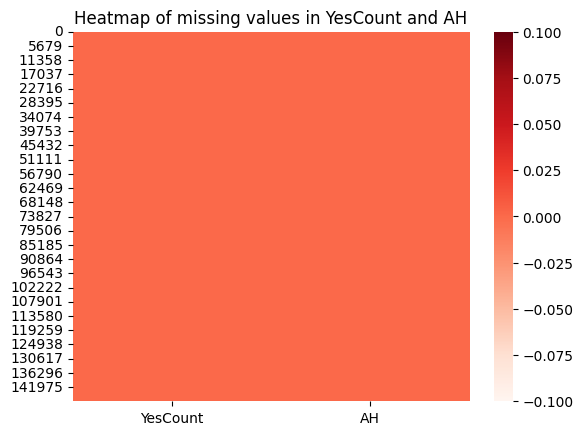

Duplicate rows:		134235

Interaction between YesCount and AN


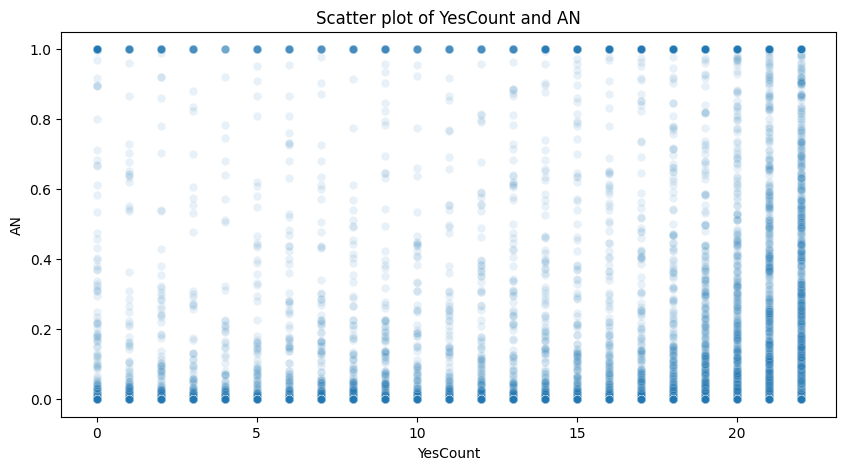

Correlation coefficients:
Spearman's correlation:	0.012
Pearson's correlation:	0.029
Kendall's correlation:	0.010
Missing values:
YesCount    0
AN          0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


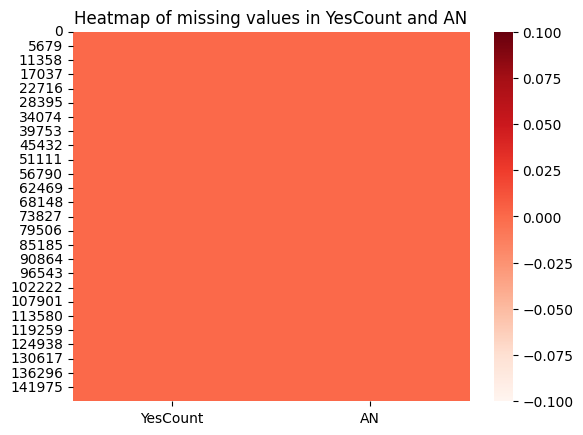

Duplicate rows:		141569

Interaction between YesCount and Status


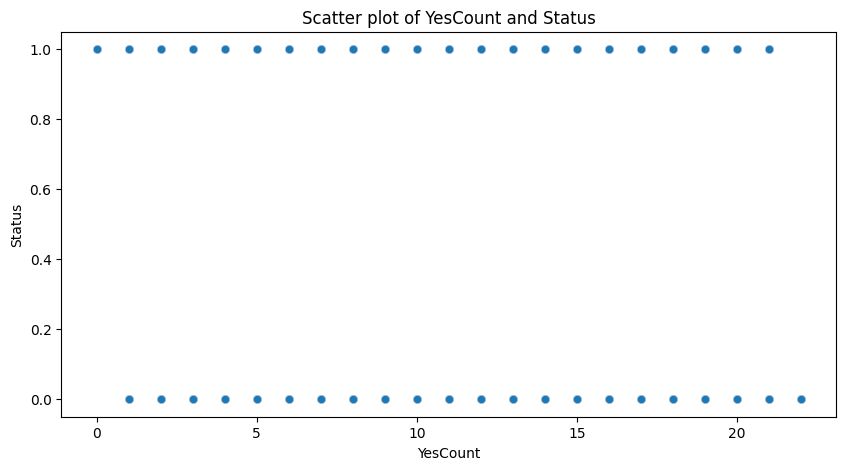

Correlation coefficients:
Spearman's correlation:	-0.694
Pearson's correlation:	-0.747
Kendall's correlation:	-0.592
Missing values:
YesCount    0
Status      0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


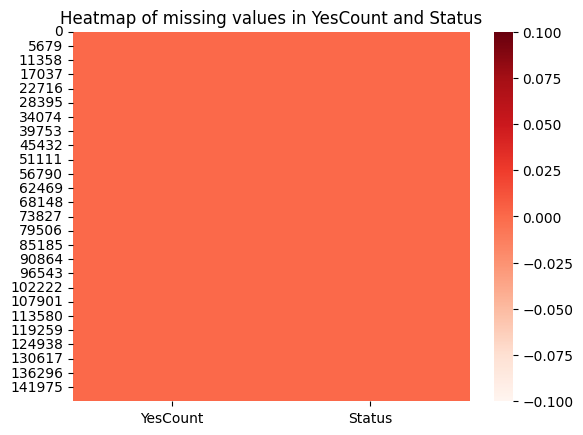

Duplicate rows:		147592

Interaction between YesCount and FNC


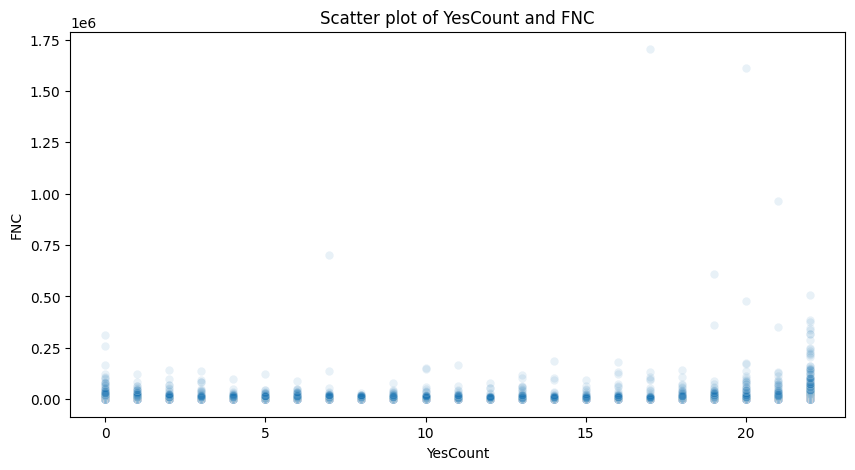

Correlation coefficients:
Spearman's correlation:	0.078
Pearson's correlation:	-0.008
Kendall's correlation:	0.049
Missing values:
YesCount    0
FNC         0
dtype: int64


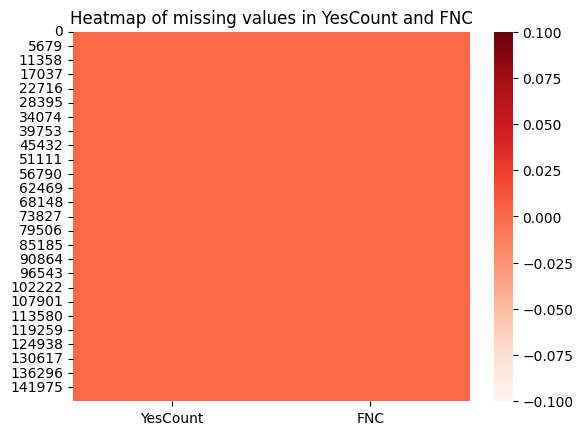

Duplicate rows:		46516

Interaction between ATPM and PFD


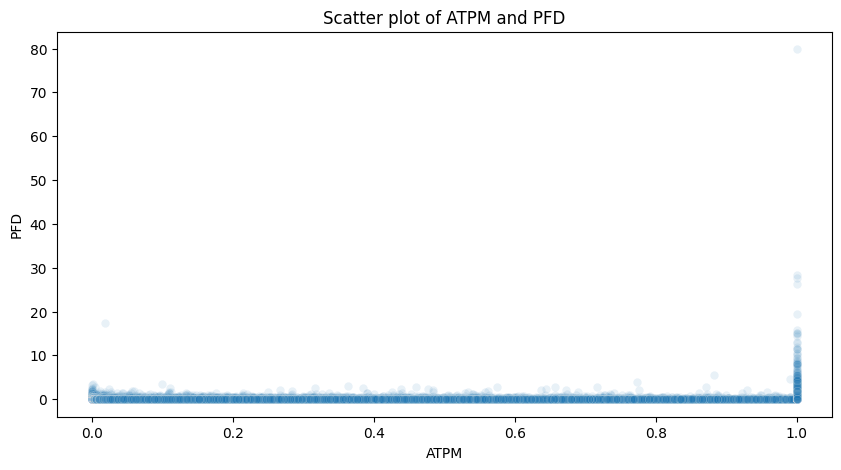

Correlation coefficients:
Spearman's correlation:	0.193
Pearson's correlation:	0.097
Kendall's correlation:	0.157
Missing values:
ATPM    0
PFD     0
dtype: int64


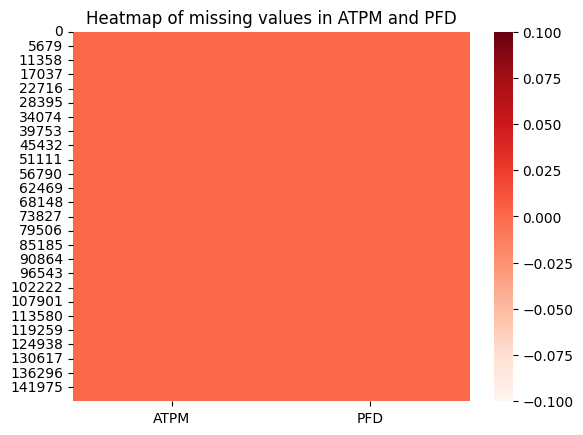

Duplicate rows:		107281

Interaction between ATPM and PFG


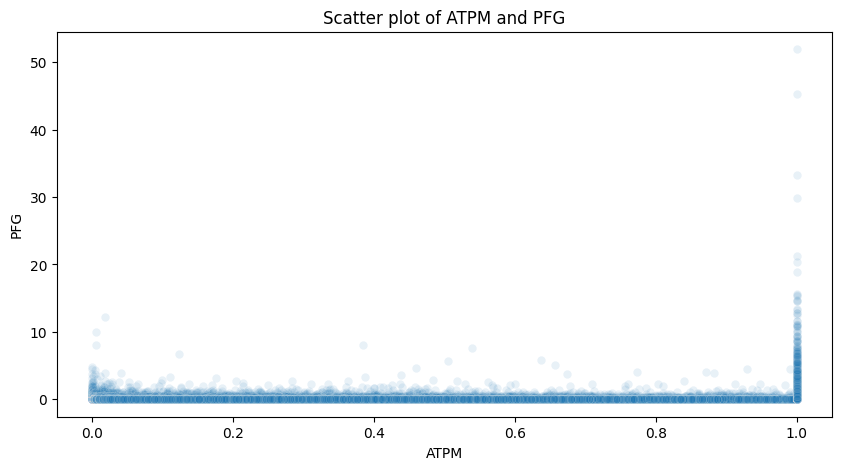

Correlation coefficients:
Spearman's correlation:	0.231
Pearson's correlation:	0.136
Kendall's correlation:	0.183
Missing values:
ATPM    0
PFG     0
dtype: int64


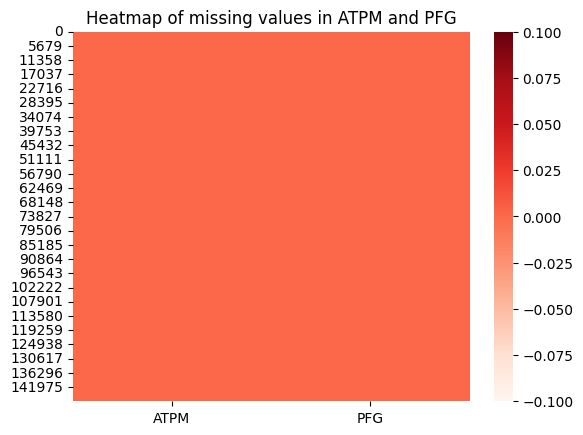

Duplicate rows:		94017

Interaction between ATPM and SFD


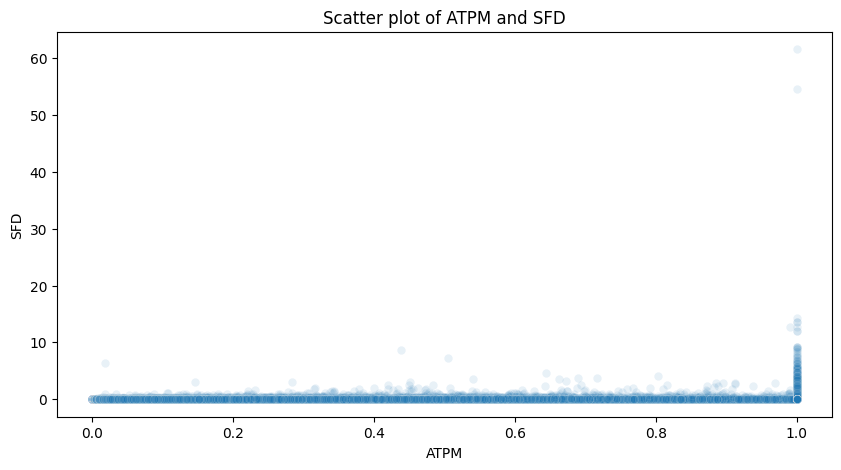

Correlation coefficients:
Spearman's correlation:	0.145
Pearson's correlation:	0.108
Kendall's correlation:	0.123
Missing values:
ATPM    0
SFD     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


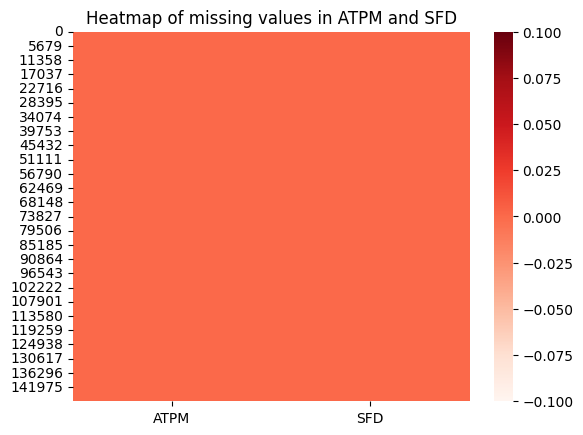

Duplicate rows:		112698

Interaction between ATPM and SFG


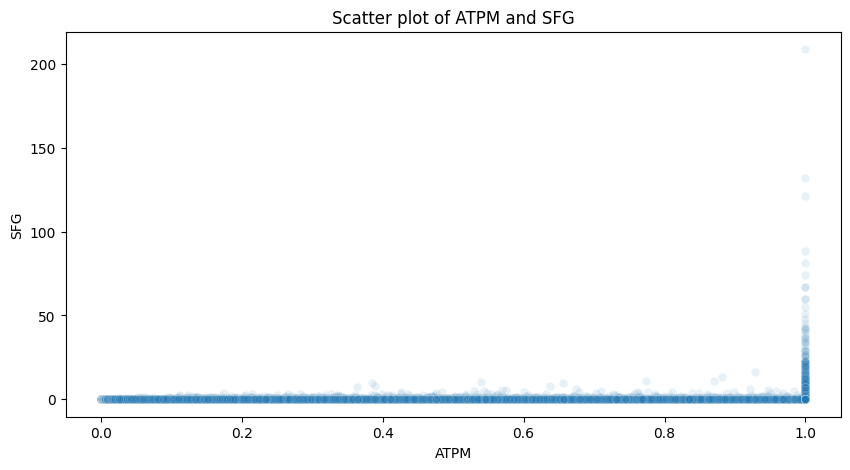

Correlation coefficients:
Spearman's correlation:	0.273
Pearson's correlation:	0.110
Kendall's correlation:	0.224
Missing values:
ATPM    0
SFG     0
dtype: int64


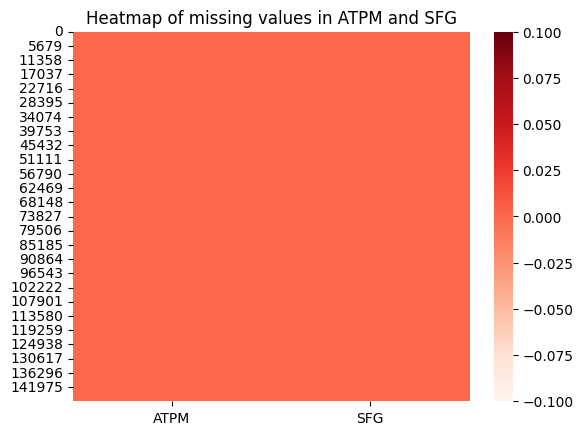

Duplicate rows:		106847

Interaction between ATPM and WP


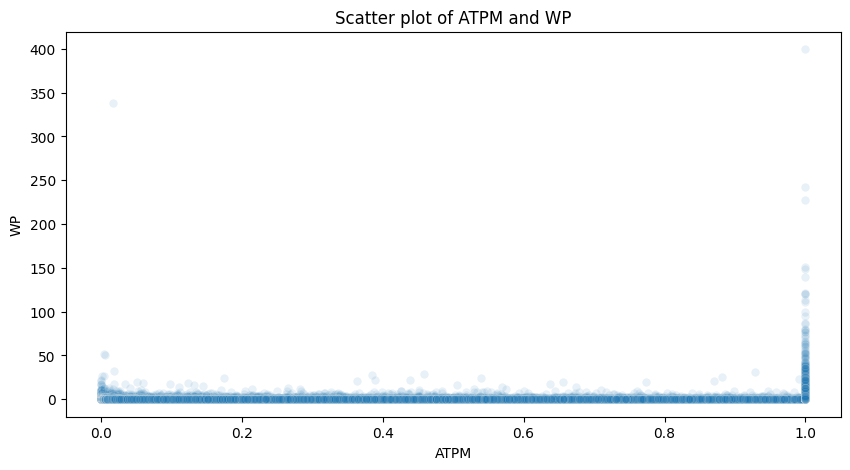

Correlation coefficients:
Spearman's correlation:	0.258
Pearson's correlation:	0.112
Kendall's correlation:	0.199
Missing values:
ATPM    0
WP      0
dtype: int64


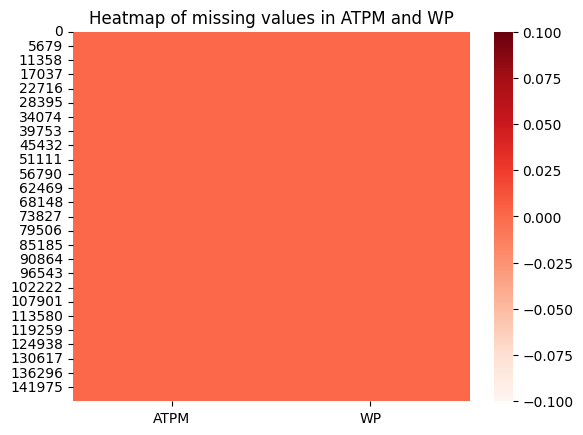

Duplicate rows:		78968

Interaction between ATPM and WS


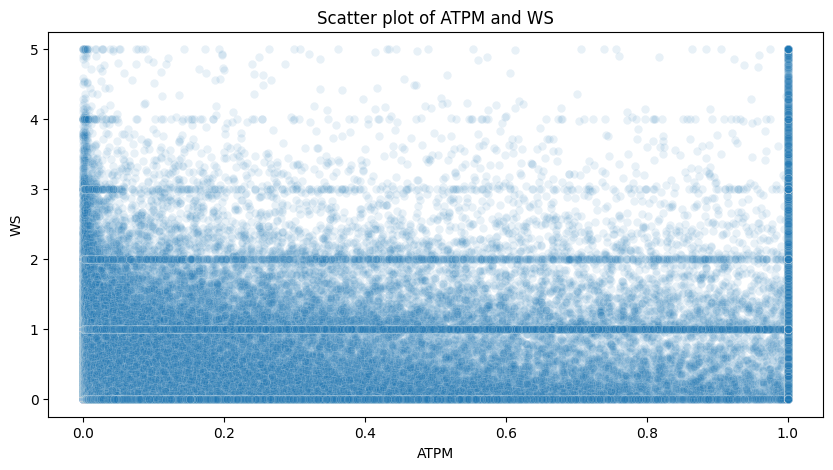

Correlation coefficients:
Spearman's correlation:	0.586
Pearson's correlation:	0.441
Kendall's correlation:	0.442
Missing values:
ATPM    0
WS      0
dtype: int64


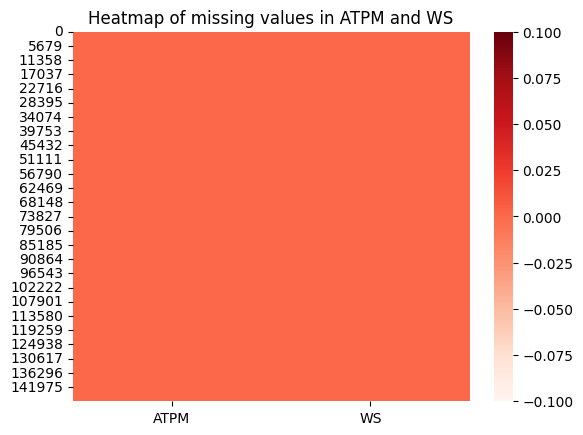

Duplicate rows:		61534

Interaction between ATPM and AH


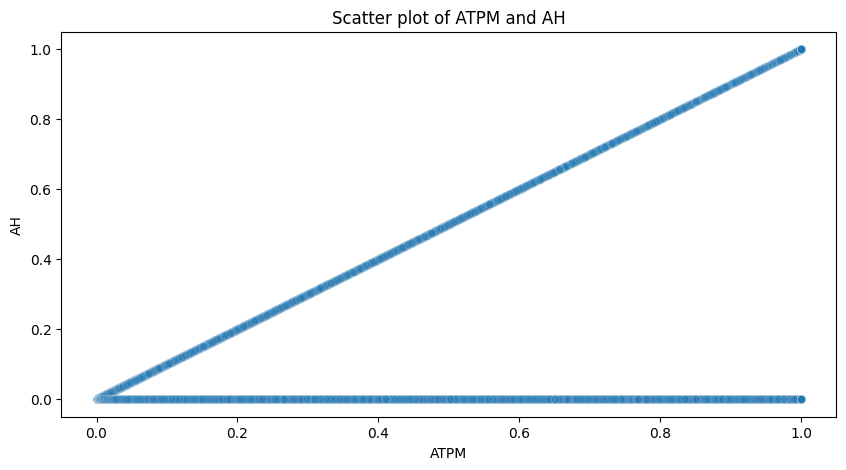

Correlation coefficients:
Spearman's correlation:	0.178
Pearson's correlation:	0.357
Kendall's correlation:	0.159
Missing values:
ATPM    0
AH      0
dtype: int64


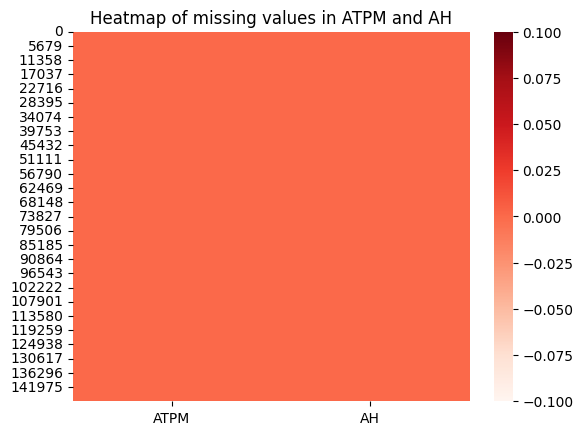

Duplicate rows:		118928

Interaction between ATPM and AN


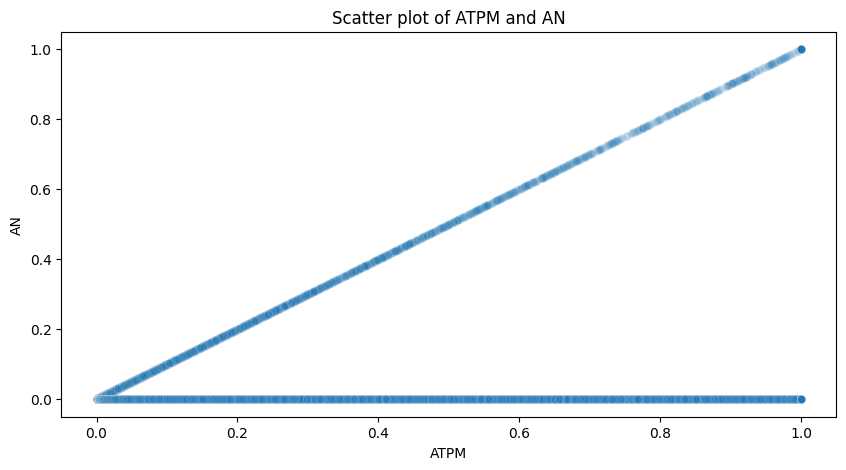

Correlation coefficients:
Spearman's correlation:	0.023
Pearson's correlation:	0.188
Kendall's correlation:	0.024
Missing values:
ATPM    0
AN      0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


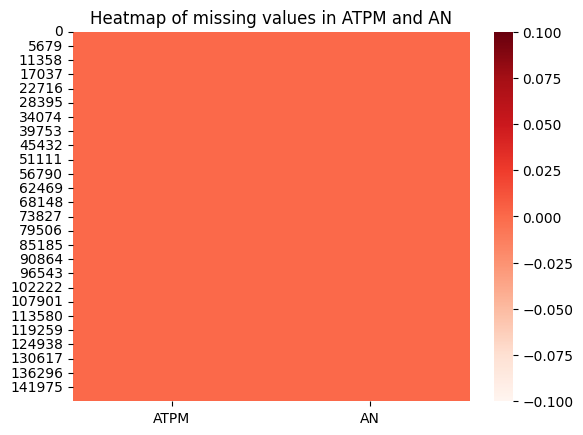

Duplicate rows:		122381

Interaction between ATPM and Status


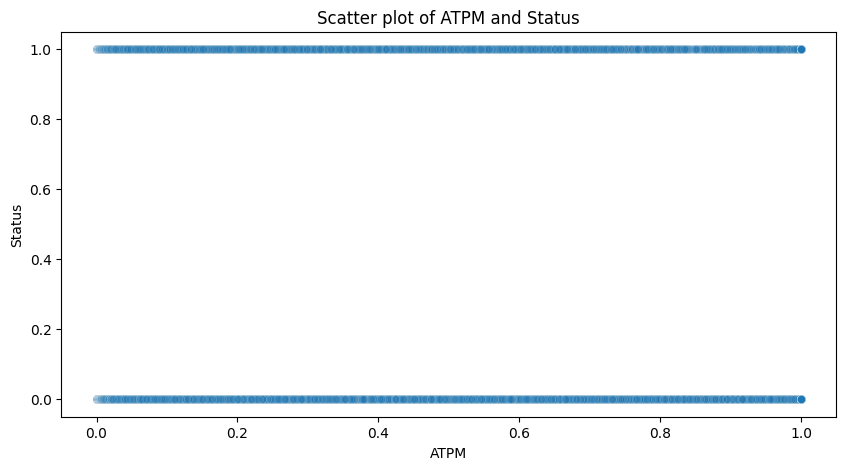

Correlation coefficients:
Spearman's correlation:	-0.257
Pearson's correlation:	-0.172
Kendall's correlation:	-0.214
Missing values:
ATPM      0
Status    0
dtype: int64


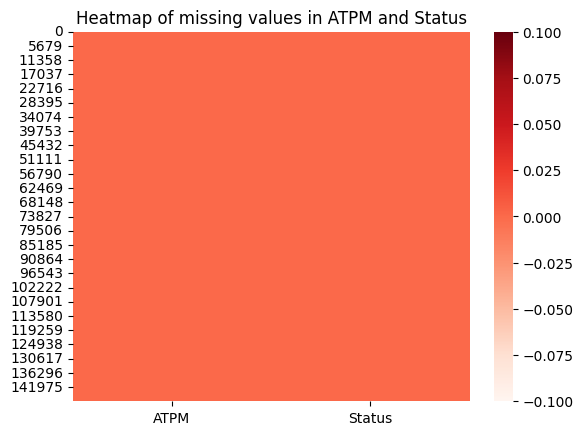

Duplicate rows:		118130

Interaction between ATPM and FNC


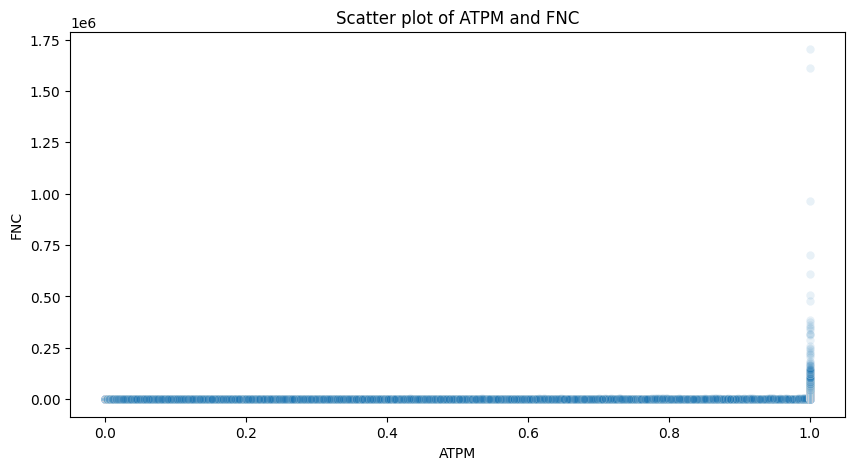

Correlation coefficients:
Spearman's correlation:	0.947
Pearson's correlation:	0.114
Kendall's correlation:	0.822
Missing values:
ATPM    0
FNC     0
dtype: int64


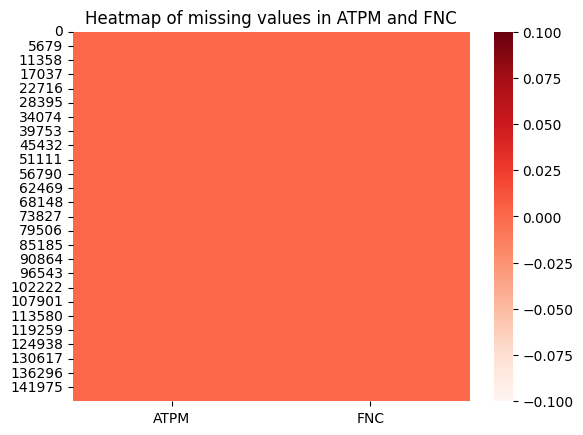

Duplicate rows:		52574

Interaction between PFD and PFG


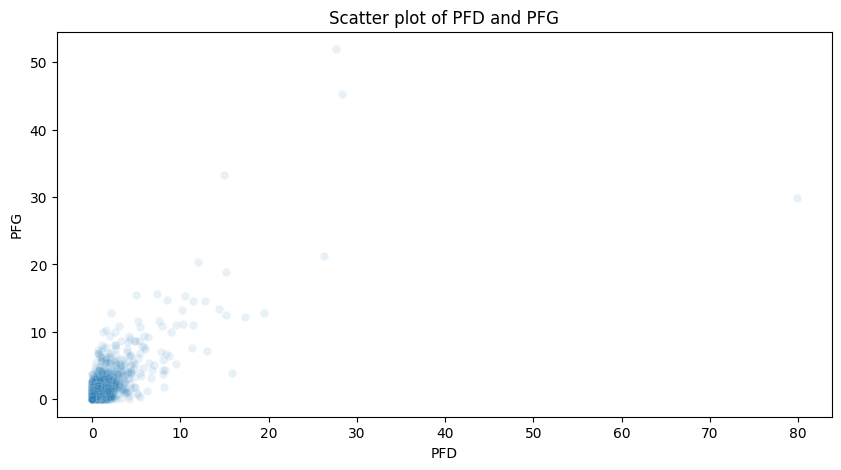

Correlation coefficients:
Spearman's correlation:	0.333
Pearson's correlation:	0.736
Kendall's correlation:	0.305
Missing values:
PFD    0
PFG    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


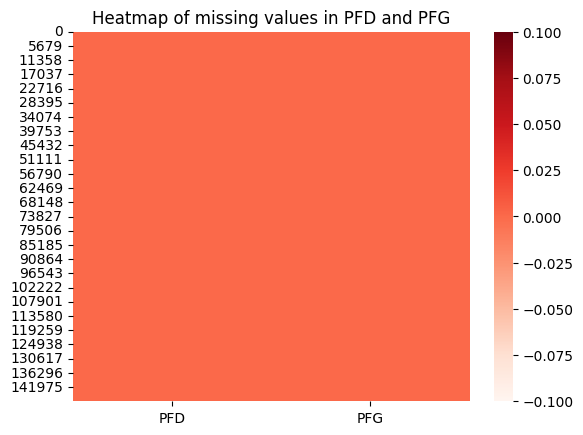

Duplicate rows:		116726

Interaction between PFD and SFD


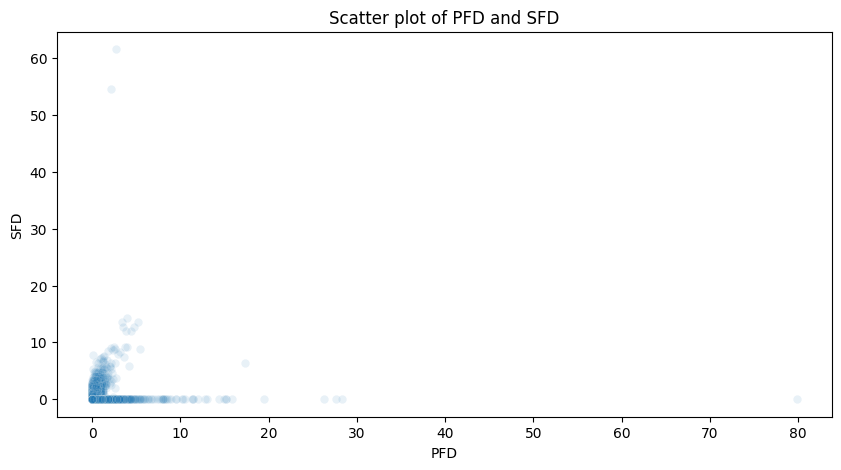

Correlation coefficients:
Spearman's correlation:	0.272
Pearson's correlation:	0.132
Kendall's correlation:	0.258
Missing values:
PFD    0
SFD    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


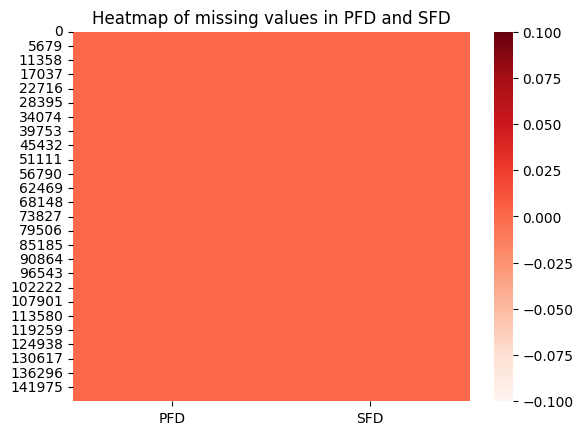

Duplicate rows:		126626

Interaction between PFD and SFG


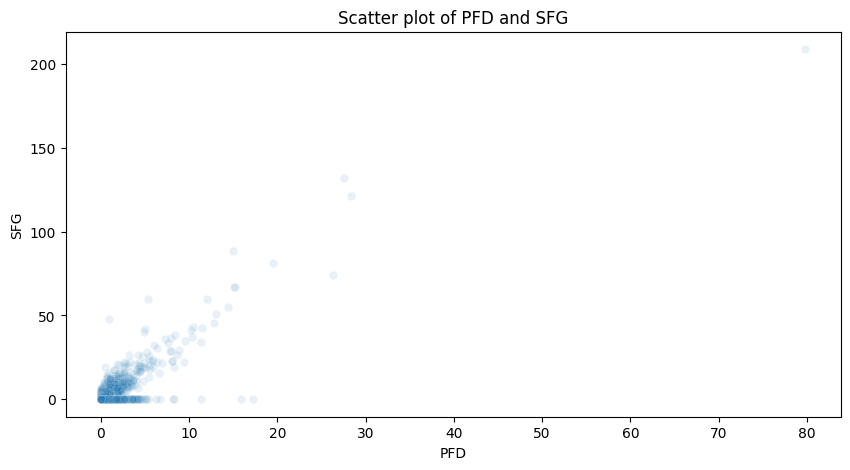

Correlation coefficients:
Spearman's correlation:	0.319
Pearson's correlation:	0.857
Kendall's correlation:	0.300
Missing values:
PFD    0
SFG    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


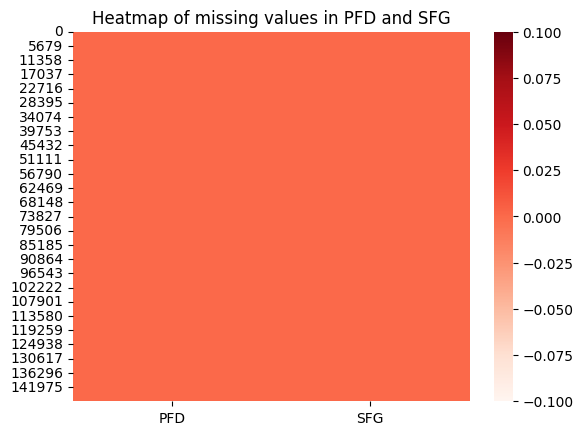

Duplicate rows:		122251

Interaction between PFD and WP


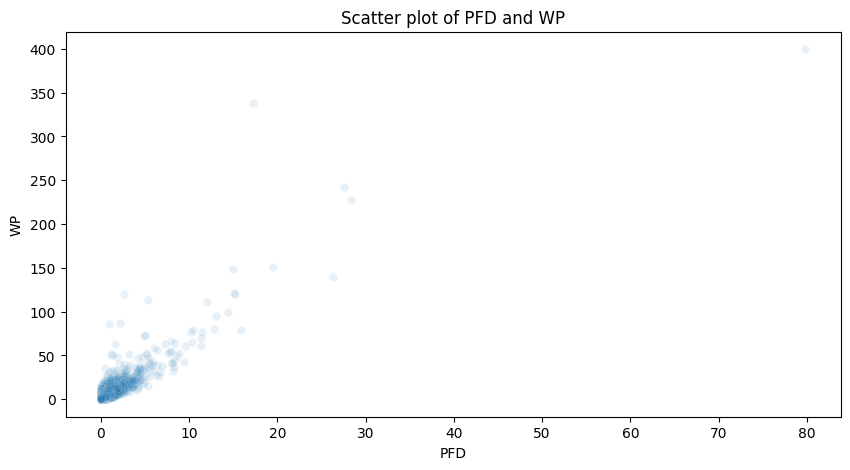

Correlation coefficients:
Spearman's correlation:	0.586
Pearson's correlation:	0.886
Kendall's correlation:	0.531
Missing values:
PFD    0
WP     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


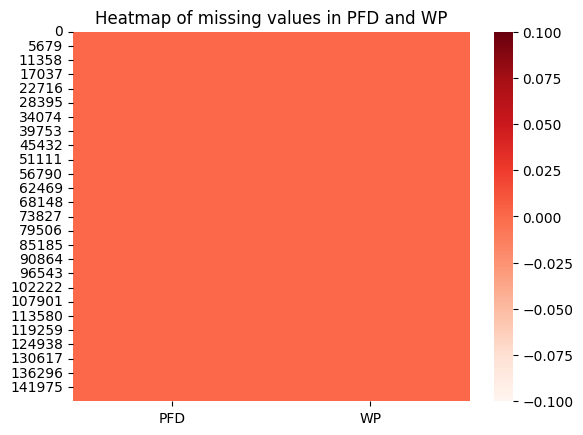

Duplicate rows:		102150

Interaction between PFD and WS


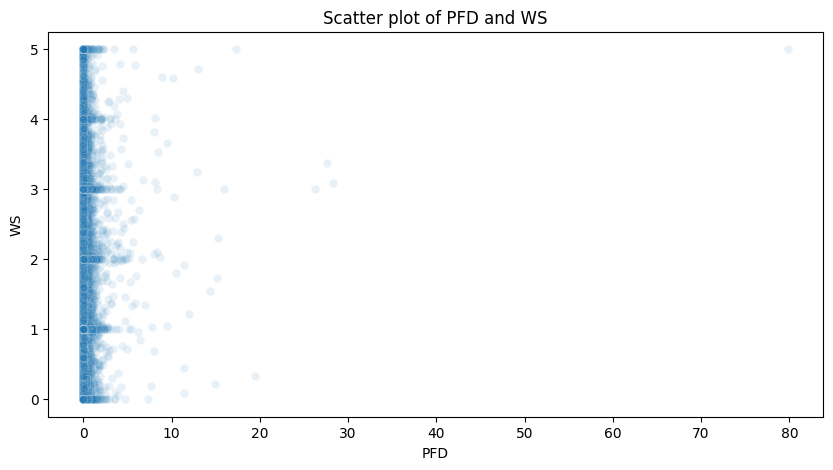

Correlation coefficients:
Spearman's correlation:	0.184
Pearson's correlation:	0.120
Kendall's correlation:	0.155
Missing values:
PFD    0
WS     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


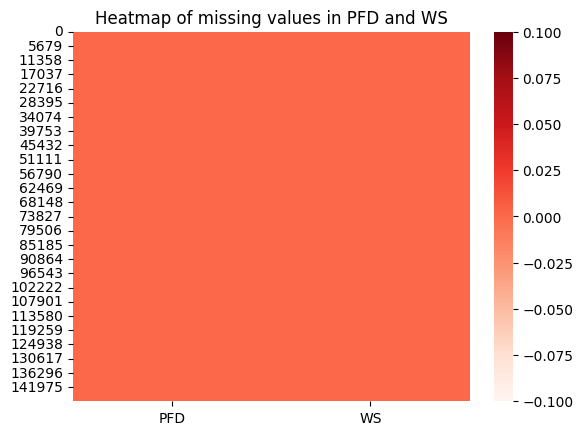

Duplicate rows:		74523

Interaction between PFD and AH


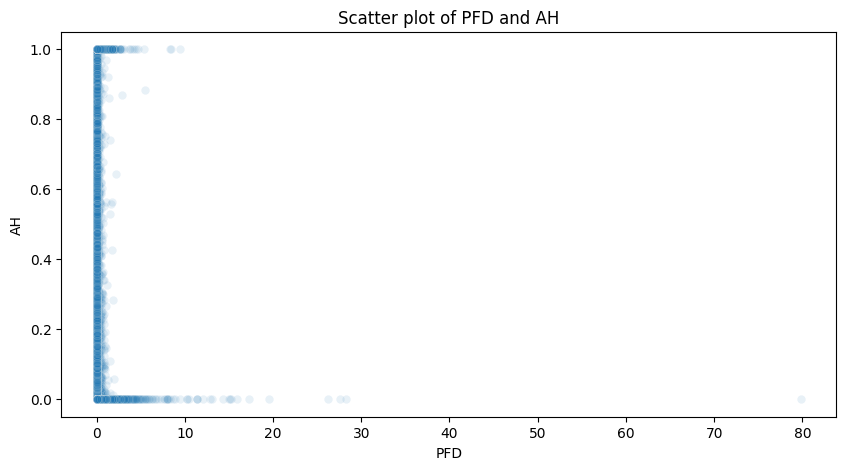

Correlation coefficients:
Spearman's correlation:	0.069
Pearson's correlation:	0.032
Kendall's correlation:	0.064
Missing values:
PFD    0
AH     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


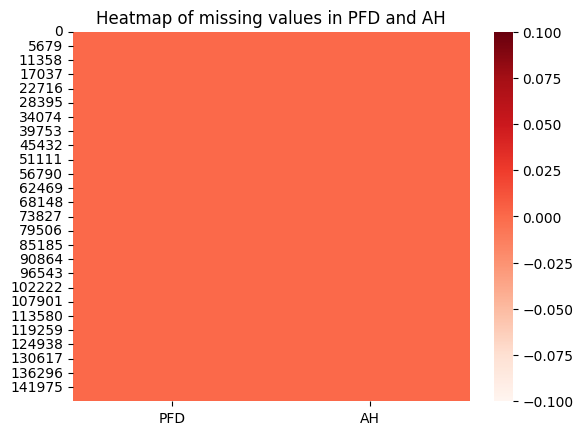

Duplicate rows:		126481

Interaction between PFD and AN


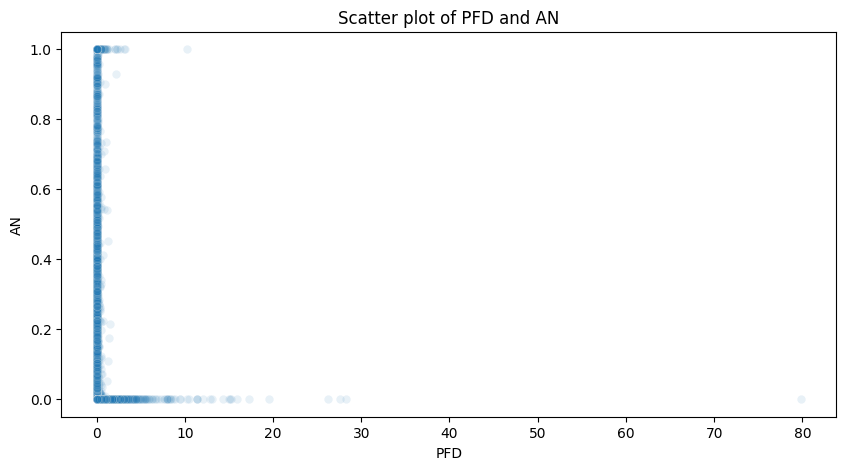

Correlation coefficients:
Spearman's correlation:	-0.010
Pearson's correlation:	0.009
Kendall's correlation:	-0.009
Missing values:
PFD    0
AN     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


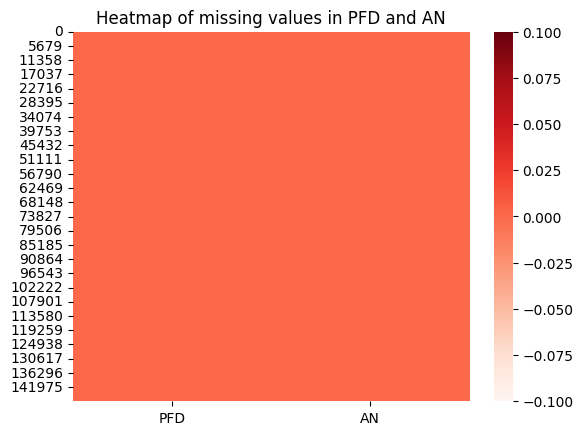

Duplicate rows:		131773

Interaction between PFD and Status


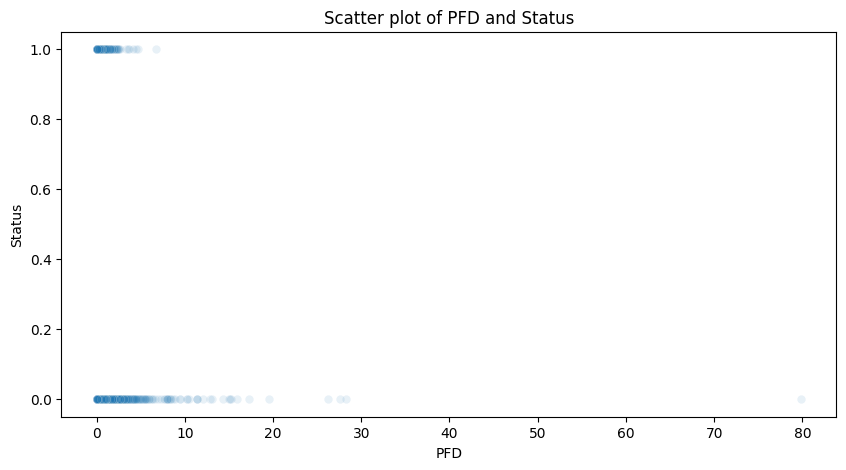

Correlation coefficients:
Spearman's correlation:	-0.068
Pearson's correlation:	-0.025
Kendall's correlation:	-0.066
Missing values:
PFD       0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


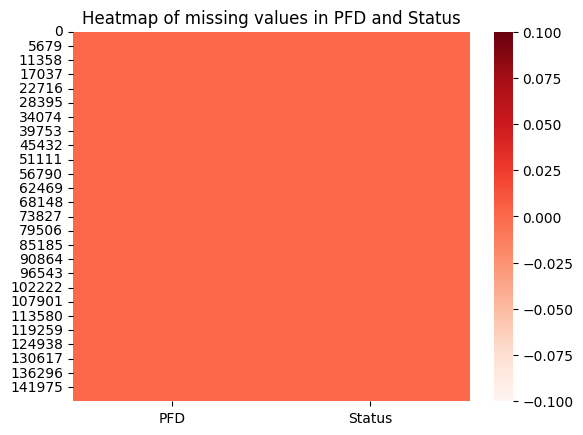

Duplicate rows:		133850

Interaction between PFD and FNC


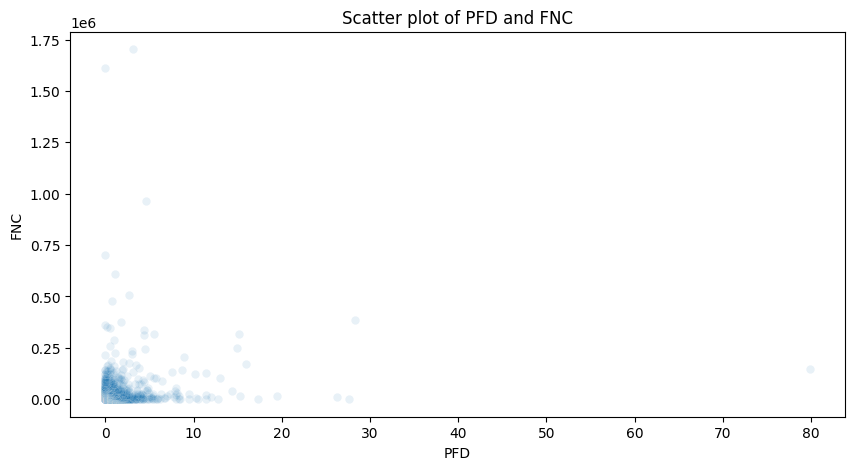

Correlation coefficients:
Spearman's correlation:	0.186
Pearson's correlation:	0.209
Kendall's correlation:	0.149
Missing values:
PFD    0
FNC    0
dtype: int64


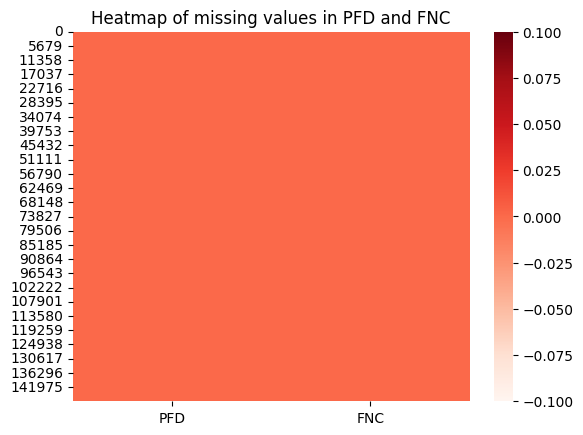

Duplicate rows:		64539

Interaction between PFG and SFD


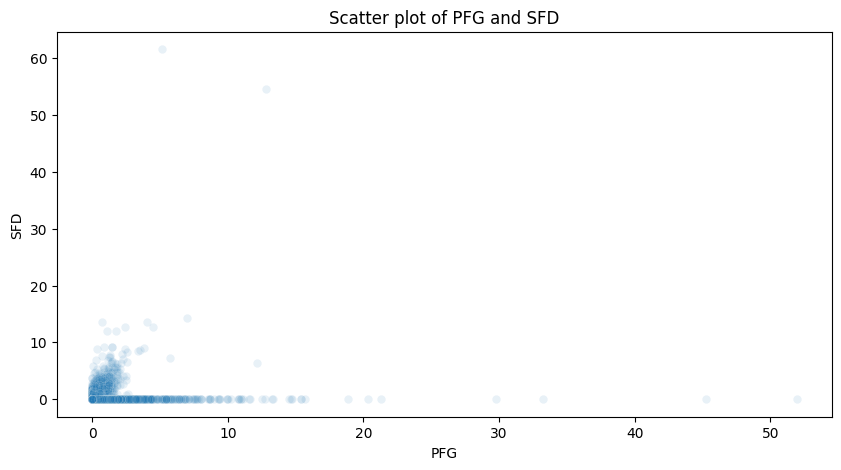

Correlation coefficients:
Spearman's correlation:	0.285
Pearson's correlation:	0.159
Kendall's correlation:	0.264
Missing values:
PFG    0
SFD    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


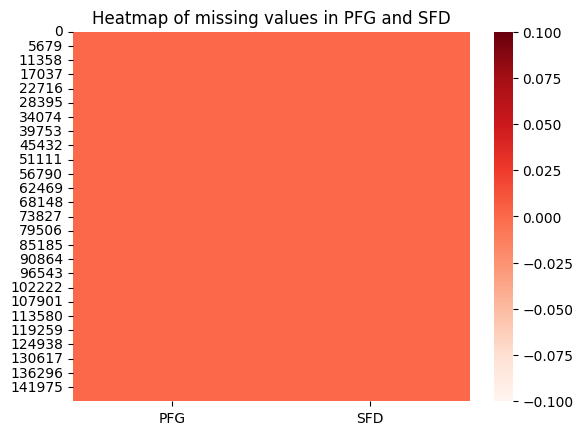

Duplicate rows:		118779

Interaction between PFG and SFG


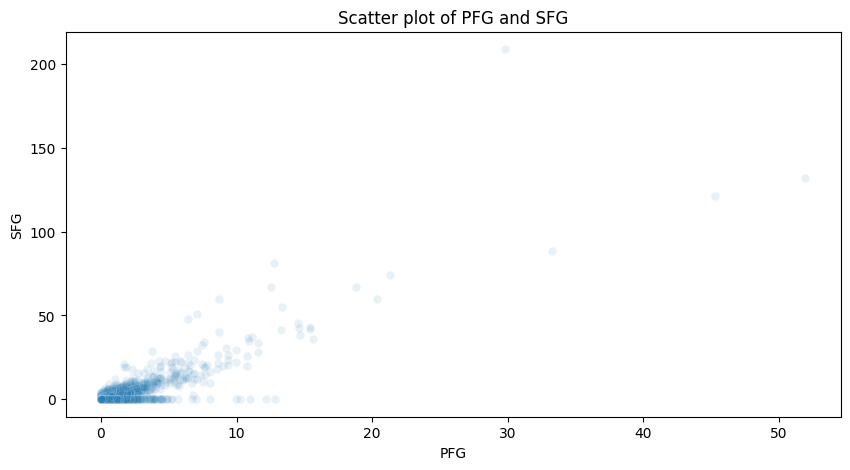

Correlation coefficients:
Spearman's correlation:	0.501
Pearson's correlation:	0.835
Kendall's correlation:	0.464
Missing values:
PFG    0
SFG    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


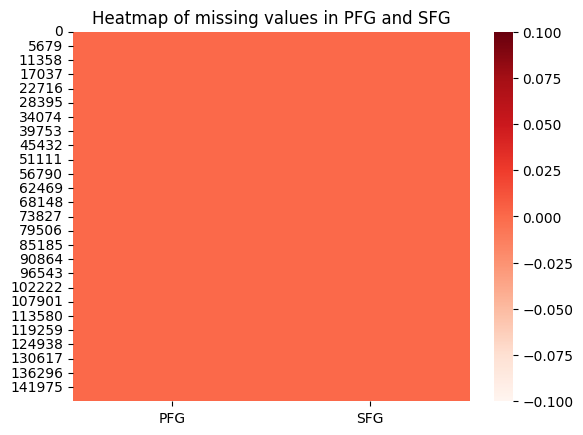

Duplicate rows:		114779

Interaction between PFG and WP


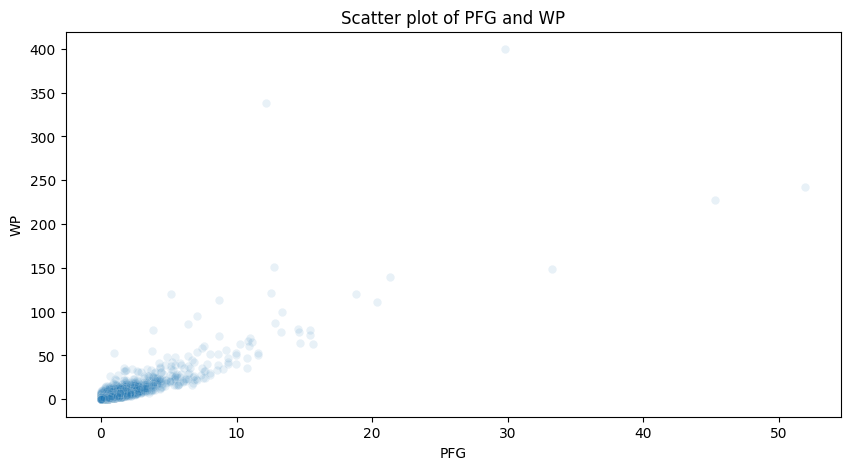

Correlation coefficients:
Spearman's correlation:	0.776
Pearson's correlation:	0.854
Kendall's correlation:	0.711
Missing values:
PFG    0
WP     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


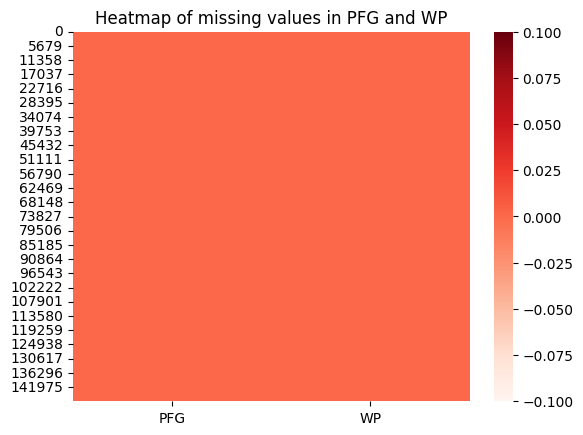

Duplicate rows:		99628

Interaction between PFG and WS


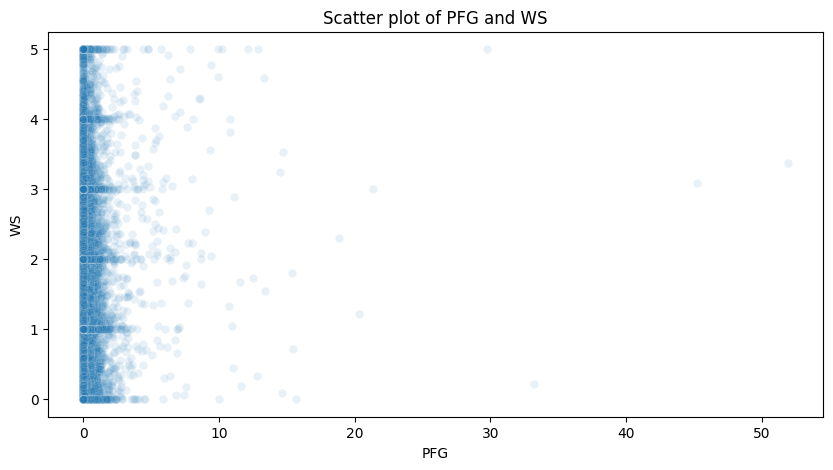

Correlation coefficients:
Spearman's correlation:	0.209
Pearson's correlation:	0.158
Kendall's correlation:	0.172
Missing values:
PFG    0
WS     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


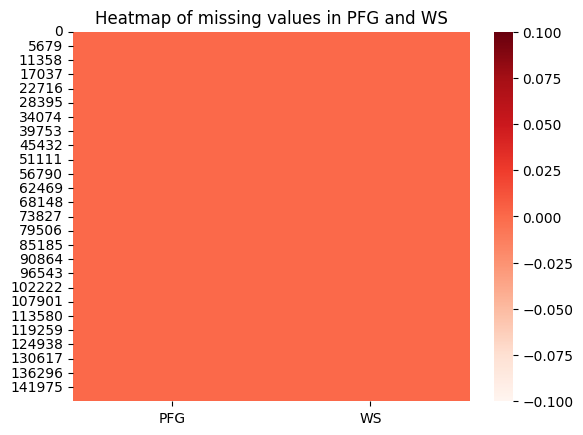

Duplicate rows:		70219

Interaction between PFG and AH


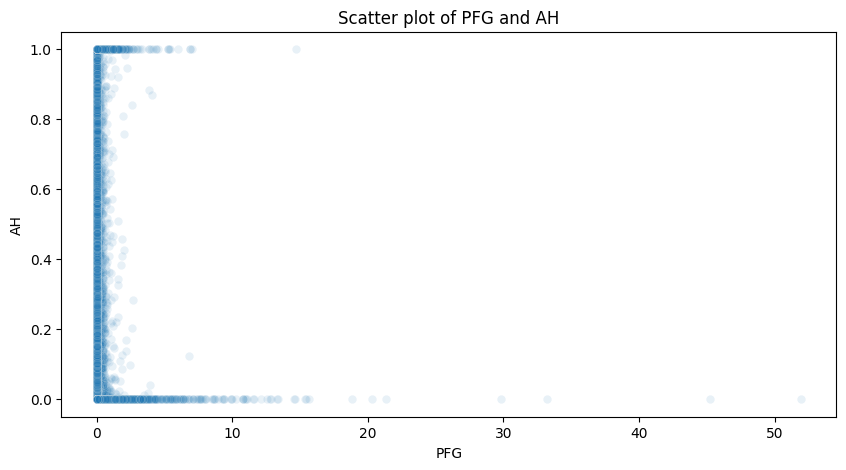

Correlation coefficients:
Spearman's correlation:	0.071
Pearson's correlation:	0.041
Kendall's correlation:	0.065
Missing values:
PFG    0
AH     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


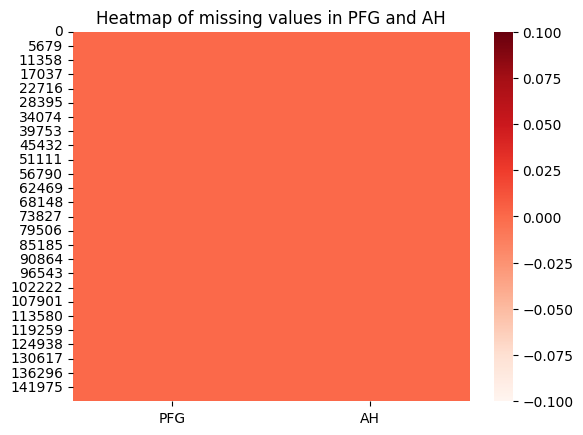

Duplicate rows:		118688

Interaction between PFG and AN


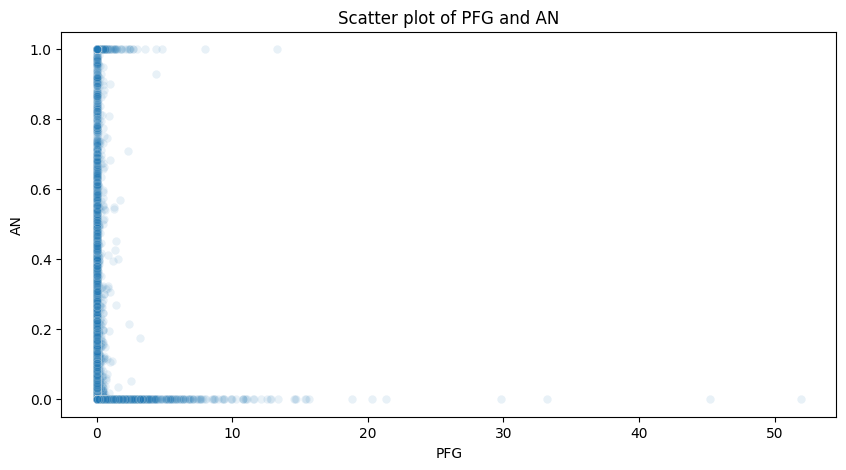

Correlation coefficients:
Spearman's correlation:	-0.007
Pearson's correlation:	0.017
Kendall's correlation:	-0.007
Missing values:
PFG    0
AN     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


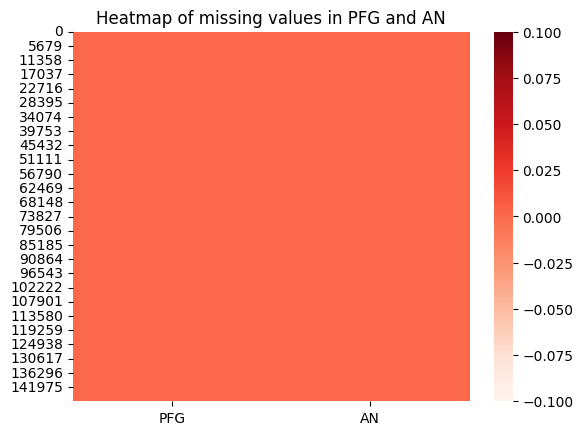

Duplicate rows:		124463

Interaction between PFG and Status


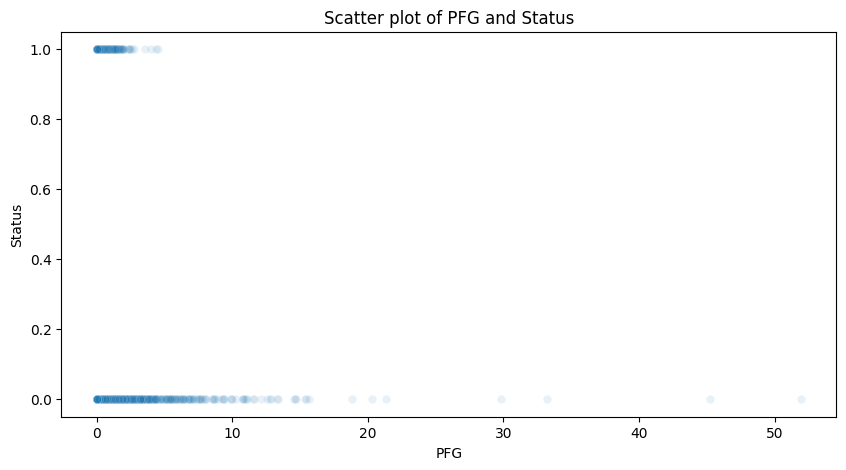

Correlation coefficients:
Spearman's correlation:	-0.138
Pearson's correlation:	-0.051
Kendall's correlation:	-0.130
Missing values:
PFG       0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


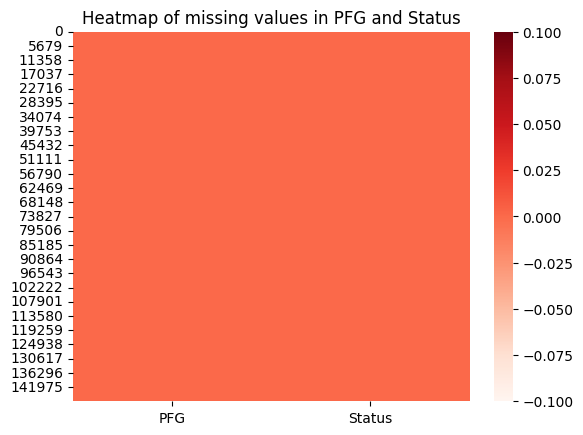

Duplicate rows:		125670

Interaction between PFG and FNC


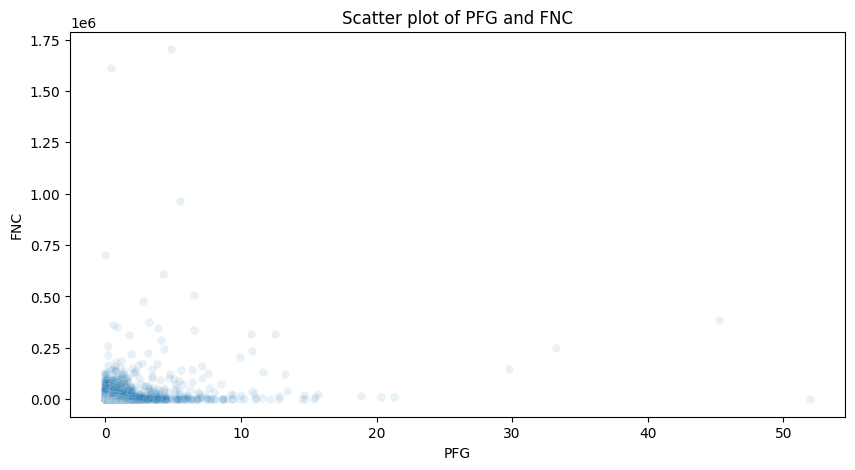

Correlation coefficients:
Spearman's correlation:	0.200
Pearson's correlation:	0.239
Kendall's correlation:	0.156
Missing values:
PFG    0
FNC    0
dtype: int64


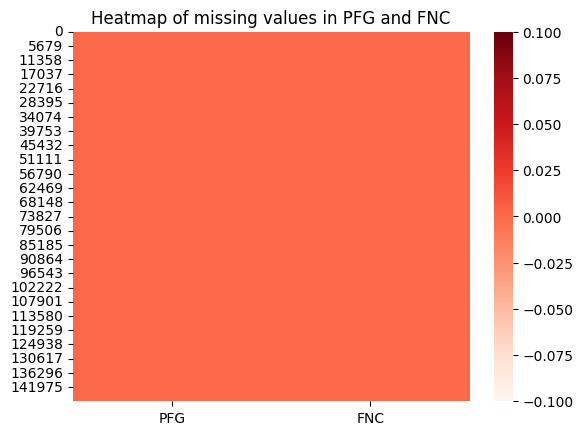

Duplicate rows:		56624

Interaction between SFD and SFG


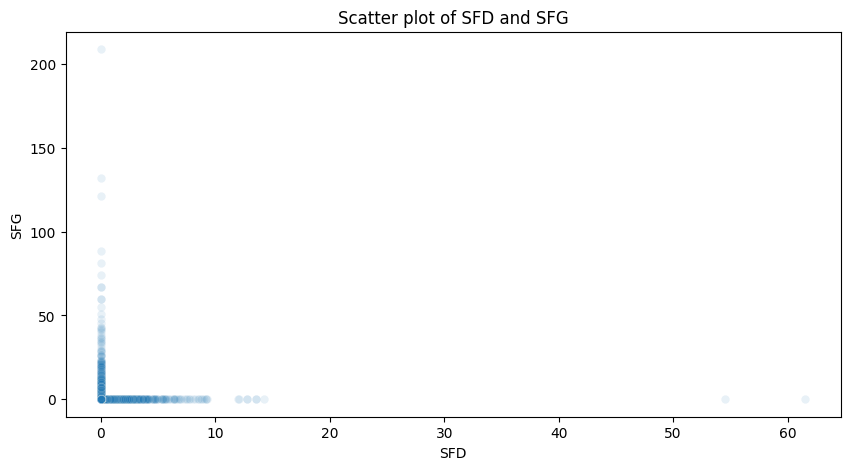

Correlation coefficients:
Spearman's correlation:	-0.142
Pearson's correlation:	-0.005
Kendall's correlation:	-0.133
Missing values:
SFD    0
SFG    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


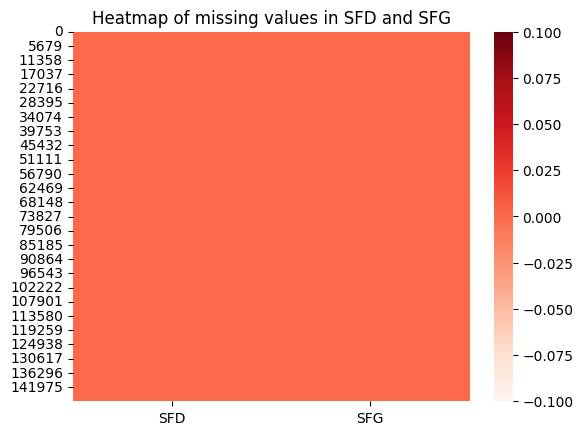

Duplicate rows:		123929

Interaction between SFD and WP


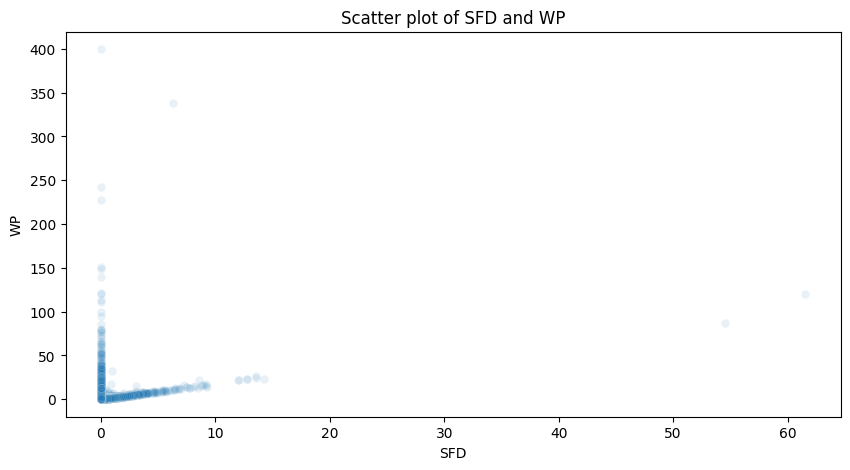

Correlation coefficients:
Spearman's correlation:	0.425
Pearson's correlation:	0.235
Kendall's correlation:	0.389
Missing values:
SFD    0
WP     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


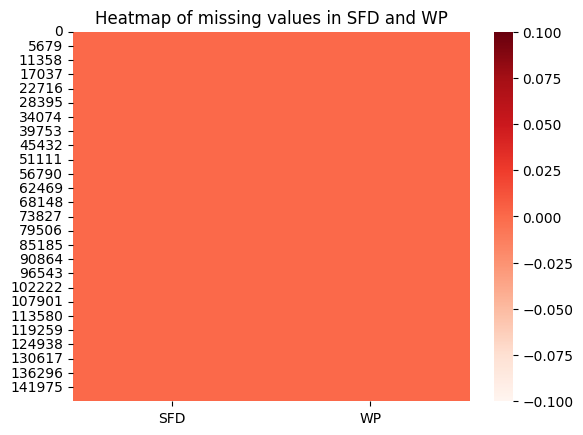

Duplicate rows:		101851

Interaction between SFD and WS


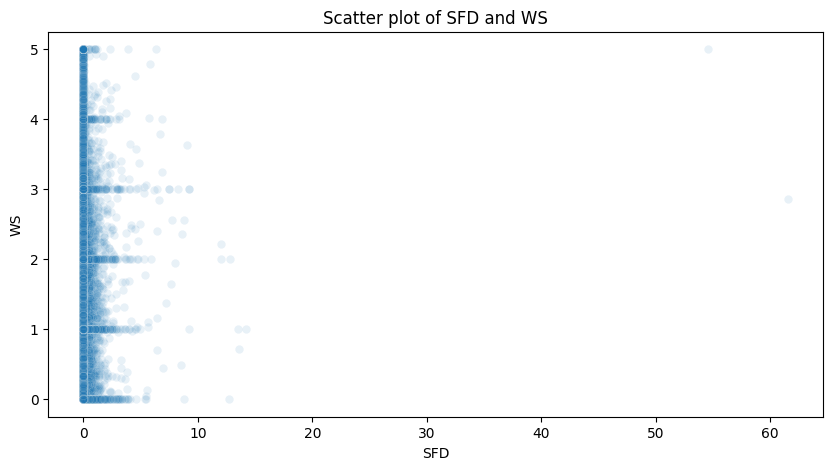

Correlation coefficients:
Spearman's correlation:	0.086
Pearson's correlation:	0.095
Kendall's correlation:	0.073
Missing values:
SFD    0
WS     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


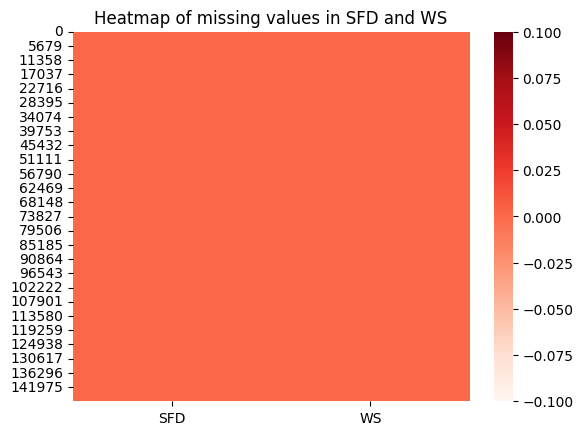

Duplicate rows:		75511

Interaction between SFD and AH


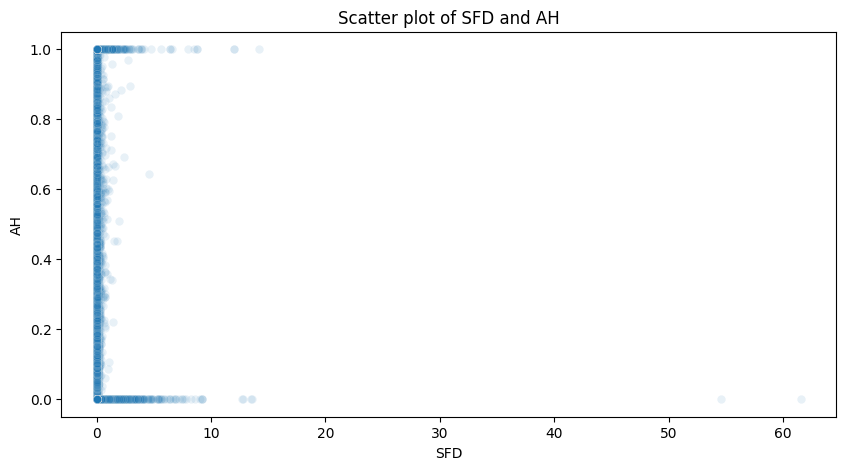

Correlation coefficients:
Spearman's correlation:	0.066
Pearson's correlation:	0.051
Kendall's correlation:	0.063
Missing values:
SFD    0
AH     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


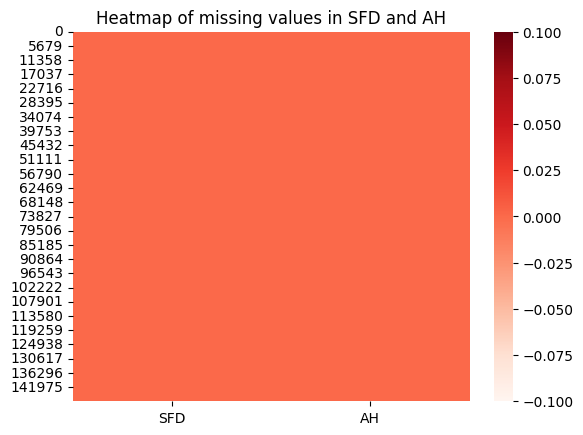

Duplicate rows:		129587

Interaction between SFD and AN


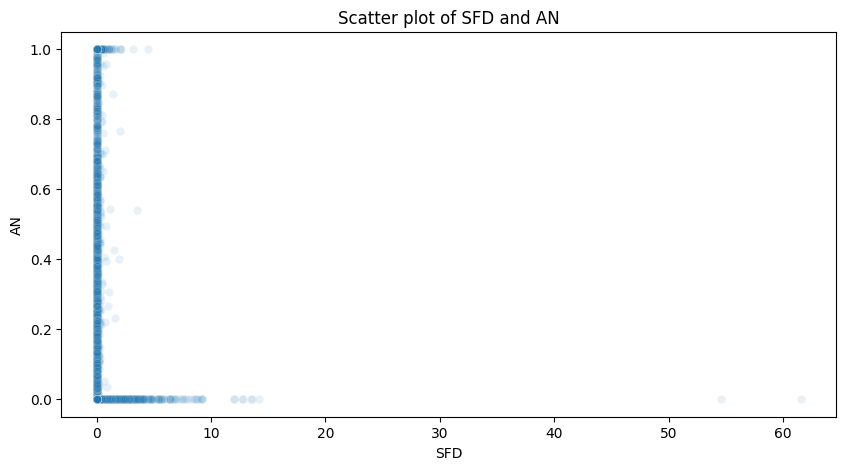

Correlation coefficients:
Spearman's correlation:	0.004
Pearson's correlation:	0.008
Kendall's correlation:	0.004
Missing values:
SFD    0
AN     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


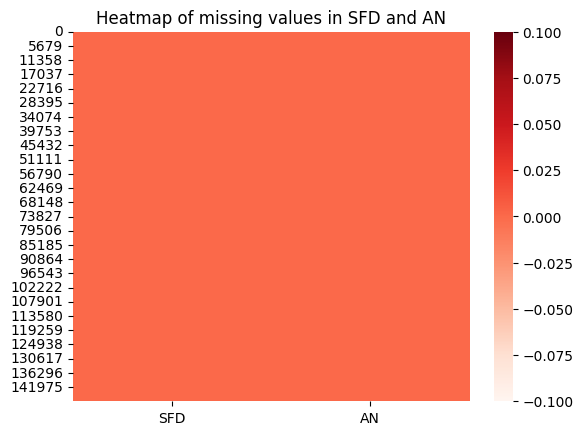

Duplicate rows:		134450

Interaction between SFD and Status


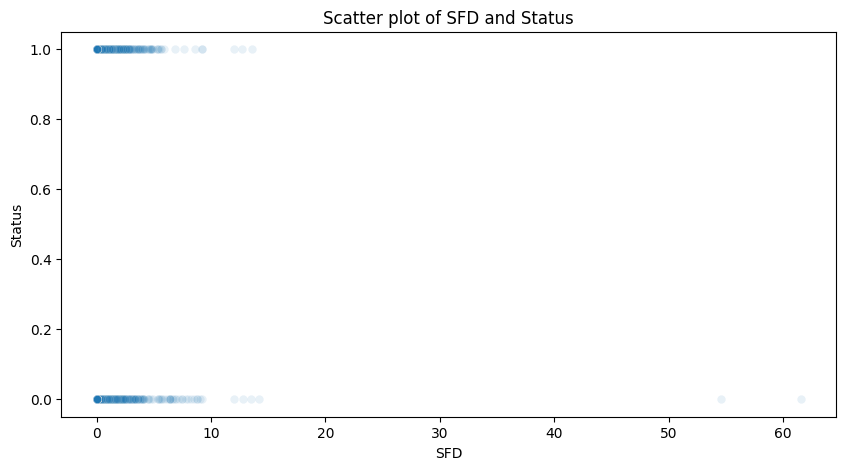

Correlation coefficients:
Spearman's correlation:	0.181
Pearson's correlation:	0.032
Kendall's correlation:	0.177
Missing values:
SFD       0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


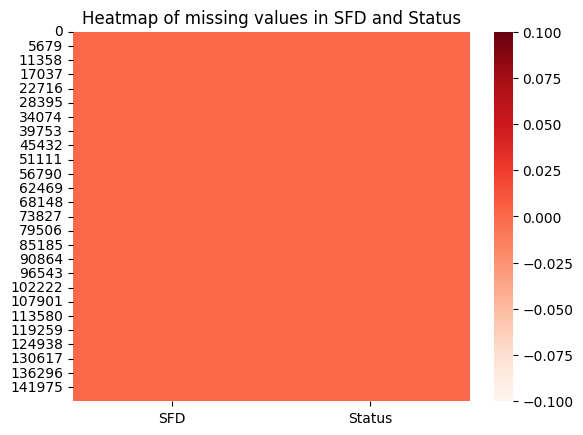

Duplicate rows:		136636

Interaction between SFD and FNC


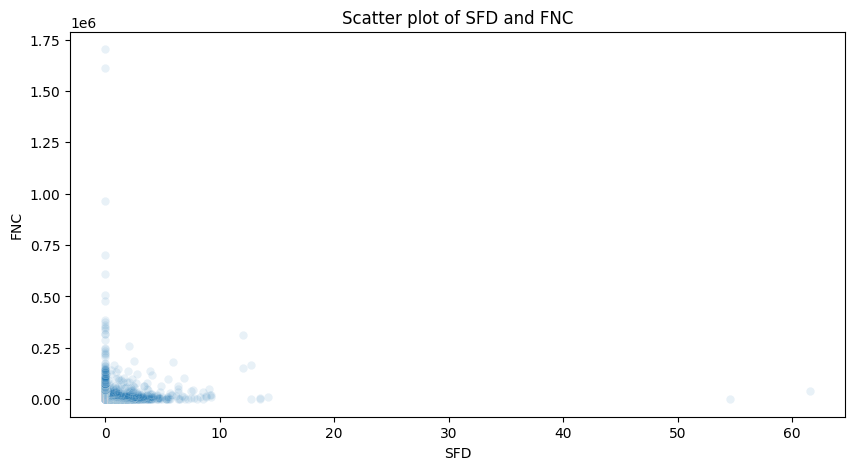

Correlation coefficients:
Spearman's correlation:	0.236
Pearson's correlation:	0.086
Kendall's correlation:	0.194
Missing values:
SFD    0
FNC    0
dtype: int64


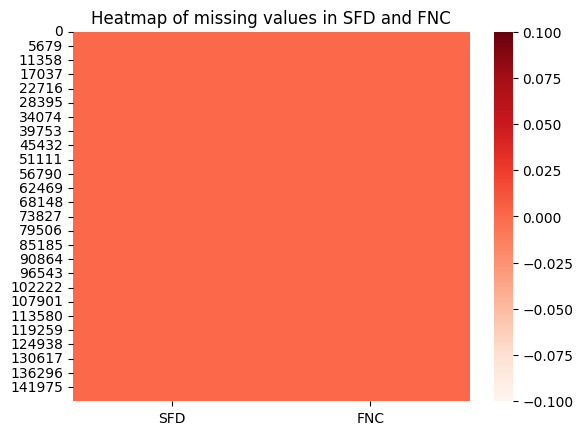

Duplicate rows:		68376

Interaction between SFG and WP


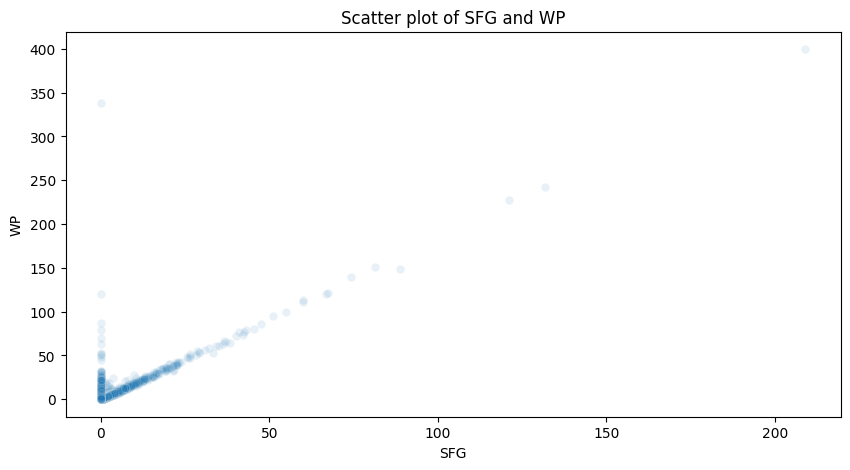

Correlation coefficients:
Spearman's correlation:	0.568
Pearson's correlation:	0.855
Kendall's correlation:	0.523
Missing values:
SFG    0
WP     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


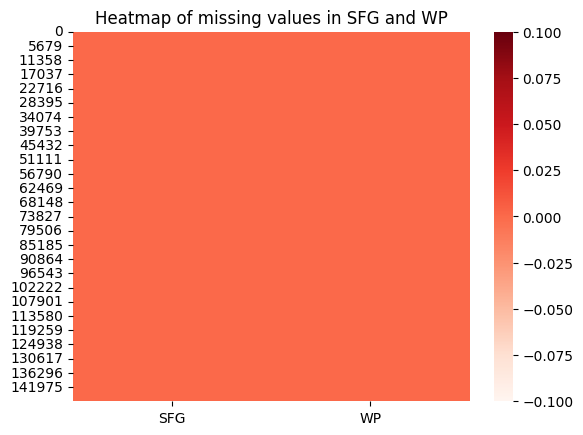

Duplicate rows:		100676

Interaction between SFG and WS


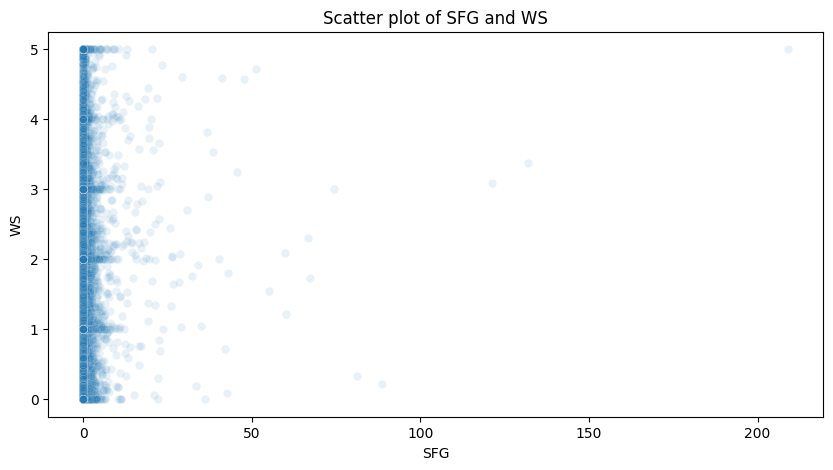

Correlation coefficients:
Spearman's correlation:	0.212
Pearson's correlation:	0.109
Kendall's correlation:	0.180
Missing values:
SFG    0
WS     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


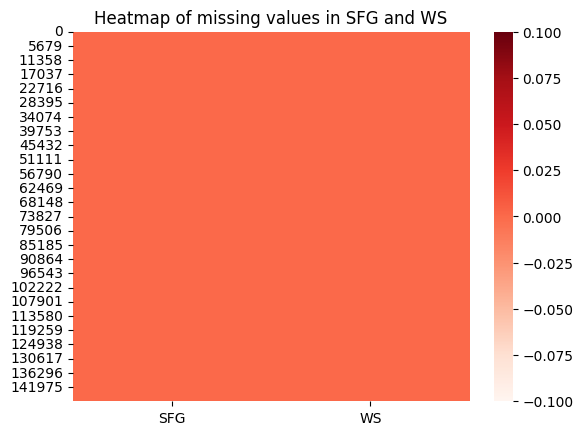

Duplicate rows:		75618

Interaction between SFG and AH


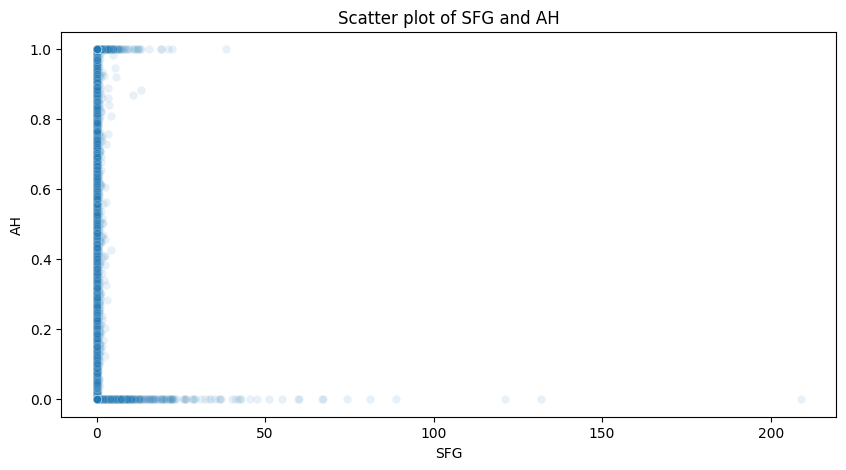

Correlation coefficients:
Spearman's correlation:	0.058
Pearson's correlation:	0.028
Kendall's correlation:	0.054
Missing values:
SFG    0
AH     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


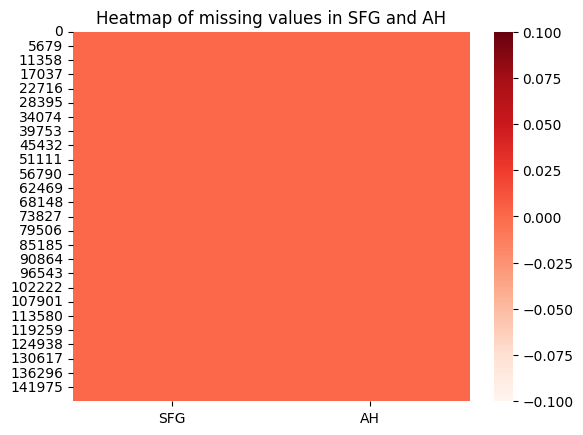

Duplicate rows:		124488

Interaction between SFG and AN


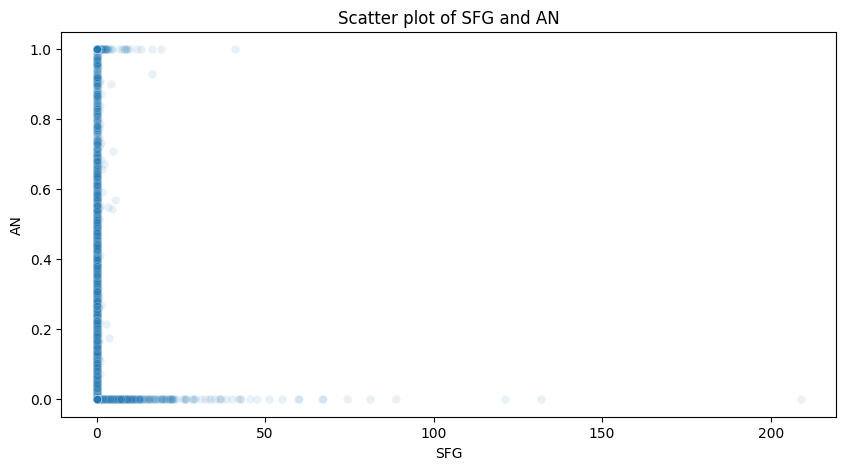

Correlation coefficients:
Spearman's correlation:	-0.004
Pearson's correlation:	0.015
Kendall's correlation:	-0.004
Missing values:
SFG    0
AN     0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


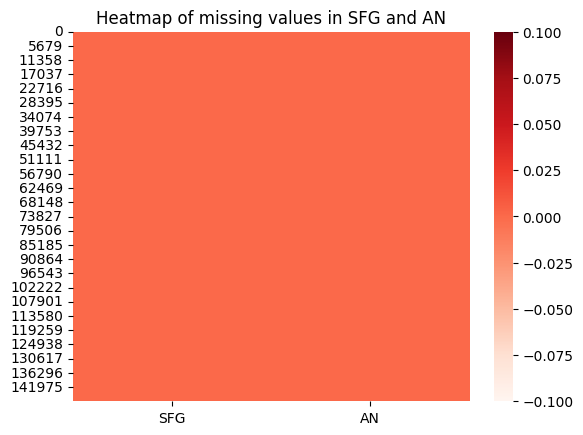

Duplicate rows:		129449

Interaction between SFG and Status


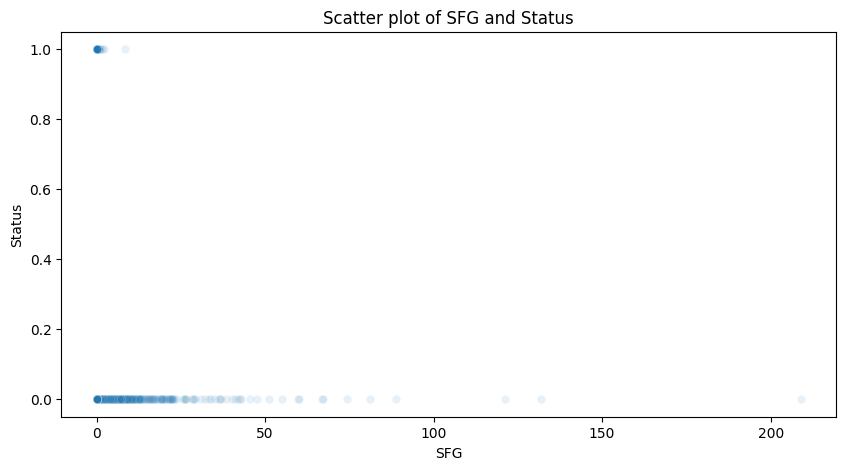

Correlation coefficients:
Spearman's correlation:	-0.274
Pearson's correlation:	-0.041
Kendall's correlation:	-0.264
Missing values:
SFG       0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


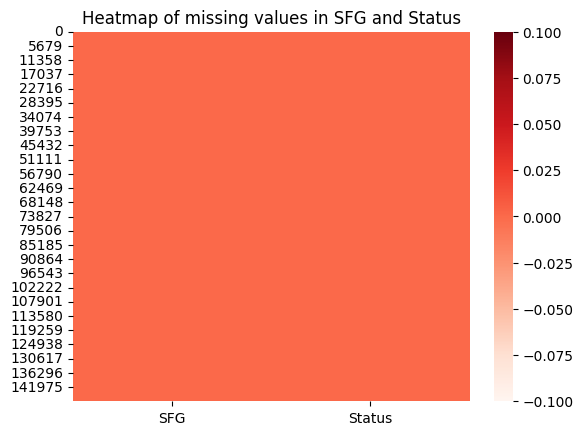

Duplicate rows:		133219

Interaction between SFG and FNC


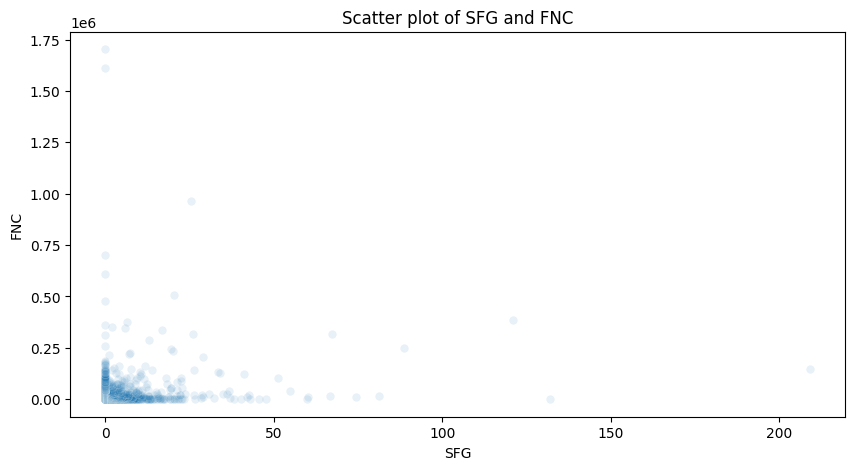

Correlation coefficients:
Spearman's correlation:	0.169
Pearson's correlation:	0.204
Kendall's correlation:	0.141
Missing values:
SFG    0
FNC    0
dtype: int64


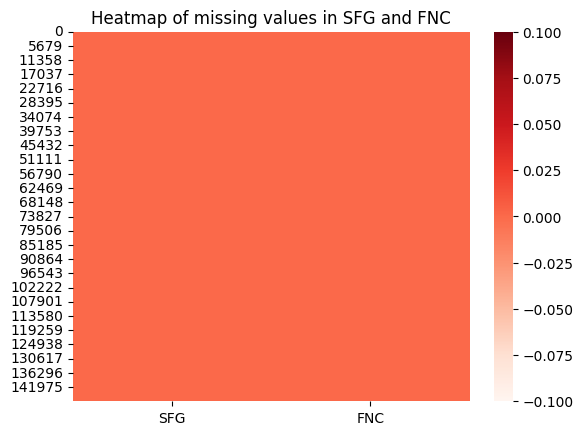

Duplicate rows:		62912

Interaction between WP and WS


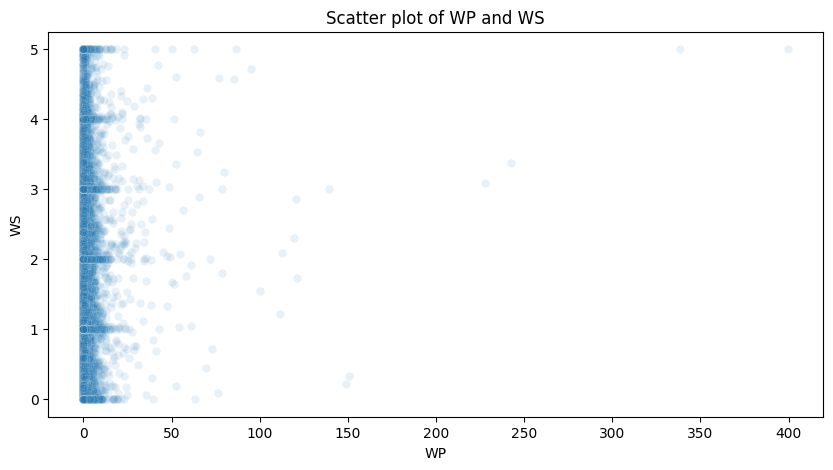

Correlation coefficients:
Spearman's correlation:	0.256
Pearson's correlation:	0.153
Kendall's correlation:	0.208
Missing values:
WP    0
WS    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


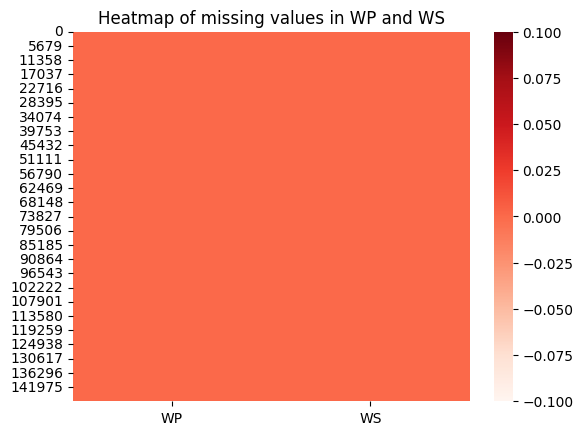

Duplicate rows:		62358

Interaction between WP and AH


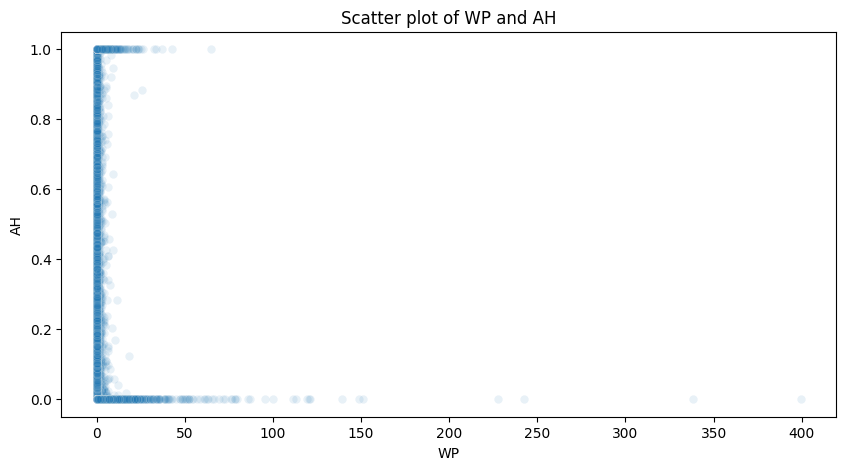

Correlation coefficients:
Spearman's correlation:	0.080
Pearson's correlation:	0.032
Kendall's correlation:	0.071
Missing values:
WP    0
AH    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


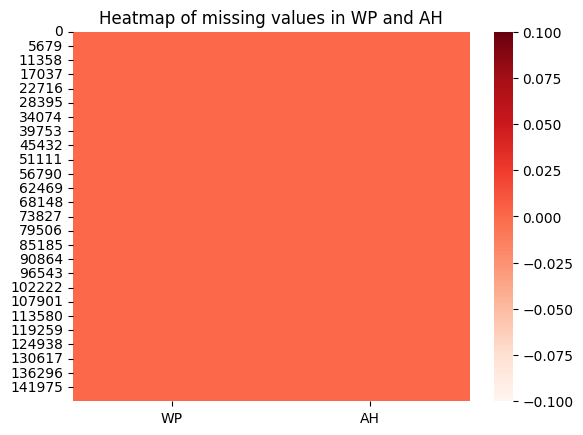

Duplicate rows:		98095

Interaction between WP and AN


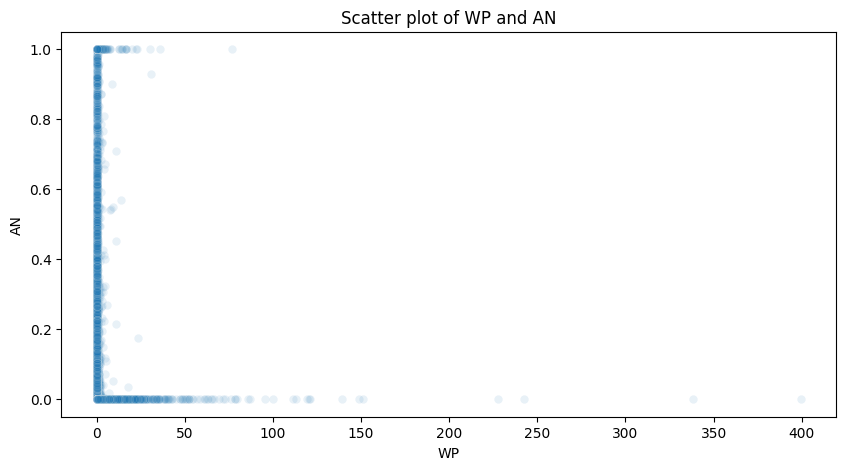

Correlation coefficients:
Spearman's correlation:	-0.006
Pearson's correlation:	0.014
Kendall's correlation:	-0.005
Missing values:
WP    0
AN    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


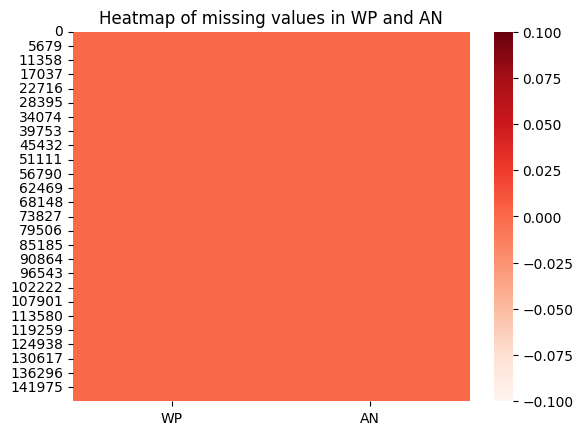

Duplicate rows:		102393

Interaction between WP and Status


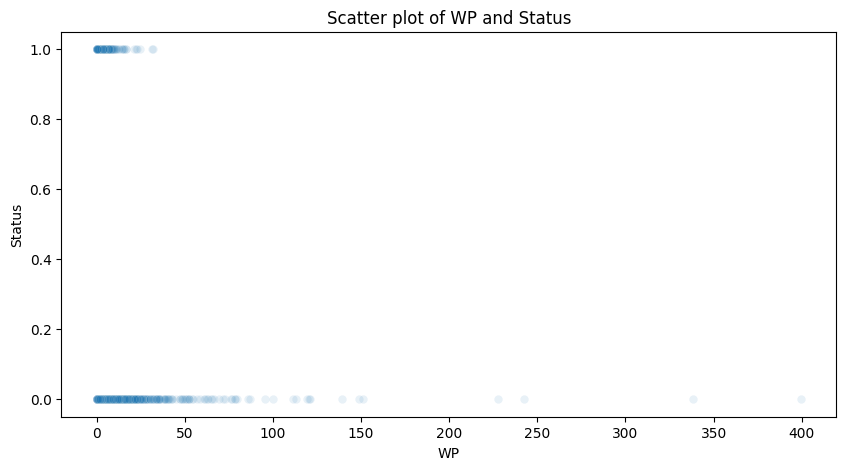

Correlation coefficients:
Spearman's correlation:	-0.147
Pearson's correlation:	-0.038
Kendall's correlation:	-0.134
Missing values:
WP        0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


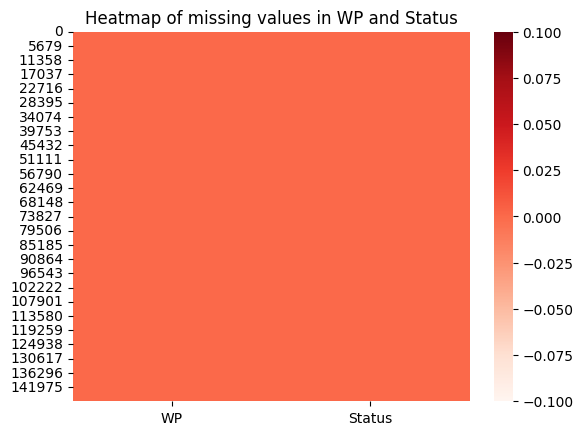

Duplicate rows:		104128

Interaction between WP and FNC


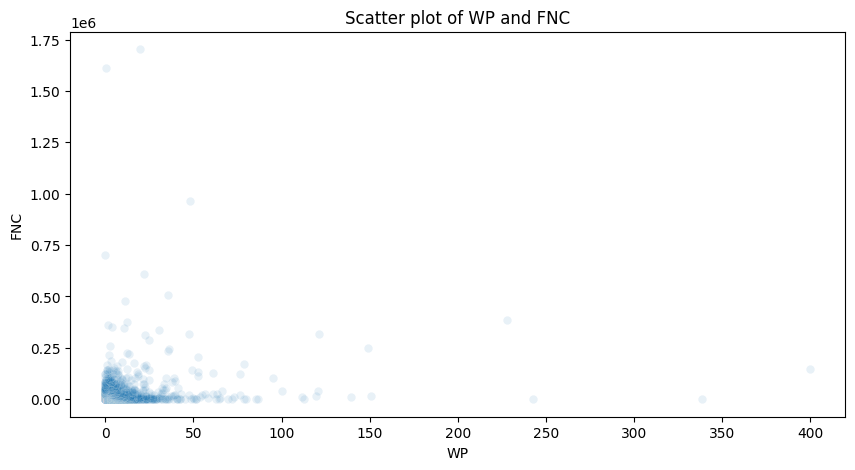

Correlation coefficients:
Spearman's correlation:	0.230
Pearson's correlation:	0.221
Kendall's correlation:	0.176
Missing values:
WP     0
FNC    0
dtype: int64


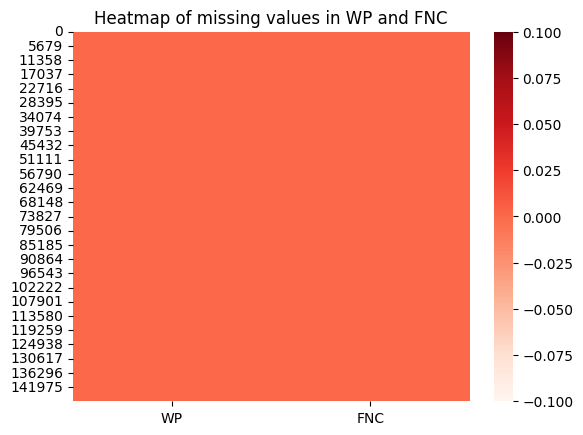

Duplicate rows:		48458

Interaction between WS and AH


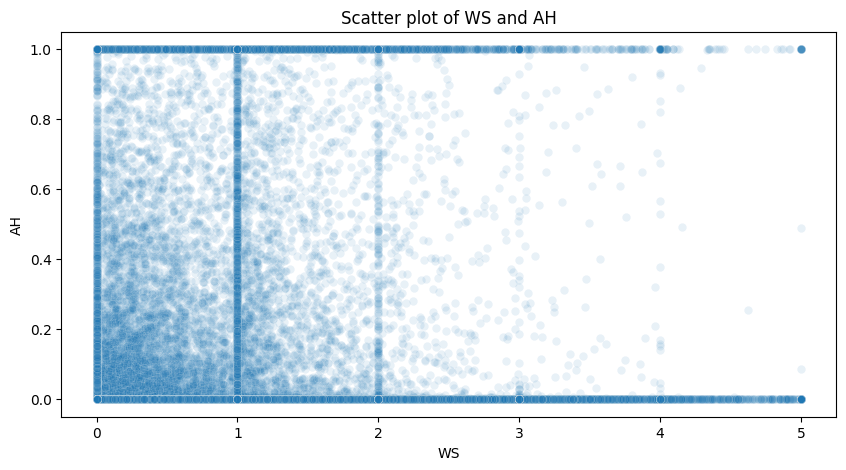

Correlation coefficients:
Spearman's correlation:	0.161
Pearson's correlation:	0.182
Kendall's correlation:	0.138
Missing values:
WS    0
AH    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


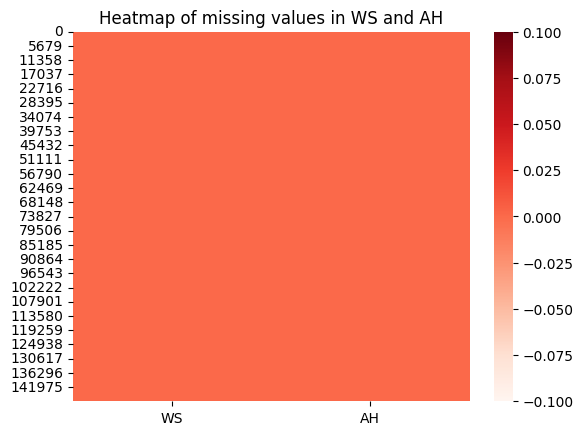

Duplicate rows:		76471

Interaction between WS and AN


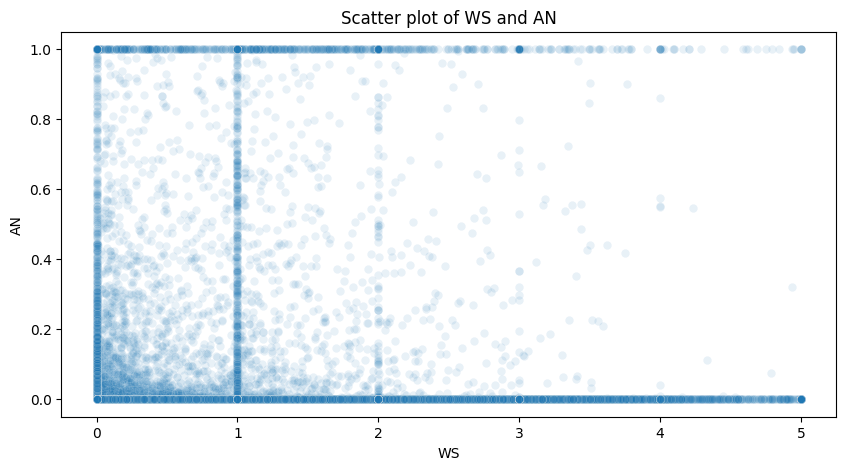

Correlation coefficients:
Spearman's correlation:	-0.005
Pearson's correlation:	0.101
Kendall's correlation:	-0.004
Missing values:
WS    0
AN    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


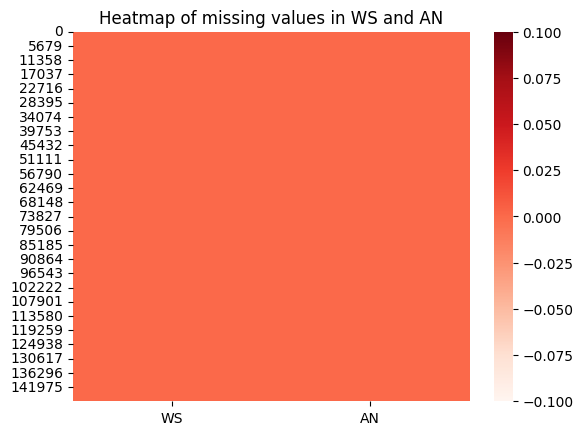

Duplicate rows:		78901

Interaction between WS and Status


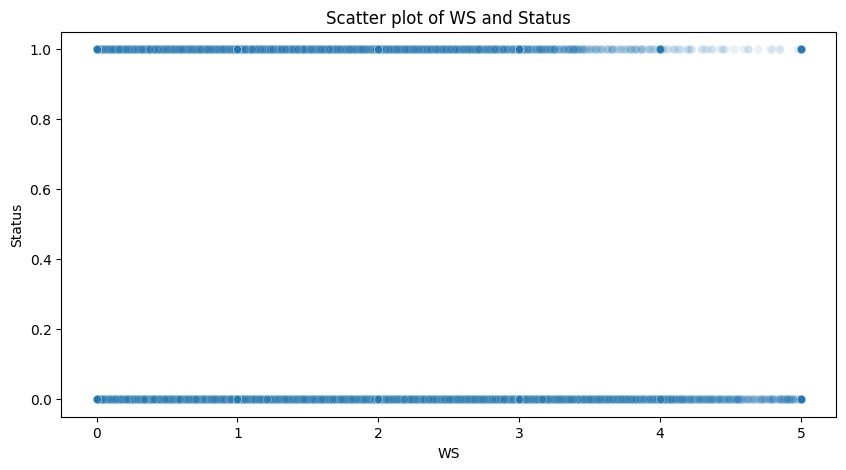

Correlation coefficients:
Spearman's correlation:	-0.229
Pearson's correlation:	-0.139
Kendall's correlation:	-0.199
Missing values:
WS        0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


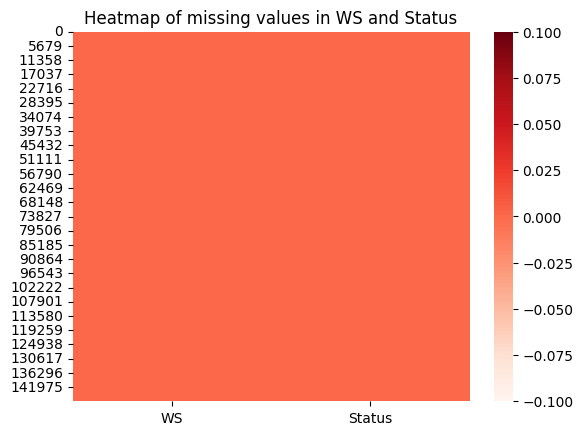

Duplicate rows:		80217

Interaction between WS and FNC


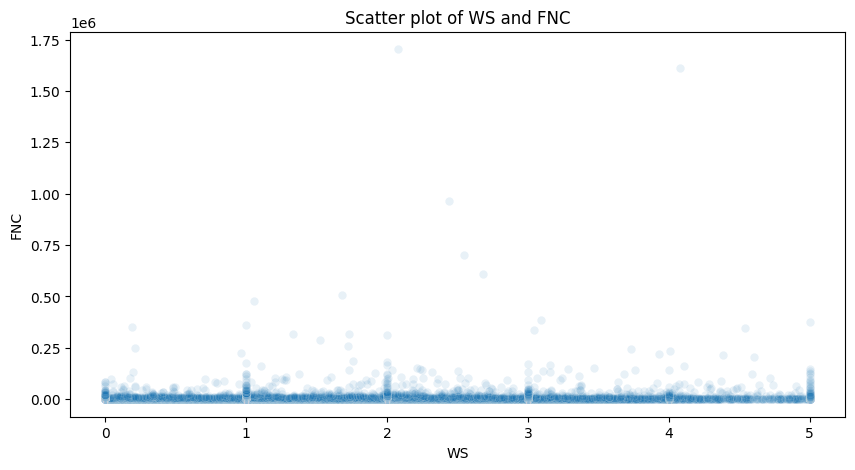

Correlation coefficients:
Spearman's correlation:	0.533
Pearson's correlation:	0.107
Kendall's correlation:	0.399
Missing values:
WS     0
FNC    0
dtype: int64


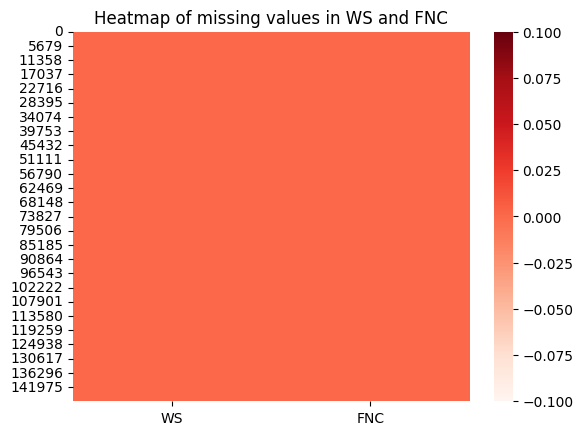

Duplicate rows:		42210

Interaction between AH and AN


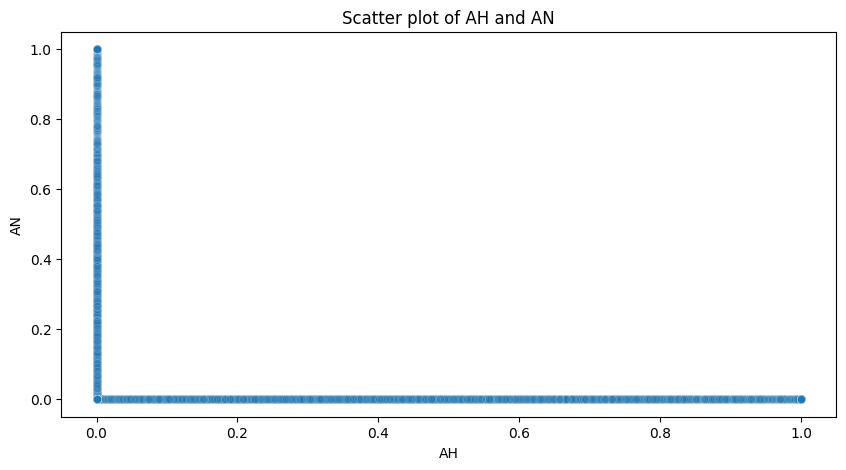

Correlation coefficients:
Spearman's correlation:	-0.098
Pearson's correlation:	-0.033
Kendall's correlation:	-0.093
Missing values:
AH    0
AN    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


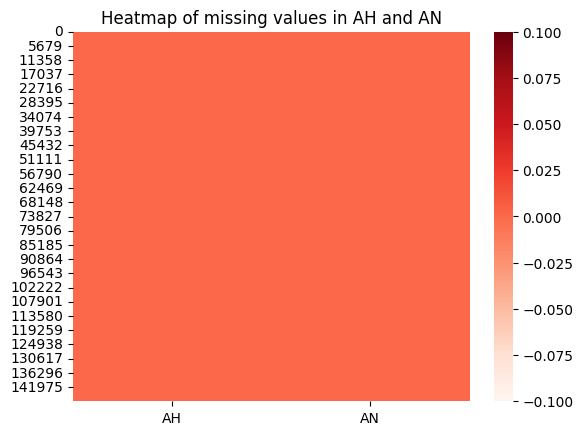

Duplicate rows:		135640

Interaction between AH and Status


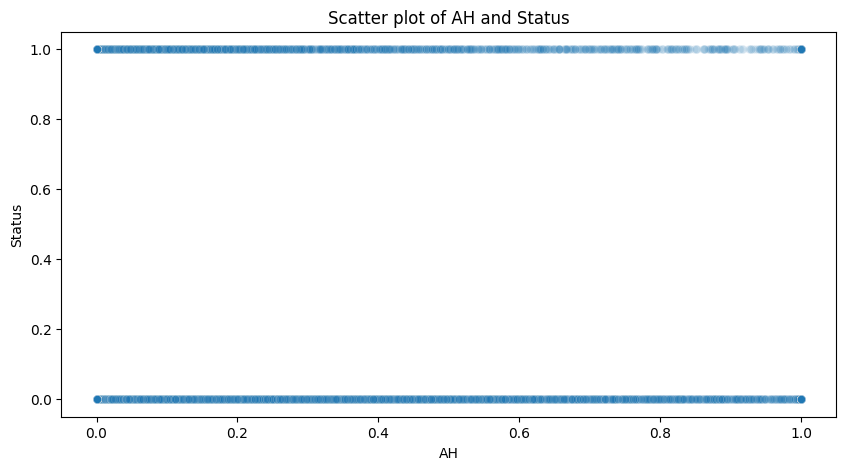

Correlation coefficients:
Spearman's correlation:	-0.028
Pearson's correlation:	-0.037
Kendall's correlation:	-0.027
Missing values:
AH        0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


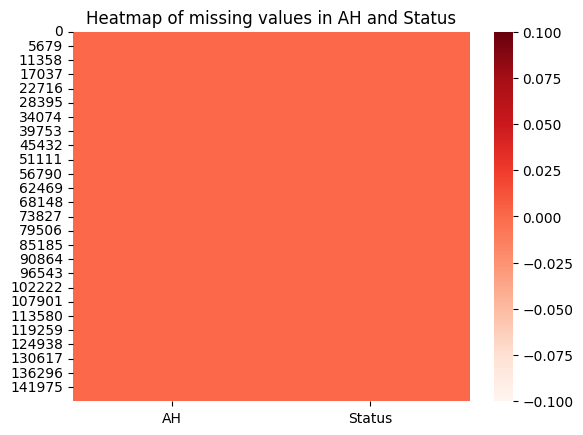

Duplicate rows:		137900

Interaction between AH and FNC


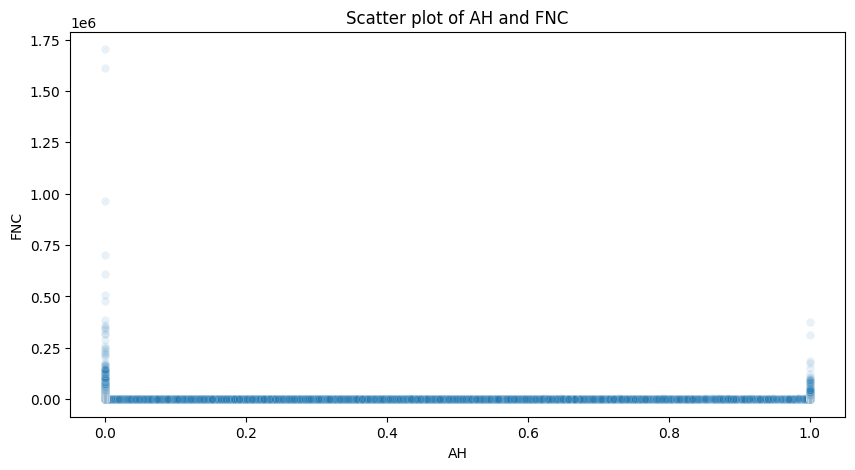

Correlation coefficients:
Spearman's correlation:	0.179
Pearson's correlation:	0.037
Kendall's correlation:	0.151
Missing values:
AH     0
FNC    0
dtype: int64


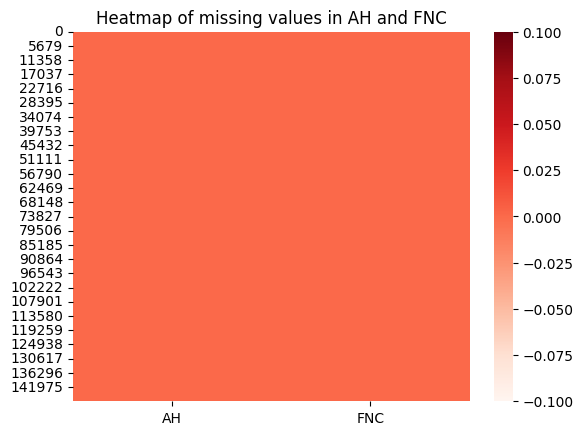

Duplicate rows:		65970

Interaction between AN and Status


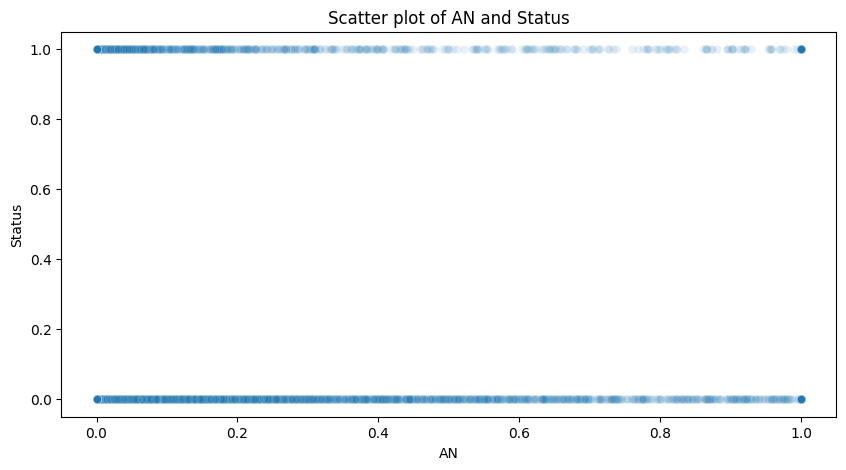

Correlation coefficients:
Spearman's correlation:	-0.033
Pearson's correlation:	-0.028
Kendall's correlation:	-0.033
Missing values:
AN        0
Status    0
dtype: int64


/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5278: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


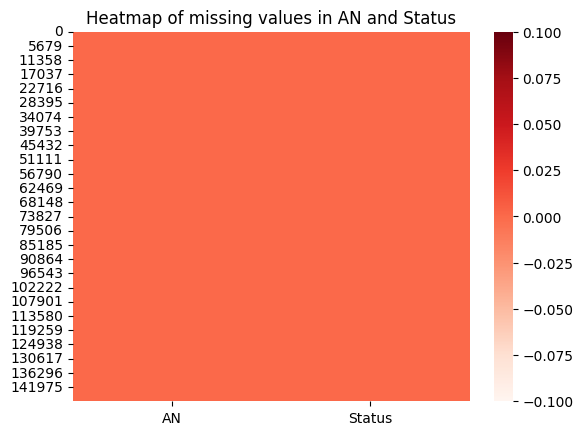

Duplicate rows:		143521

Interaction between AN and FNC


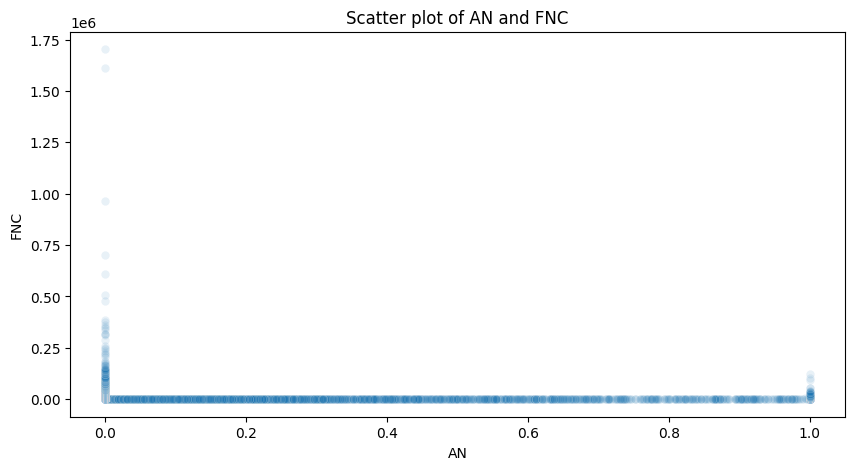

Correlation coefficients:
Spearman's correlation:	0.029
Pearson's correlation:	0.013
Kendall's correlation:	0.026
Missing values:
AN     0
FNC    0
dtype: int64


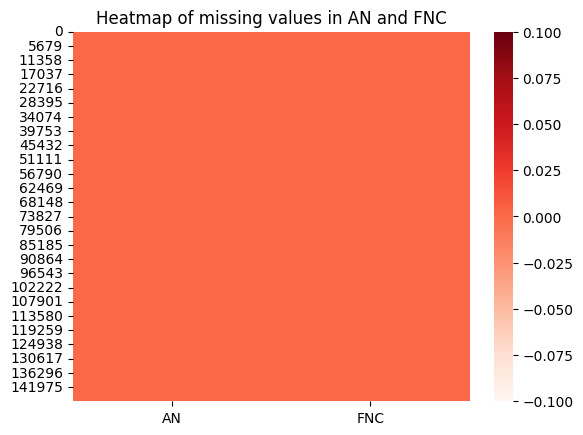

Duplicate rows:		68938

Interaction between Status and FNC


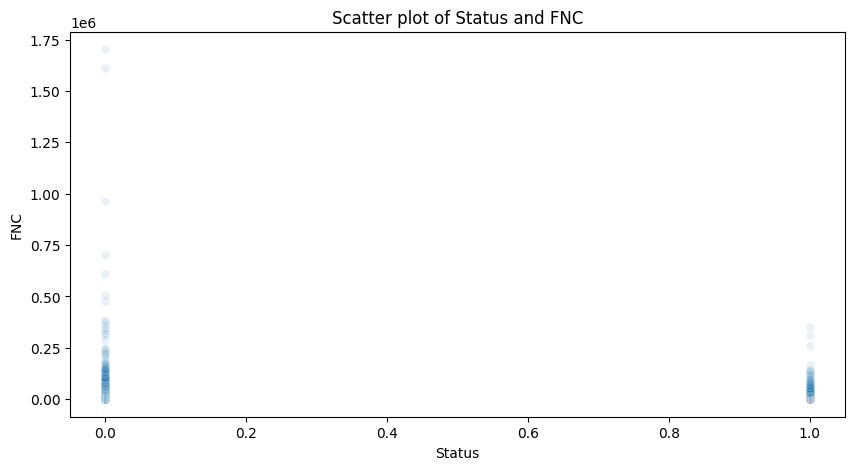

Correlation coefficients:
Spearman's correlation:	-0.132
Pearson's correlation:	-0.001
Kendall's correlation:	-0.109
Missing values:
Status    0
FNC       0
dtype: int64


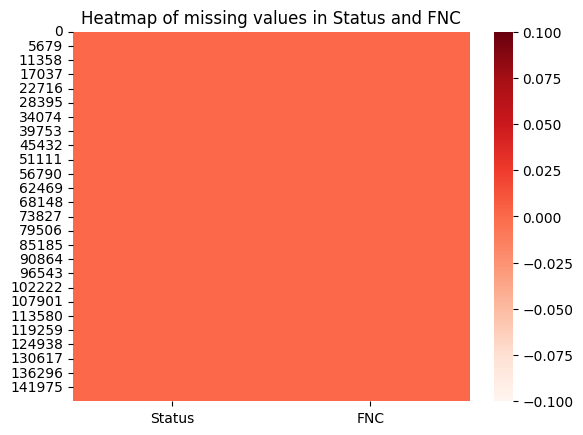

Duplicate rows:		66417



In [ ]:
# Interactions between 2 columns
for i in range(len(dataset.columns) - 1):
    for j in range(i + 1, len(dataset.columns)):
        col1, col2 = dataset.columns[i], dataset.columns[j]
        print(f"Interaction between {col1} and {col2}")
        
        # Scatter plot
        plt.figure(figsize=(10, 5))
        sns.scatterplot(x=col1, y=col2, data=dataset, alpha=0.1)
        plt.title(f"Scatter plot of {col1} and {col2}")
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

        # Correlation coefficients
        print("Correlation coefficients:")
        corr_spearman = dataset[[col1, col2]].corr(method="spearman").iloc[0, 1]
        print(f"Spearman's correlation:\t{corr_spearman:.3f}")
        corr_pearson = dataset[[col1, col2]].corr(method="pearson").iloc[0, 1]
        print(f"Pearson's correlation:\t{corr_pearson:.3f}")
        corr_kendall = dataset[[col1, col2]].corr(method="kendall").iloc[0, 1]
        print(f"Kendall's correlation:\t{corr_kendall:.3f}")
        
        # Phi coefficient for categorical variables
        if len(dataset[col1].unique()) <= 2 and len(dataset[col2].unique()) <= 2:
            cont_table = pd.crosstab(dataset[col1], dataset[col2])
            phi_k = np.sqrt(cont_table.sum().sum() * cont_table.iloc[1, 1] * cont_table.iloc[0, 0] * cont_table.iloc[1, 0] /
                              (cont_table.iloc[0, 1] * cont_table.iloc[1, 0] * cont_table.iloc[0, 0] * cont_table.iloc[1, 1]))
            print(f"Phi coefficient:\t\t{phi_k:.3f}")
            
        # Missing values
        print(f"Missing values:")
        print(dataset[[col1, col2]].isna().sum())
        sns.heatmap(dataset[[col1, col2]].isna(), cmap="Reds")
        plt.title(f"Heatmap of missing values in {col1} and {col2}")
        plt.show()
        
        # Duplicate rows
        print(f"Duplicate rows:\t\t{dataset.duplicated([col1, col2]).sum()}\n")

# $\textbf{Algorithm and Results}$

In [ ]:
data = dataset.drop(['Status'],axis = 1)
labels = dataset['Status']

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.3, random_state = 30)

In [ ]:
class LogisticRegression(torch.nn.Module):

    def __init__(self, input_dim, output_dim):
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(input_dim,output_dim)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        return self.sigmoid(self.linear(x))

In [ ]:
def Cost_sensitive_loss(h,y,C_FN):
    y = y.float()
    C_FN = C_FN.float()
    C_FP = 4*torch.ones(len(y)).float()
    C_TN = torch.zeros(len(y)).float()
    C_TP = 4*torch.ones(len(y)).float()
    return (torch.dot(y * C_TP , h[:,0]) + torch.dot(y * C_FN , 1 - h[:,0]) + torch.dot((1 - y) * C_TN, 1 - h[:,0]) + torch.dot((1 - y) * C_FP, h[:,0]))/len(y)

In [ ]:
input_dimension = len(data.columns) - 1
output_dimension = 1
model = LogisticRegression(input_dimension,output_dimension)
optimizer = torch.optim.Adam(model.parameters(),lr = 0.05)

num_epochs = 20000

train_losses = []
train_accuracies = []
test_losses = []
test_accuracies = []

for epoch in range(num_epochs):
  correct_train = 0
  total_samples_train = 0

  features_train = torch.tensor(train_data.drop(['FNC'], axis = 1).values)
  labels_train = torch.tensor(train_labels.values)
  C_FN_train = torch.tensor(train_data['FNC'].values)
            
  optimizer.zero_grad()

  output_train = model(features_train.float())
      
  train_loss = Cost_sensitive_loss(output_train,labels_train,C_FN_train)
  train_losses.append(train_loss.item()/len(labels_train))

  predicted_train = torch.round(output_train[:,0])
  correct_train += torch.sum(predicted_train == labels_train)
  total_samples_train += len(labels_train)

  train_accuracy = (100*correct_train)/total_samples_train
  train_accuracies.append(train_accuracy)
            
  train_loss.backward()
  optimizer.step()
  
  if epoch % 200 == 0:    
    with torch.no_grad():
      correct_test = 0
      total_samples_test = 0

      features_test = torch.tensor(test_data.drop(['FNC'], axis = 1).values)
      labels_test = torch.tensor(test_labels.values)
      C_FN_test = torch.tensor(test_data['FNC'].values)
                
      output_test = model(features_test.float())

      test_loss = Cost_sensitive_loss(output_test,labels_test,C_FN_test)
      test_losses.append(test_loss/len(labels_test))
          
      predicted_test = torch.round(output_test[:,0])
      correct_test += torch.sum(predicted_test == labels_test)
      total_samples_test += len(labels_test)

      test_accuracy = (100*correct_test)/total_samples_test
      test_accuracies.append(test_accuracy)

      print(f"Epoch: {epoch}, Training loss: {train_loss.item()/len(labels_train)},Train accuracy: {train_accuracy},Test Loss: {test_loss/len(labels_test)}, Test accuracy: {test_accuracy}")

Epoch: 0, Training loss: 0.00114626077235515,Train accuracy: 13.80037784576416,Test Loss: 0.0017536754021421075, Test accuracy: 15.81811237335205
Epoch: 200, Training loss: 3.870656248204588e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031481749843806e-05, Test accuracy: 29.90900993347168
Epoch: 400, Training loss: 3.8706548639949266e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031475929077715e-05, Test accuracy: 29.90900993347168
Epoch: 600, Training loss: 3.8706525569788236e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031471563503146e-05, Test accuracy: 29.90900993347168
Epoch: 800, Training loss: 3.8706502499627214e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031466470332816e-05, Test accuracy: 29.90900993347168
Epoch: 1000, Training loss: 3.870647020140178e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031459921970963e-05, Test accuracy: 29.90900993347168
Epoch: 1200, Training loss: 3.870644251720855e-05,Train accuracy: 29.83695411682129,Test Loss: 9.031

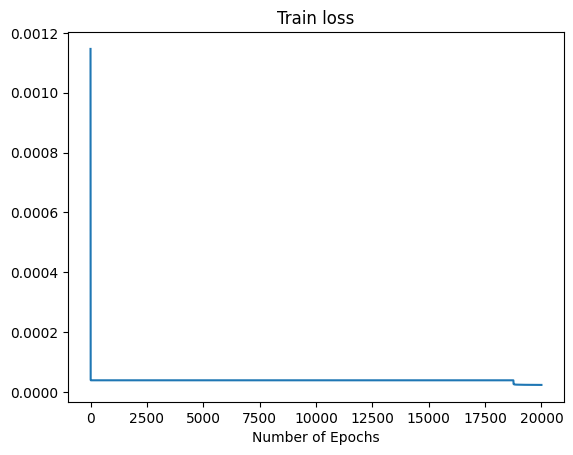

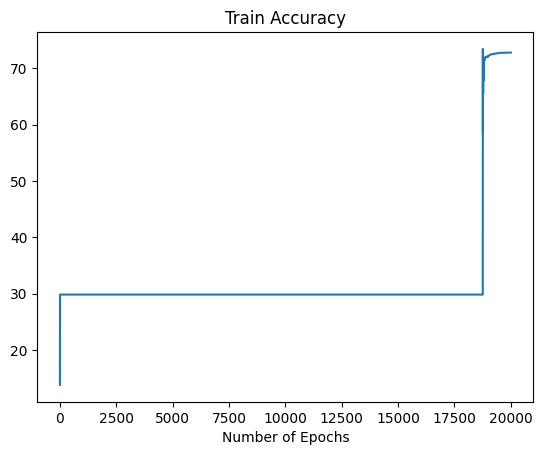

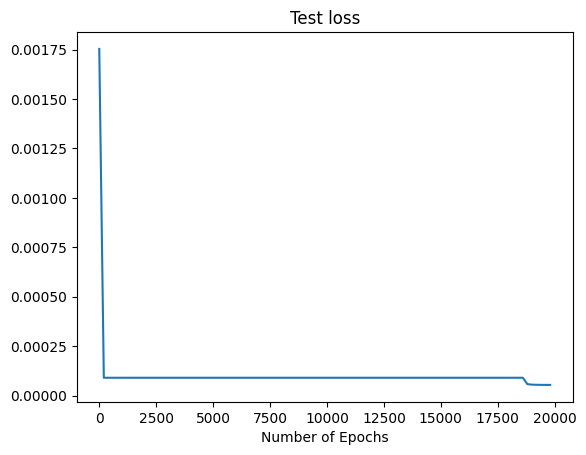

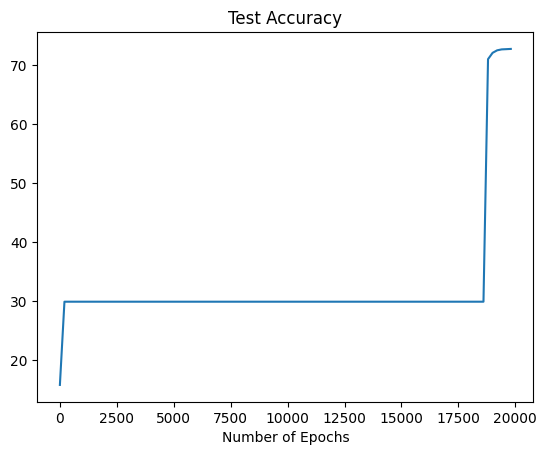

In [ ]:
plt.plot(np.arange(0,num_epochs),train_losses)
plt.xlabel('Number of Epochs')
plt.title('Train loss')
plt.show()

plt.plot(np.arange(0,num_epochs),train_accuracies)
plt.xlabel('Number of Epochs')
plt.title('Train Accuracy')
plt.show()

plt.plot(np.arange(0,num_epochs,200),test_losses)
plt.xlabel('Number of Epochs')
plt.title('Test loss')
plt.show()

plt.plot(np.arange(0,num_epochs,200),test_accuracies)
plt.xlabel('Number of Epochs')
plt.title('Test Accuracy')
plt.show()

### $\textbf{References}$
- $\href{https://towardsdatascience.com/logistic-regression-with-pytorch-3c8bbea594be}{\text{Logistic Regression with PyTorch}}$